In [1]:
import pandas as pd
import os
import matplotlib.pyplot as plt
import seaborn as sns
import shutil
from sklearn.preprocessing import OneHotEncoder




In [2]:
# --- 1. Load CSV ---
df = pd.read_csv("/scratch/bds/OSIC/Merge_CRF_fill.csv", low_memory=False)

# --- 2. Load patient IDs properly ---
valid_ids = []
#gnerate the txt file from classification_exploration.ipynb
with open("/home/pansurya/OSIC_thesis/followup_patients_48_57.txt") as f:
    for line in f:
        # split by comma in case IDs are comma-separated on one line
        parts = line.strip().split(",")
        valid_ids.extend(parts)

# --- 3. Normalize types ---
df["Subject ID"] = df["Subject ID"]
valid_ids = [int(x) for x in valid_ids if x.strip()]

# --- 4. Filter ---
df1 = df[df["Subject ID"].isin(valid_ids)]
filtered_df = df1.sort_values(by=['Subject ID'])

# --- 5. Save ---
filtered_df.to_csv(
    "/scratch/bds/OSIC/PATIENTS_DICOM_STRUCTURE_MAIN/Merge_CRF_fill_filtered.csv",
    index=False
)

print(f"Original rows: {len(df)}")
print(f"Filtered rows: {len(filtered_df)}")
print("First few kept patients:\n", filtered_df.head())


# Number of unique patients
unique_patients = filtered_df["Subject ID"].nunique()

print("Unique patients:", unique_patients)


Original rows: 13231
Filtered rows: 2253
First few kept patients:
        Subject ID  Study Date  Research : Study Visit Number  \
13013      100922  1976-09-27                            NaN   
13014      100922         NaN                            NaN   
11470      100922         NaN                            NaN   
11469      100922  1977-03-10                            NaN   
12055      100992  1970-10-26                            NaN   

      Research : Study Time  Research : Height  Research : Weight   Age  \
13013                 00:00                0.0                0.0  77.0   
13014                   NaN                0.0                NaN   NaN   
11470                   NaN                0.0                NaN   NaN   
11469                 00:00                0.0                0.0  77.0   
12055                 00:00                0.0                0.0  70.0   

          Sex       Ethnicity            Race  ... Dyspnea    Cough  \
13013  Female  No Informat

In [3]:
filtered_df[filtered_df['Subject ID']==1006982 ][['Subject ID', 'FVC DATE', 'FVC Volume L']]

,Subject ID,FVC DATE,FVC Volume L
9551,1006982,'1975-04-01',3.91
9552,1006982,'1975-08-01',4.05
9866,1006982,'1977-02-01',3.97
9555,1006982,'1976-07-01',3.92
9548,1006982,'1973-09-01',4.20
9556,1006982,'1976-11-01',4.06
9553,1006982,'1975-10-01',3.87
9850,1006982,'1972-01-01',3.63
9852,1006982,'1972-07-01',4.09
9851,1006982,'1972-03-01',3.85


In [4]:
# choose the columns you want to fill
columns_to_fill = ["Performed By", "Familial Pulm Fibrosis", 'Associated Autoantibodies', 'Associated Autoantibodies Description', "Risk Occupational", "Risk Environmental", "Risk Precipitins", "ImmunomodulationTherepy Treatment Performed", "ImmunomodulationTherepy  Description", "ImmunomodulationTherepy Start Date", "Week of ImmunomodulationTherepy Start Date", "ImmunomodulationTherepy End Date", "Week of ImmunomodulationTherepy End Date", "Antifibrotic therapy Treatment Performed", "Antifibrotic therapy  Description", "Antifibrotic therapy Start Date", "Week of Antifibrotic therapy Start Date", "Antifibrotic therapy End Date", "Week of Antifibrotic therapy End Date", "Antifibrotic therapy Additional Information", "General Therapy Treatment Performed", "General Therapy Start Date", "Week of General Therapy Start Date", "General Therapy End Date", "Week of General Therapy End Date", "General Therapy Additional Information"]  # replace with your own

# Fill missing values within each Subject ID group, only for those columns
filtered_df[columns_to_fill] = (
    filtered_df.groupby("Subject ID")[columns_to_fill]
             .transform(lambda g: g.ffill().bfill())
)

filtered_df[["Subject ID","Performed By", "Familial Pulm Fibrosis", 'Associated Autoantibodies', 'Associated Autoantibodies Description', "Risk Occupational", "Risk Environmental", "Risk Precipitins", "ImmunomodulationTherepy Treatment Performed", "ImmunomodulationTherepy  Description", "ImmunomodulationTherepy Start Date", "Week of ImmunomodulationTherepy Start Date", "ImmunomodulationTherepy End Date", "Week of ImmunomodulationTherepy End Date", "Antifibrotic therapy Treatment Performed", "Antifibrotic therapy  Description", "Antifibrotic therapy Start Date", "Week of Antifibrotic therapy Start Date", "Antifibrotic therapy End Date", "Week of Antifibrotic therapy End Date", "Antifibrotic therapy Additional Information", "General Therapy Treatment Performed", "General Therapy Start Date", "Week of General Therapy Start Date", "General Therapy End Date", "Week of General Therapy End Date", "General Therapy Additional Information"]]

/tmp/ipykernel_2797504/3261037375.py:7: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  .transform(lambda g: g.ffill().bfill())


,Subject ID,Performed By,Familial Pulm Fibrosis,Associated Autoantibodies,Associated Autoantibodies Description,Risk Occupational,Risk Environmental,Risk Precipitins,ImmunomodulationTherepy Treatment Performed,ImmunomodulationTherepy Description,...,Week of Antifibrotic therapy Start Date,Antifibrotic therapy End Date,Week of Antifibrotic therapy End Date,Antifibrotic therapy Additional Information,General Therapy Treatment Performed,General Therapy Start Date,Week of General Therapy Start Date,General Therapy End Date,Week of General Therapy End Date,General Therapy Additional Information
13013,100922,Pulmonogists,No,"ANA other,Anti-CCP,other",anti-PM/Scl,No,No,No,No,NaN,...,NaN,NaN,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN
13014,100922,Pulmonogists,No,"ANA other,Anti-CCP,other",anti-PM/Scl,No,No,No,No,NaN,...,NaN,NaN,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN
11470,100922,Pulmonogists,No,"ANA other,Anti-CCP,other",anti-PM/Scl,No,No,No,No,NaN,...,NaN,NaN,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN
11469,100922,Pulmonogists,No,"ANA other,Anti-CCP,other",anti-PM/Scl,No,No,No,No,NaN,...,NaN,NaN,NaN,NaN,No,NaN,NaN,NaN,NaN,NaN
12055,100992,MDT,No,NaN,NaN,No,No,No,No Information,NaN,...,NaN,NaN,NaN,NaN,No Information,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8705,1007005,pulmonologist,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8704,1007005,pulmonologist,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8708,1007005,pulmonologist,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8702,1007005,pulmonologist,No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
import pandas as pd
import numpy as np

# Step 0: Clean Age field
# Convert to string, strip '>' if present, then back to numeric
filtered_df["Age"] = (
    filtered_df["Age"]
    .astype(str)                          # ensure string
    .str.replace(">", "", regex=False)    # remove '>'
    .str.strip()                          # remove spaces if any
)

# Convert to numeric (NaN if not convertible)
filtered_df["Age"] = pd.to_numeric(filtered_df["Age"], errors="coerce")

# Ensure FVC DATE is datetime
filtered_df["FVC DATE"] = pd.to_datetime(filtered_df["FVC DATE"], errors="coerce")

# Step 1:replace all ages for the same patient/date with the rounded median
filtered_df["Age"] = (
    filtered_df.groupby(["Subject ID", "FVC DATE"])["Age"]
               .transform(lambda x: np.round(x.median(skipna=True)))
)

# Step 2: function to fill missing ages consistently
def fill_age_with_dates(group):
    known = group.dropna(subset=["Age"])
    if known.empty:
        return group
    
    # Use earliest known Age + Date to estimate birthdate
    earliest = known.sort_values("FVC DATE").iloc[0]
    ref_age = float(earliest["Age"])
    ref_date = earliest["FVC DATE"]
    birthdate = ref_date - pd.to_timedelta(ref_age * 365.25, unit="D")
    
    # Fill missing ages by recomputing from birthdate
    group["Age"] = group.apply(
        lambda r: float(np.floor((r["FVC DATE"] - birthdate).days / 365.25))
                  if pd.isna(r["Age"]) and pd.notna(r["FVC DATE"])
                  else float(r["Age"]),
        axis=1
    )
    return group

# Step 3: apply per patient (keeps all rows intact)
filtered_df = filtered_df.groupby("Subject ID", group_keys=False).apply(fill_age_with_dates)

# Final view
filtered_df[["Subject ID", "FVC DATE", "Age"]]




#df = filtered_df[filtered_df["Subject ID"] == 1006781]
#df[["Subject ID", "FVC DATE", "Age"]]

/home/pansurya/.venv/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/pansurya/.venv/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/pansurya/.venv/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/pansurya/.venv/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/pansurya/.venv/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)
/home/pansurya/.venv/lib64/python3.9/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
 

,Subject ID,FVC DATE,Age
13013,100922,1976-09-27,77.0
13014,100922,1977-10-03,78.0
11470,100922,1977-10-03,78.0
11469,100922,1976-09-27,77.0
12055,100992,1970-10-26,70.0
...,...,...,...
8705,1007005,1978-11-01,79.0
8704,1007005,1978-08-01,79.0
8708,1007005,1979-07-01,80.0
8702,1007005,1978-06-01,79.0


In [6]:
df = filtered_df[filtered_df["Subject ID"] == 543024]
df[["Subject ID", "FVC DATE", "Age"]]

,Subject ID,FVC DATE,Age
3735,543024,1989-09-11,87.0
3734,543024,1990-10-08,89.0
4977,543024,1989-09-11,87.0
4976,543024,1990-10-08,89.0


In [7]:
filtered_df = filtered_df[filtered_df['FVC Volume L'].notna()]
filtered_df


,Subject ID,Study Date,Research : Study Visit Number,Research : Study Time,Research : Height,Research : Weight,Age,Sex,Ethnicity,Race,...,Dyspnea,Cough,Velcro Crackles,Finger Clubbing,Approx. Symptoms start,Week of Approx. Symptoms start,Exacerbation,Approx. Exacerbation date,Week of Approx. Exacerbation date,Change Log
13013,100922,1976-09-27,NaN,00:00,0.0,0.000000,77.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1976-09-27',0.0,NaN,NaN,NaN,NaN
13014,100922,NaN,NaN,NaN,0.0,NaN,78.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1977-10-03',53.0,NaN,NaN,NaN,NaN
11470,100922,NaN,NaN,NaN,0.0,NaN,78.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1977-10-03',29.0,NaN,NaN,NaN,NaN
11469,100922,1977-03-10,NaN,00:00,0.0,0.000000,77.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1976-09-27',-24.0,NaN,NaN,NaN,NaN
12055,100992,1970-10-26,NaN,00:00,0.0,0.000000,70.0,Female,No Information,No Information,...,1.0,'True',1.0,0.0,'1969-10-06',-55.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8705,1007005,NaN,NaN,NaN,168.2,NaN,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8704,1007005,NaN,NaN,NaN,168.2,NaN,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8708,1007005,NaN,NaN,NaN,168.2,NaN,80.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8702,1007005,1978-07-01,NaN,12:34,168.2,74.066466,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
filtered_df[["Subject ID", "FVC DATE"]]

,Subject ID,FVC DATE
13013,100922,1976-09-27
13014,100922,1977-10-03
11470,100922,1977-10-03
11469,100922,1976-09-27
12055,100992,1970-10-26
...,...,...
8705,1007005,1978-11-01
8704,1007005,1978-08-01
8708,1007005,1979-07-01
8702,1007005,1978-06-01


In [9]:
filtered_df.sort_values(by=['Subject ID'])[['Subject ID', 'FVC DATE', 'FVC Volume L']]
#delete duplicates
filtered_df = filtered_df.drop_duplicates(subset=['Subject ID', 'FVC DATE'])
filtered_df_csv = filtered_df.copy()
filtered_df

,Subject ID,Study Date,Research : Study Visit Number,Research : Study Time,Research : Height,Research : Weight,Age,Sex,Ethnicity,Race,...,Dyspnea,Cough,Velcro Crackles,Finger Clubbing,Approx. Symptoms start,Week of Approx. Symptoms start,Exacerbation,Approx. Exacerbation date,Week of Approx. Exacerbation date,Change Log
13013,100922,1976-09-27,NaN,00:00,0.0,0.000000,77.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1976-09-27',0.0,NaN,NaN,NaN,NaN
13014,100922,NaN,NaN,NaN,0.0,NaN,78.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1977-10-03',53.0,NaN,NaN,NaN,NaN
12055,100992,1970-10-26,NaN,00:00,0.0,0.000000,70.0,Female,No Information,No Information,...,1.0,'True',1.0,0.0,'1969-10-06',-55.0,NaN,NaN,NaN,NaN
12056,100992,NaN,NaN,NaN,0.0,NaN,68.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1970-10-26',0.0,NaN,NaN,NaN,NaN
11359,102083,NaN,NaN,NaN,0.0,NaN,48.0,Female,No Information,No Information,...,1.0,'True',1.0,0.0,'1949-10-31',0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8705,1007005,NaN,NaN,NaN,168.2,NaN,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8704,1007005,NaN,NaN,NaN,168.2,NaN,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8708,1007005,NaN,NaN,NaN,168.2,NaN,80.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8702,1007005,1978-07-01,NaN,12:34,168.2,74.066466,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [10]:
dupes_mask = filtered_df.duplicated(subset=['Subject ID', 'FVC DATE'], keep=False)
duplicates = filtered_df[dupes_mask]

print("Duplicate rows based on Subject ID + FVC DATE:")
print(duplicates[['Subject ID', 'FVC DATE']])


Duplicate rows based on Subject ID + FVC DATE:
Empty DataFrame
Columns: [Subject ID, FVC DATE]
Index: []


In [11]:
crf_FVC_pred = filtered_df.sort_values(by=['Subject ID'])[['Subject ID', 'FVC DATE', 'FVC Volume L', 'Primary Diagnosis', 'Sex', 'FVC Predicted %']]
crf_FVC_pred


,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %
13014,100922,1977-10-03,1.73,CTD-ILD,Female,92.0
13013,100922,1976-09-27,1.49,CTD-ILD,Female,78.0
12056,100992,1969-10-06,2.18,UILD,Female,97.0
12055,100992,1970-10-26,2.08,UILD,Female,94.0
11358,102083,1950-11-06,1.15,UILD,Female,46.5
...,...,...,...,...,...,...
8705,1007005,1978-11-01,2.37,Fibrotic HP (FHP),Female,81.0
8708,1007005,1979-07-01,2.23,Fibrotic HP (FHP),Female,78.0
8703,1007005,1978-07-01,2.43,Fibrotic HP (FHP),Female,81.0
8702,1007005,1978-06-01,2.27,Fibrotic HP (FHP),Female,75.0


In [12]:
# create column with week of FVC measurement per patient since first FVC measurement
crf_FVC_pred['FVC DATE'] = pd.to_datetime(crf_FVC_pred['FVC DATE'], errors='coerce')
crf_FVC_pred['FVC Week'] = (crf_FVC_pred['FVC DATE'] - crf_FVC_pred.groupby('Subject ID')['FVC DATE'].transform('min')).dt.days // 7
crf_FVC_pred
# crf_FVC_pred[crf_FVC_pred['Subject ID']=="1006521"]

,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week
13014,100922,1977-10-03,1.73,CTD-ILD,Female,92.0,53
13013,100922,1976-09-27,1.49,CTD-ILD,Female,78.0,0
12056,100992,1969-10-06,2.18,UILD,Female,97.0,0
12055,100992,1970-10-26,2.08,UILD,Female,94.0,55
11358,102083,1950-11-06,1.15,UILD,Female,46.5,53
...,...,...,...,...,...,...,...
8705,1007005,1978-11-01,2.37,Fibrotic HP (FHP),Female,81.0,21
8708,1007005,1979-07-01,2.23,Fibrotic HP (FHP),Female,78.0,56
8703,1007005,1978-07-01,2.43,Fibrotic HP (FHP),Female,81.0,4
8702,1007005,1978-06-01,2.27,Fibrotic HP (FHP),Female,75.0,0


In [13]:

patients_df_48_to_56 = crf_FVC_pred[
    (crf_FVC_pred['FVC Week'] == 0) | (crf_FVC_pred['FVC Week'].between(48, 56))
]

print(f"Number of rows: {len(patients_df_48_to_56)}")
patients_df_48_to_56.head()



Number of rows: 1331


,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week
13014,100922,1977-10-03,1.73,CTD-ILD,Female,92.0,53
13013,100922,1976-09-27,1.49,CTD-ILD,Female,78.0,0
12056,100992,1969-10-06,2.18,UILD,Female,97.0,0
12055,100992,1970-10-26,2.08,UILD,Female,94.0,55
11358,102083,1950-11-06,1.15,UILD,Female,46.5,53


In [14]:
# 1. Filter rows between weeks 48–56
followups_48_56 = patients_df_48_to_56[
    patients_df_48_to_56['FVC Week'].between(48, 56)
]

# 2. Count *unique followup weeks* per patient
counts_per_patient = (
    followups_48_56
    .groupby("Subject ID")["FVC Week"]
    .nunique()   # <-- use nunique instead of count
    .reset_index(name="NumFollowups_48_56")
)

print("Follow‑up counts per patient (weeks 48–56):")
print(counts_per_patient.head())

# 3. Get patient IDs with >1 unique followup
multi_followup_ids = counts_per_patient.loc[
    counts_per_patient["NumFollowups_48_56"] > 1, "Subject ID"
]

# 4. Filter the whole dataframe for those patients
patients_with_multiple_df = patients_df_48_to_56[
    patients_df_48_to_56["Subject ID"].isin(multi_followup_ids)
]

print(f"Number of patients with >1 follow‑up between weeks 48–56: {multi_followup_ids.nunique()}")
print(f"Number of rows in full dataframe for those patients: {len(patients_with_multiple_df)}")

patients_with_multiple_df


Follow‑up counts per patient (weeks 48–56):
   Subject ID  NumFollowups_48_56
0      100922                   1
1      100992                   1
2      102083                   1
3      111522                   1
4      115616                   1
Number of patients with >1 follow‑up between weeks 48–56: 1
Number of rows in full dataframe for those patients: 3


,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week
6770,1006455,1963-04-01,3.23,CTD-ILD,Female,87.0,52
6763,1006455,1962-04-01,3.21,CTD-ILD,Female,79.0,0
7302,1006455,1963-05-01,3.11,CTD-ILD,Female,84.0,56


In [15]:
#Mearge all dicon info csv file of each patients into one csv
# Root directory where all patient folders live
patients_root = "/scratch/bds/OSIC/PATIENTS_DICOM_STRUCTURE_MAIN"

all_dfs = []

# Walk through all subdirectories
for root, dirs, files in os.walk(patients_root):
    if "DICOM_info.csv" in files:
        csv_path = os.path.join(root, "DICOM_info.csv")
        try:
            df = pd.read_csv(csv_path)
            
            # Add patient ID from folder name if not already in CSV
            if "Patient ID" not in df.columns:
                # Assuming patient folder is directly under patients_root
                patient_id = os.path.basename(os.path.dirname(root))
                df["Patient ID"] = patient_id
            
            all_dfs.append(df)
        except Exception as e:
            print(f"⚠️ Could not read {csv_path}: {e}")

# Merge all into one DataFrame
if all_dfs:
    merged_df = pd.concat(all_dfs, ignore_index=True)

    # Ensure Patient ID is string for consistent sorting
    merged_df["Patient ID"] = merged_df["Patient ID"]

    # Sort by Patient ID
    merged_dicom_info = merged_df.sort_values("Patient ID")
    
    # Save to CSV
    merged_dicom_info.to_csv(os.path.join(patients_root, "DICOM_info_all.csv"), index=False)


    print(f"✅ Merged {len(all_dfs)} CSV files into DICOM_info_all.csv")
    print(f"Total rows: {len(merged_dicom_info)}")
else:
    print("❌ No DICOM_info.csv files found.")

merged_dicom_info


✅ Merged 818 CSV files into DICOM_info_all.csv
Total rows: 3063


,Path,Patient Name,Patient ID,Study UID,SeriesInstanceUID,Acquisition Date,Acquisition Time,Manufacturer,Model,Institution Name,...,Software Version(s),Filter Type,Patient Position,Contrast,Number of Images/Files,Number of Unreadable Files,Unreadable files,Station Name,Single Collimation Width,Total Collimation Width
2023,./1.3.46.670589.33.1.63636592956521233700002.5...,100922,100922,1.3.46.670589.33.1.63636592635012844500001.540...,1.3.46.670589.33.1.63636592956521233700002.549...,19760927,NaN,Philips,NaN,NaN,...,4.7,YB,FFS,NaN,554,0,NaN,NaN,0.625,40.0
2024,./1.3.46.670589.33.1.63668740139523062900002.5...,100922,100922,1.2.250.1.38.2.1.14.1.33224.10698598,1.3.46.670589.33.1.63668740139523062900002.571...,19771003,NaN,Philips,NaN,NaN,...,4.7,YB,FFS,NaN,356,0,NaN,NaN,0.625,40.0
2860,./1.3.6.1.4.1.19291.2.1.2.11622117719213522259...,100992,100992,1.2.840.113704.1.111.6168.1359030896.1,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,19691006,NaN,Philips,NaN,NaN,...,3.5.4,YA,FFP,NaN,617,0,NaN,NaN,NaN,NaN
2861,./1.2.840.113704.1.111.12856.1392370004.12/,100992,100992,1.2.250.1.38.2.1.12.783845947215.2014021410312...,1.2.840.113704.1.111.12856.1392370004.12,19701026,NaN,Philips,NaN,NaN,...,3.5.5,YA,FFS,NaN,569,0,NaN,NaN,NaN,NaN
2649,./1.2.840.113704.1.111.7200.1348483519.12/,102083,102083,1.2.840.113704.1.111.6896.1348483181.9,1.2.840.113704.1.111.7200.1348483519.12,19491031,NaN,Philips,NaN,NaN,...,3.5.4,YA,FFS,NaN,509,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,./1.2.826.0.1.3680043.10.1218.6788313861283704...,1006459,1006459,1.2.826.0.1.3680043.10.1218.107820272165180280...,1.2.826.0.1.3680043.10.1218.678831386128370481...,19660501,152347.406,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,297,0,NaN,NaN,1.200,28.8
3009,./1.2.826.0.1.3680043.10.1218.6009837424217111...,1006781,1006781,1.2.826.0.1.3680043.10.1218.484232197514018918...,1.2.826.0.1.3680043.10.1218.600983742421711101...,19531101,100210.016,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,299,0,NaN,NaN,1.200,28.8
3008,./1.2.826.0.1.3680043.10.1218.7987831697952402...,1006781,1006781,1.2.826.0.1.3680043.10.1218.596773845258996946...,1.2.826.0.1.3680043.10.1218.798783169795240231...,19521001,84402.129,SIEMENS,SOMATOM Definition AS+,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,307,0,NaN,NaN,0.600,38.4
330,./1.2.826.0.1.3680043.10.1218.9740861068905539...,1006982,1006982,1.2.826.0.1.3680043.10.1218.264048527134512648...,1.2.826.0.1.3680043.10.1218.974086106890553906...,19730701,85308.153,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,301,0,NaN,NaN,1.200,28.8


In [16]:
patients_root = "/scratch/bds/OSIC/PATIENTS_DICOM_STRUCTURE_MAIN"

records = []

# Loop through each patient folder
for patient_id in os.listdir(patients_root):
    patient_path = os.path.join(patients_root, patient_id)
    if not os.path.isdir(patient_path):
        continue
    
    # Count baseline and followup folders
    baseline_count = 0
    followup_count = 0
    
    for sub in os.listdir(patient_path):
        sub_path = os.path.join(patient_path, sub)
        if not os.path.isdir(sub_path):
            continue
        
        if sub.startswith("baseline_"):
            baseline_count += 1
        elif sub.startswith("followup_"):
            followup_count += 1
    
    records.append({
        "Patient ID": patient_id,
        "Baseline_Folders": baseline_count,
        "Followup_Folders": followup_count
    })

# Build DataFrame
df_counts = pd.DataFrame(records)

# Filter patients with >1 baseline AND >1 followup
patients_with_followup = df_counts[df_counts["Followup_Folders"] >= 1]
patients_more_than_1_followup = df_counts[df_counts["Followup_Folders"] > 1]
patient_with_baseline_data = df_counts[df_counts["Baseline_Folders"] >= 1]

print("All patients with folder counts:")
print(df_counts)

print("\nPatients with followup data:")
print(patients_with_followup)
print("\nPatients with more than one followup data:")
print(patients_more_than_1_followup)
print("\nPatients with baseline data:")
print(patient_with_baseline_data)

All patients with folder counts:
    Patient ID  Baseline_Folders  Followup_Folders
0      1001326                 1                 0
1       298078                 1                 1
2       727988                 1                 1
3      1001092                 1                 0
4       772512                 1                 1
..         ...               ...               ...
570     884616                 1                 1
571    1000939                 1                 0
572     583963                 1                 1
573    1000731                 1                 0
574    1001177                 1                 0

[575 rows x 3 columns]

Patients with followup data:
    Patient ID  Baseline_Folders  Followup_Folders
1       298078                 1                 1
2       727988                 1                 1
4       772512                 1                 1
11      145031                 1                 1
15      597504                 1              

In [17]:
merged_dicom_info['Acquisition Date']= merged_dicom_info['Acquisition Date'].dropna().astype(int).astype(str)
merged_dicom_info


,Path,Patient Name,Patient ID,Study UID,SeriesInstanceUID,Acquisition Date,Acquisition Time,Manufacturer,Model,Institution Name,...,Software Version(s),Filter Type,Patient Position,Contrast,Number of Images/Files,Number of Unreadable Files,Unreadable files,Station Name,Single Collimation Width,Total Collimation Width
2023,./1.3.46.670589.33.1.63636592956521233700002.5...,100922,100922,1.3.46.670589.33.1.63636592635012844500001.540...,1.3.46.670589.33.1.63636592956521233700002.549...,19760927,NaN,Philips,NaN,NaN,...,4.7,YB,FFS,NaN,554,0,NaN,NaN,0.625,40.0
2024,./1.3.46.670589.33.1.63668740139523062900002.5...,100922,100922,1.2.250.1.38.2.1.14.1.33224.10698598,1.3.46.670589.33.1.63668740139523062900002.571...,19771003,NaN,Philips,NaN,NaN,...,4.7,YB,FFS,NaN,356,0,NaN,NaN,0.625,40.0
2860,./1.3.6.1.4.1.19291.2.1.2.11622117719213522259...,100992,100992,1.2.840.113704.1.111.6168.1359030896.1,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,19691006,NaN,Philips,NaN,NaN,...,3.5.4,YA,FFP,NaN,617,0,NaN,NaN,NaN,NaN
2861,./1.2.840.113704.1.111.12856.1392370004.12/,100992,100992,1.2.250.1.38.2.1.12.783845947215.2014021410312...,1.2.840.113704.1.111.12856.1392370004.12,19701026,NaN,Philips,NaN,NaN,...,3.5.5,YA,FFS,NaN,569,0,NaN,NaN,NaN,NaN
2649,./1.2.840.113704.1.111.7200.1348483519.12/,102083,102083,1.2.840.113704.1.111.6896.1348483181.9,1.2.840.113704.1.111.7200.1348483519.12,19491031,NaN,Philips,NaN,NaN,...,3.5.4,YA,FFS,NaN,509,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
639,./1.2.826.0.1.3680043.10.1218.6788313861283704...,1006459,1006459,1.2.826.0.1.3680043.10.1218.107820272165180280...,1.2.826.0.1.3680043.10.1218.678831386128370481...,19660501,152347.406,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,297,0,NaN,NaN,1.200,28.8
3009,./1.2.826.0.1.3680043.10.1218.6009837424217111...,1006781,1006781,1.2.826.0.1.3680043.10.1218.484232197514018918...,1.2.826.0.1.3680043.10.1218.600983742421711101...,19531101,100210.016,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,299,0,NaN,NaN,1.200,28.8
3008,./1.2.826.0.1.3680043.10.1218.7987831697952402...,1006781,1006781,1.2.826.0.1.3680043.10.1218.596773845258996946...,1.2.826.0.1.3680043.10.1218.798783169795240231...,19521001,84402.129,SIEMENS,SOMATOM Definition AS+,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,307,0,NaN,NaN,0.600,38.4
330,./1.2.826.0.1.3680043.10.1218.9740861068905539...,1006982,1006982,1.2.826.0.1.3680043.10.1218.264048527134512648...,1.2.826.0.1.3680043.10.1218.974086106890553906...,19730701,85308.153,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,301,0,NaN,NaN,1.200,28.8


In [18]:
merged_dicom_info['Acquisition Date'] = pd.to_datetime(merged_dicom_info['Acquisition Date'], errors='coerce')
merged_dicom_info[['Patient ID','Acquisition Date']].sort_values(by=['Patient ID'])

,Patient ID,Acquisition Date
2024,100922,1977-10-03
2023,100922,1976-09-27
2861,100992,1970-10-26
2860,100992,1969-10-06
2648,102083,1950-11-06
...,...,...
639,1006459,1966-05-01
3008,1006781,1952-10-01
3009,1006781,1953-11-01
330,1006982,1973-07-01


In [19]:
#delete duplicates
merged_dicom_info = merged_dicom_info.drop_duplicates(subset=['Patient ID','Acquisition Date'])
merged_dicom_info[['Patient ID','Acquisition Date']]

,Patient ID,Acquisition Date
2023,100922,1976-09-27
2024,100922,1977-10-03
2860,100992,1969-10-06
2861,100992,1970-10-26
2649,102083,1949-10-31
...,...,...
639,1006459,1966-05-01
3009,1006781,1953-11-01
3008,1006781,1952-10-01
330,1006982,1973-07-01


In [20]:
merged_dicom_info['Patient ID'].nunique()

575

In [21]:

patients_root = "/scratch/bds/OSIC/PATIENTS_DICOM_STRUCTURE_MAIN"

records = []

# Loop through each patient folder
for patient_id in os.listdir(patients_root):
    patient_path = os.path.join(patients_root, patient_id)
    if not os.path.isdir(patient_path):
        continue

    # Loop through baseline_*/followup_* subfolders
    for visit_folder in os.listdir(patient_path):
        visit_path = os.path.join(patient_path, visit_folder)
        if not os.path.isdir(visit_path):
            continue

        # Identify visit type and acquisition date from folder name
        if visit_folder.startswith("baseline_"):
            visit_type = "baseline"
            acq_date = visit_folder.replace("baseline_", "")
        elif visit_folder.startswith("followup_"):
            visit_type = "followup"
            acq_date = visit_folder.replace("followup_", "")
        else:
            continue

        # SeriesInstanceUIDs are the subfolders inside this visit folder
        for sub in os.listdir(visit_path):
            sub_path = os.path.join(visit_path, sub)

            # Skip non-folders
            if not os.path.isdir(sub_path):
                continue

            # ❌ Skip incorrect SeriesInstanceUID folders like "baseline_1968-06-01_3ROI"
            if "3ROI" in sub:
                continue

            # Skip folders starting with patient ID (your original rule)
            if sub.startswith(patient_id):
                continue

            # If passed all checks → add record
            records.append({
                "Patient ID": patient_id,
                "SeriesInstanceUID": sub,
                "Acquisition Date": acq_date,
                "Patient Record": visit_type
            })


# Build one DataFrame for all patients
df_all = pd.DataFrame(records)

# Sort by Patient ID (numeric sort if IDs are numbers)
df_all["Patient ID"] = df_all["Patient ID"]
df_all = df_all.sort_values("Patient ID")

# Save one CSV for all patients
out_csv = os.path.join(patients_root, "DICOM_series_info_all.csv")
df_all.to_csv(out_csv, index=False)

print(f"✅ Saved {out_csv} with {len(df_all)} rows")

df_all["Patient Record"].value_counts()

# df_all[df_all['Patient ID']=="1006455"]


# # Count how many baseline folders each patient has
# baseline_counts = (
#     df_all[df_all["Patient Record"] == "baseline"]
#     .groupby("Patient ID")["SeriesInstanceUID"]
#     .nunique()   # count unique SeriesInstanceUIDs
#     .reset_index(name="Baseline_Count")
# )

# # Filter patients with more than one baseline
# patients_with_multiple_baselines = baseline_counts[baseline_counts["Baseline_Count"] > 1]

# print("Patients with >1 baseline folder:")
# print(patients_with_multiple_baselines["Patient ID"])

# # If you want the full rows from df_all for those patients:
# df_multiple_baselines = df_all[df_all["Patient ID"].isin(patients_with_multiple_baselines["Patient ID"])]
# df_multiple_baselines.head()




✅ Saved /scratch/bds/OSIC/PATIENTS_DICOM_STRUCTURE_MAIN/DICOM_series_info_all.csv with 818 rows


Patient Record
baseline    575
followup    243
Name: count, dtype: int64

In [22]:

patients_df_48_to_56['FVC DATE'] = pd.to_datetime(patients_df_48_to_56['FVC DATE'], errors='coerce')
patients_df_48_to_56[['Subject ID','FVC DATE']].sort_values(by=['Subject ID'])

/tmp/ipykernel_2797504/4119882383.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  patients_df_48_to_56['FVC DATE'] = pd.to_datetime(patients_df_48_to_56['FVC DATE'], errors='coerce')


,Subject ID,FVC DATE
13014,100922,1977-10-03
13013,100922,1976-09-27
12056,100992,1969-10-06
12055,100992,1970-10-26
11359,102083,1949-10-31
...,...,...
6961,1006781,1952-09-01
9850,1006982,1972-01-01
9854,1006982,1973-01-01
8708,1007005,1979-07-01


In [23]:
# Ensure datetime
crf_FVC_pred["FVC DATE"] = pd.to_datetime(crf_FVC_pred["FVC DATE"])
df_all["Acquisition Date"] = pd.to_datetime(df_all["Acquisition Date"])

# Make sure IDs are the same dtype
crf_FVC_pred["Subject ID"] = crf_FVC_pred["Subject ID"].astype(str)
df_all["Patient ID"] = df_all["Patient ID"].astype(str)

# Merge on patient ID
merged = crf_FVC_pred.merge(
    df_all,
    left_on="Subject ID",
    right_on="Patient ID",
    how="left"
)

# Compute date difference
merged["DateDiffDays"] = (merged["Acquisition Date"] - merged["FVC DATE"]).dt.days.abs()

# Keep matches within ±7 days
matched_df = merged[merged["DateDiffDays"] <= 14].copy()

print("Matched rows:", len(matched_df))
print("Matched patients:", matched_df['Subject ID'].nunique())
matched_df.head()

matched_df[(matched_df['Subject ID'] =='1006982')]



Matched rows: 711
Matched patients: 554


,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week,Patient ID,SeriesInstanceUID,Acquisition Date,Patient Record,DateDiffDays
1962,1006982,1973-07-01,4.21,IPF,Male,108.0,78,1006982,1.2.826.0.1.3680043.10.1218.974086106890553906...,1973-07-01,baseline,0.0


In [24]:
crf_FVC_pred[(crf_FVC_pred['Subject ID'] =='1006982')]

,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week
9551,1006982,1975-04-01,3.91,IPF,Male,102.0,169
9853,1006982,1972-10-01,4.20,IPF,Male,101.0,39
9553,1006982,1975-10-01,3.87,IPF,Male,101.0,195
9549,1006982,1974-07-01,4.19,IPF,Male,109.0,130
9854,1006982,1973-01-01,4.43,IPF,Male,114.0,52
9550,1006982,1974-12-01,4.05,IPF,Male,106.0,152
9866,1006982,1977-02-01,3.97,IPF,Male,109.0,265
9552,1006982,1975-08-01,4.05,IPF,Male,106.0,186
9555,1006982,1976-07-01,3.92,IPF,Male,106.0,234
9548,1006982,1973-09-01,4.20,IPF,Male,108.0,87


In [25]:
# Count how many baseline folders each patient has
baseline_counts = (
    matched_df[matched_df["Patient Record"] == "baseline"]
    .groupby("Patient ID")["SeriesInstanceUID"]
    .nunique()   # count unique SeriesInstanceUIDs
    .reset_index(name="Baseline_Count")
)

# Filter patients with more than one baseline
patients_with_multiple_baselines = baseline_counts[baseline_counts["Baseline_Count"] == 1]

print("Patients with >1 baseline folder:")
print(patients_with_multiple_baselines["Patient ID"])

# If you want the full rows from df_all for those patients:
df_multiple_baselines = matched_df[matched_df["Patient ID"].isin(patients_with_multiple_baselines["Patient ID"])]
df_multiple_baselines





Patients with >1 baseline folder:
0      1000182
1      1000205
2      1000207
3      1000260
4      1000262
        ...   
549     961812
550     977088
551     980011
552     982764
553     991765
Name: Patient ID, Length: 554, dtype: object


,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week,Patient ID,SeriesInstanceUID,Acquisition Date,Patient Record,DateDiffDays
0,100922,1977-10-03,1.73,CTD-ILD,Female,92.0,53,100922,1.3.46.670589.33.1.63668740139523062900002.571...,1977-10-03,followup,0.0
3,100922,1976-09-27,1.49,CTD-ILD,Female,78.0,0,100922,1.3.46.670589.33.1.63636592956521233700002.549...,1976-09-27,baseline,0.0
4,100992,1969-10-06,2.18,UILD,Female,97.0,0,100992,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1969-10-06,baseline,0.0
7,100992,1970-10-26,2.08,UILD,Female,94.0,55,100992,1.2.840.113704.1.111.12856.1392370004.12,1970-10-26,followup,0.0
8,102083,1950-11-06,1.15,UILD,Female,46.5,53,102083,1.2.840.113704.1.111.12868.1380700384.12,1950-11-06,followup,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1879,1006455,1962-05-01,3.15,CTD-ILD,Female,80.0,4,1006455,1.2.826.0.1.3680043.10.1218.102431477862319842...,1962-05-01,baseline,0.0
1884,1006459,1966-05-01,2.75,Idiopathic OP,Male,78.0,4,1006459,1.2.826.0.1.3680043.10.1218.678831386128370481...,1966-05-01,baseline,0.0
1932,1006781,1952-10-01,2.93,IPF,Male,73.0,4,1006781,1.2.826.0.1.3680043.10.1218.798783169795240231...,1952-10-01,baseline,0.0
1962,1006982,1973-07-01,4.21,IPF,Male,108.0,78,1006982,1.2.826.0.1.3680043.10.1218.974086106890553906...,1973-07-01,baseline,0.0


In [26]:
Subject_ID1 = set(matched_df['Subject ID'])
Subject_ID2 = set(df_multiple_baselines['Subject ID'])
print(Subject_ID1 - Subject_ID2)

set()


In [27]:
# Make a copy to avoid modifying original directly
df_with_followup = matched_df.copy()

# Identify baseline rows where FVC Week > 0
mask = (df_with_followup["Patient Record"] == "baseline") & (df_with_followup["FVC Week"] > 0)

# Set those FVC Week values to 0
df_with_followup.loc[mask, "FVC Week"] = 0

# Now df has updated baseline weeks
print("Number of baseline rows reset to 0:", mask.sum())
df_with_followup

# df2 = df_with_followup[(df_with_followup['FVC Week'] <=56) &  (df_with_followup['FVC Week'] >=48)]
# df2


Number of baseline rows reset to 0: 6


,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week,Patient ID,SeriesInstanceUID,Acquisition Date,Patient Record,DateDiffDays
0,100922,1977-10-03,1.73,CTD-ILD,Female,92.0,53,100922,1.3.46.670589.33.1.63668740139523062900002.571...,1977-10-03,followup,0.0
3,100922,1976-09-27,1.49,CTD-ILD,Female,78.0,0,100922,1.3.46.670589.33.1.63636592956521233700002.549...,1976-09-27,baseline,0.0
4,100992,1969-10-06,2.18,UILD,Female,97.0,0,100992,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1969-10-06,baseline,0.0
7,100992,1970-10-26,2.08,UILD,Female,94.0,55,100992,1.2.840.113704.1.111.12856.1392370004.12,1970-10-26,followup,0.0
8,102083,1950-11-06,1.15,UILD,Female,46.5,53,102083,1.2.840.113704.1.111.12868.1380700384.12,1950-11-06,followup,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...
1879,1006455,1962-05-01,3.15,CTD-ILD,Female,80.0,0,1006455,1.2.826.0.1.3680043.10.1218.102431477862319842...,1962-05-01,baseline,0.0
1884,1006459,1966-05-01,2.75,Idiopathic OP,Male,78.0,0,1006459,1.2.826.0.1.3680043.10.1218.678831386128370481...,1966-05-01,baseline,0.0
1932,1006781,1952-10-01,2.93,IPF,Male,73.0,0,1006781,1.2.826.0.1.3680043.10.1218.798783169795240231...,1952-10-01,baseline,0.0
1962,1006982,1973-07-01,4.21,IPF,Male,108.0,0,1006982,1.2.826.0.1.3680043.10.1218.974086106890553906...,1973-07-01,baseline,0.0


In [28]:
# Ensure datetime
df_with_followup["FVC DATE"] = pd.to_datetime(df_with_followup["FVC DATE"])
df_with_followup["Acquisition Date"] = pd.to_datetime(df_with_followup["Acquisition Date"])

# --- Step 1: Split baseline and followup ---
baseline_df = df_with_followup[df_with_followup["Patient Record"] == "baseline"].copy()
followup_df = df_with_followup[df_with_followup["Patient Record"] == "followup"].copy()

# --- Step 2: Merge baseline with followups ---
merged = followup_df.merge(
    baseline_df,
    on="Subject ID",
    suffixes=("_followup", "_baseline")
)

# --- Step 3: Compute week difference ---
merged["WeekDiff"] = (merged["FVC DATE_followup"] - merged["FVC DATE_baseline"]).dt.days // 7

# --- Step 4: Keep followups between 48–56 weeks ---
merged = merged[(merged["WeekDiff"] >= 48) & (merged["WeekDiff"] <= 56)]

# --- Step 5: If multiple followups, pick nearest to 52 weeks ---
merged["DistTo52"] = (merged["WeekDiff"] - 52).abs()
merged = merged.sort_values(["Subject ID", "DistTo52"])
followup_best = merged.groupby("Subject ID").head(1)

# --- Step 6: Build followup dataframe with renamed columns ---
followup_best = followup_best[[
    "Subject ID",
    "FVC DATE_followup", "FVC Volume L_followup", "FVC Predicted %_followup", "FVC Week_followup",
    "Acquisition Date_followup", "SeriesInstanceUID_followup"
]].rename(columns={
    "FVC DATE_followup": "Followup FVC DATE",
    "FVC Volume L_followup": "Followup FVC Volume L",
    "FVC Predicted %_followup": "Followup FVC Predicted %",
    "FVC Week_followup": "Followup FVC Week",
    "Acquisition Date_followup": "Followup Acquisition Date",
    "SeriesInstanceUID_followup": "Followup SeriesInstanceUID"
})

# --- Step 7: Merge baseline with followup (left join so all baselines are kept) ---
final_df = baseline_df.merge(
    followup_best,
    on="Subject ID",
    how="left"
)

# --- Step 8: Select and rename baseline columns ---
final_df = final_df[[
    "Subject ID",
    "FVC DATE", "FVC Volume L", "FVC Predicted %", "FVC Week",
    "Acquisition Date", "SeriesInstanceUID",
    "Followup FVC DATE", "Followup FVC Volume L", "Followup FVC Predicted %",
    "Followup FVC Week", "Followup Acquisition Date", "Followup SeriesInstanceUID",
    "Primary Diagnosis", "Sex"
]].rename(columns={
    "FVC DATE": "Baseline FVC DATE",
    "FVC Volume L": "Baseline FVC Volume L",
    "FVC Predicted %": "Baseline FVC Predicted %",
    "FVC Week": "Baseline FVC Week",
    "Acquisition Date": "Baseline Acquisition Date",
    "SeriesInstanceUID": "Baseline SeriesInstanceUID"
})

print("Final rows:", len(final_df))
print("Patients with followup:", final_df["Followup FVC DATE"].notna().sum())
print("Patients without followup:", final_df["Followup FVC DATE"].isna().sum())

final_df
final_df[(final_df['Subject ID'] =='1006495')]

final_df[final_df['Subject ID'] == '1006982']


Final rows: 554
Patients with followup: 157
Patients without followup: 397


,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,Followup FVC Week,Followup Acquisition Date,Followup SeriesInstanceUID,Primary Diagnosis,Sex
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,NaT,NaN,NaN,NaN,NaT,NaN,IPF,Male


In [29]:
import pandas as pd
import numpy as np

# --- Ensure datetime and consistent dtypes ---
final_df = final_df.copy()
crf_FVC_pred = crf_FVC_pred.copy()

final_df["Baseline FVC DATE"] = pd.to_datetime(final_df["Baseline FVC DATE"])
final_df["Followup FVC DATE"] = pd.to_datetime(final_df["Followup FVC DATE"])
final_df["Baseline Acquisition Date"] = pd.to_datetime(final_df["Baseline Acquisition Date"])
final_df["Followup Acquisition Date"] = pd.to_datetime(final_df["Followup Acquisition Date"])

crf_FVC_pred["FVC DATE"] = pd.to_datetime(crf_FVC_pred["FVC DATE"])

final_df["Subject ID"] = final_df["Subject ID"].astype(str)
crf_FVC_pred["Subject ID"] = crf_FVC_pred["Subject ID"].astype(str)

# --- Step 1: Identify patients missing followup in final_df ---
missing_mask = final_df["Followup FVC DATE"].isna()
missing_followup = final_df.loc[missing_mask, ["Subject ID", "Baseline FVC DATE"]].dropna(subset=["Baseline FVC DATE"]).copy()

# If no patients missing baseline date, skip; otherwise proceed
print("Patients missing followup (with valid baseline date):", len(missing_followup))

# --- Step 2: For those patients, find candidate followups in crf_FVC_pred ---
# Join by Subject ID to get all FVC records for each missing patient
followup_candidates = crf_FVC_pred.merge(
    missing_followup,
    on="Subject ID",
    how="inner"
)

# Compute week difference from baseline
followup_candidates["WeekDiff"] = (followup_candidates["FVC DATE"] - followup_candidates["Baseline FVC DATE"]).dt.days // 7
# Step 2: Round WeekDiff to nearest whole number
followup_candidates["WeekDiff"] = followup_candidates["WeekDiff"]
weekdiff_value = followup_candidates.loc[
    followup_candidates["Subject ID"] == "1006495", "WeekDiff"
]

print("WeekDiff for Subject ID 1000778:", weekdiff_value.abs().tolist())

# Keep only followups between 48–56 weeks (inclusive)
followup_candidates = followup_candidates[
    (followup_candidates["WeekDiff"] >= 48) & (followup_candidates["WeekDiff"] <= 56)
].copy()

# --- Step 3: If multiple followups, pick the one closest to 52 weeks ---
followup_candidates["DistTo52"] = (followup_candidates["WeekDiff"] - 52).abs()
followup_candidates = followup_candidates.sort_values(["Subject ID", "DistTo52"])
rescued_followups = followup_candidates.groupby("Subject ID").head(1).copy()

# --- Step 4: Prepare rescued followup columns to match final_df schema ---
rescued_followups = rescued_followups.rename(columns={
    "FVC DATE": "Followup FVC DATE",
    "FVC Volume L": "Followup FVC Volume L",
    "FVC Predicted %": "Followup FVC Predicted %",
})
# Followup week: round the computed WeekDiff to nearest integer
rescued_followups["Followup FVC Week"] = np.rint(rescued_followups["WeekDiff"]).astype("Int64")

# No HRCT info from crf_FVC_pred, so set to missing
rescued_followups["Followup Acquisition Date"] = pd.NaT
rescued_followups["Followup SeriesInstanceUID"] = pd.NA

# Keep only necessary columns
rescued_followups = rescued_followups[[
    "Subject ID",
    "Followup FVC DATE", "Followup FVC Volume L", "Followup FVC Predicted %",
    "Followup FVC Week", "Followup Acquisition Date", "Followup SeriesInstanceUID"
]]

print("Patients rescued with followup from CRF:", rescued_followups["Subject ID"].nunique())

# --- Step 5: Merge rescued followups back into final_df for missing patients only ---
final_df = final_df.merge(rescued_followups, on="Subject ID", how="left", suffixes=("", "_rescued"))

# Fill missing followup fields from rescued where current followup is NaN
for col in ["Followup FVC DATE", "Followup FVC Volume L", "Followup FVC Predicted %",
            "Followup FVC Week", "Followup Acquisition Date", "Followup SeriesInstanceUID"]:
    rescued_col = f"{col}_rescued"
    final_df[col] = np.where(final_df[col].isna(), final_df[rescued_col], final_df[col])
    final_df.drop(columns=[rescued_col], inplace=True)

# --- Step 6: Final checks and summary ---
print("Final rows:", len(final_df))
print("Patients with followup (after rescue):", final_df["Followup FVC DATE"].notna().sum())
print("Patients without followup (after rescue):", final_df["Followup FVC DATE"].isna().sum())

# --- Optional: enforce column order exactly as requested ---
final_df = final_df[[
    "Subject ID",
    "Baseline FVC DATE", "Baseline FVC Volume L", "Baseline FVC Predicted %",
    "Baseline FVC Week", "Baseline Acquisition Date", "Baseline SeriesInstanceUID",
    "Followup FVC DATE", "Followup FVC Volume L", "Followup FVC Predicted %",
    "Followup FVC Week", "Followup Acquisition Date", "Followup SeriesInstanceUID",
    "Primary Diagnosis", "Sex"
]]

# Preview
final_df
Notnull_followup= final_df[(final_df['Followup FVC DATE']).notna()]
# count =final_df[(final_df['Followup FVC Week']==48)]
# count['Subject ID'].nunique()

final_df


Patients missing followup (with valid baseline date): 397
WeekDiff for Subject ID 1000778: []
Patients rescued with followup from CRF: 397
Final rows: 554
Patients with followup (after rescue): 554
Patients without followup (after rescue): 0


,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,Followup FVC Week,Followup Acquisition Date,Followup SeriesInstanceUID,Primary Diagnosis,Sex
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,53.0,1977-10-03,1.3.46.670589.33.1.63668740139523062900002.571...,CTD-ILD,Female
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,55.0,1970-10-26,1.2.840.113704.1.111.12856.1392370004.12,UILD,Female
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,53.0,1950-11-06,1.2.840.113704.1.111.12868.1380700384.12,UILD,Female
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,48.0,NaT,<NA>,IPF,Male
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,53.0,1977-10-03,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,CTD-ILD,Female
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,52.0,NaT,<NA>,CTD-ILD,Female
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,52.0,NaT,<NA>,Idiopathic OP,Male
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,52.0,NaT,<NA>,IPF,Male
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,52.0,NaT,<NA>,IPF,Male


In [30]:
#{'1006672', '1006521', '1006762'}
Subject_ID1 = set(final_df['Subject ID'])
Subject_ID2 = set(Notnull_followup['Subject ID'])
print(Subject_ID1 - Subject_ID2)
patients_remove = list(Subject_ID1 - Subject_ID2)

set()


In [31]:
final_df[(final_df['Subject ID'] =='1006521')]

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,Followup FVC Week,Followup Acquisition Date,Followup SeriesInstanceUID,Primary Diagnosis,Sex


In [32]:
crf_FVC_pred[(crf_FVC_pred['Subject ID'] =='1006521')]

,Subject ID,FVC DATE,FVC Volume L,Primary Diagnosis,Sex,FVC Predicted %,FVC Week
8457,1006521,1957-03-01,3.04,Fibrotic HP (FHP),Female,76.0,0
8459,1006521,1957-06-01,2.97,Fibrotic HP (FHP),Female,74.0,13
8462,1006521,1958-03-01,2.87,Fibrotic HP (FHP),Female,72.0,52
8461,1006521,1957-12-01,3.11,Fibrotic HP (FHP),Female,78.0,39
8463,1006521,1958-08-01,2.89,Fibrotic HP (FHP),Female,72.0,74
9071,1006521,1957-04-01,3.07,Fibrotic HP (FHP),Female,76.0,4
8460,1006521,1957-09-01,2.91,Fibrotic HP (FHP),Female,73.0,26
8469,1006521,1961-05-01,2.89,Fibrotic HP (FHP),Female,77.0,217
9080,1006521,1959-08-01,3.17,Fibrotic HP (FHP),Female,83.0,126
8468,1006521,1960-11-01,2.96,Fibrotic HP (FHP),Female,79.0,191


In [33]:


# Root folder where all patient folders currently exist
patients_root = "/scratch/bds/OSIC/"

# Target folder
target_root = os.path.join(patients_root, "patients_slices_below_30")

# Create target folder if it doesn't exist
os.makedirs(target_root, exist_ok=True)

# Get list of patient IDs to move (ensure string type)
patient_ids_to_move = patients_remove
i = 1
for patient_id in patient_ids_to_move:
    src = os.path.join(patients_root, "PATIENTS_DICOM_STRUCTURE_MAIN/", patient_id)
    dst = os.path.join(target_root, patient_id)

    if os.path.isdir(src):
        # If destination already exists, skip or handle as needed
        if os.path.exists(dst):
            print(f"⚠️ Destination already exists, skipping:{dst}")
            
        else:
            print(f"Moving {src} → {dst}")
            shutil.move(src, dst)
    else:
        print(f"❌ Patient folder not found: {i}.{src}")
        i = i+1

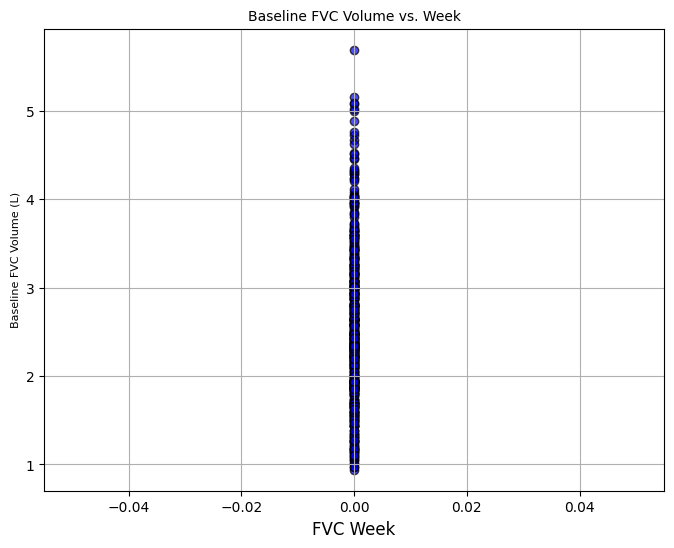

In [34]:
# Scatter plot of baseline FVC vs week
plt.figure(figsize=(8,6))
plt.scatter(final_df["Baseline FVC Week"], final_df["Baseline FVC Volume L"],
            color="blue", alpha=0.7, edgecolor="black")

plt.xlabel("FVC Week", fontsize=12)
plt.ylabel("Baseline FVC Volume (L)", fontsize=8)
plt.title("Baseline FVC Volume vs. Week", fontsize=10)
plt.grid(True)
plt.show()


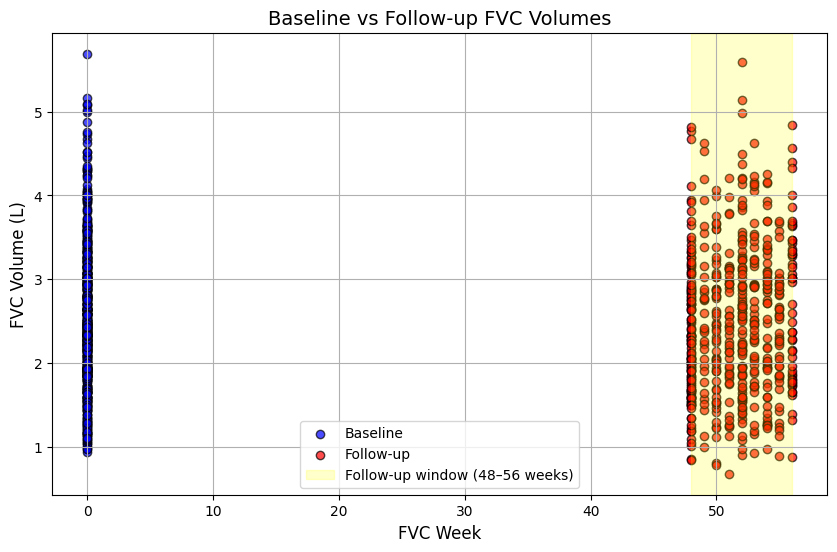

In [35]:
plt.figure(figsize=(10,6))

# Plot baseline
plt.scatter(final_df["Baseline FVC Week"], final_df["Baseline FVC Volume L"],
            color="blue", label="Baseline", alpha=0.7, edgecolor="black")

# Plot followup
plt.scatter(final_df["Followup FVC Week"], final_df["Followup FVC Volume L"],
            color="red", label="Follow-up", alpha=0.7, edgecolor="black")

# Highlight the full 48–56 week window with shading
plt.axvspan(48, 56, color="yellow", alpha=0.2, label="Follow-up window (48–56 weeks)")

plt.xlabel("FVC Week", fontsize=12)
plt.ylabel("FVC Volume (L)", fontsize=12)
plt.title("Baseline vs Follow-up FVC Volumes", fontsize=14)
plt.legend()
plt.grid(True)
plt.show()



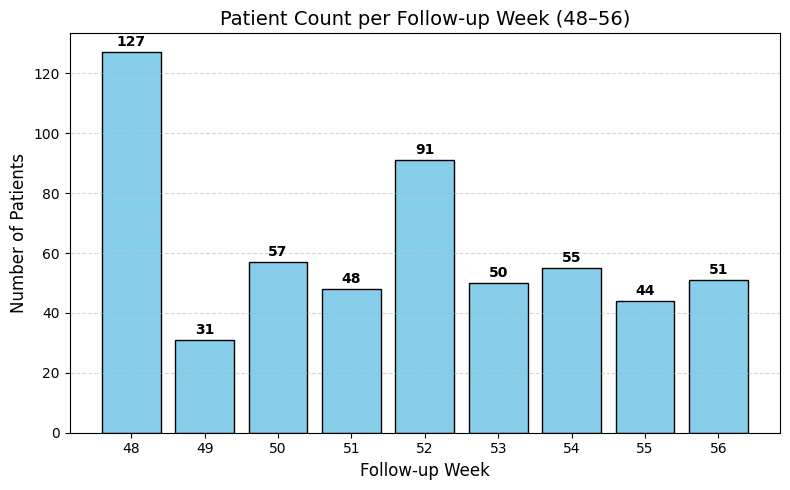

In [36]:
# Filter rows with valid follow-up week
valid_followups = final_df[final_df["Followup FVC Week"].notna()].copy()

# Round follow-up week to nearest integer
valid_followups["Followup FVC Week"] = valid_followups["Followup FVC Week"].round(0).astype(int)

# Filter only weeks between 48 and 56
week_range = valid_followups[
    (valid_followups["Followup FVC Week"] >= 48) & (valid_followups["Followup FVC Week"] <= 56)
]

# Count patients per week
week_counts = week_range["Followup FVC Week"].value_counts().sort_index()

# Plot
plt.figure(figsize=(8,5))
bars = plt.bar(week_counts.index, week_counts.values, color="skyblue", edgecolor="black")

# Annotate each bar with count
for bar in bars:
    height = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, height + 1, f"{int(height)}",
             ha='center', va='bottom', fontsize=10, fontweight='bold')

plt.xlabel("Follow-up Week", fontsize=12)
plt.ylabel("Number of Patients", fontsize=12)
plt.title("Patient Count per Follow-up Week (48–56)", fontsize=14)
plt.xticks(range(48, 57))
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


Total patients with follow-up FVC: 554
Patients with follow-up FVC + HRCT: 157 (28.3%)
Patients with follow-up FVC only: 397 (71.7%)


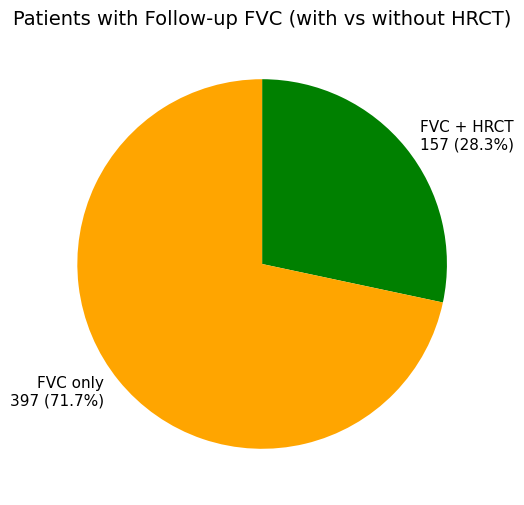

In [37]:
# Patients with any follow-up FVC
has_fvc = final_df["Followup FVC DATE"].notna()

# Among them, check if HRCT is also available
has_hrct = final_df["Followup SeriesInstanceUID"].notna()

# Counts
total_followup = has_fvc.sum()
fvc_and_hrct = (has_fvc & has_hrct).sum()
fvc_only = (has_fvc & ~has_hrct).sum()

# Percentages
pct_hrct = (fvc_and_hrct / total_followup) * 100 if total_followup > 0 else 0
pct_fvc_only = (fvc_only / total_followup) * 100 if total_followup > 0 else 0

print(f"Total patients with follow-up FVC: {total_followup}")
print(f"Patients with follow-up FVC + HRCT: {fvc_and_hrct} ({pct_hrct:.1f}%)")
print(f"Patients with follow-up FVC only: {fvc_only} ({pct_fvc_only:.1f}%)")

# --- Plot ---
labels = [f"FVC + HRCT\n{fvc_and_hrct} ({pct_hrct:.1f}%)",
          f"FVC only\n{fvc_only} ({pct_fvc_only:.1f}%)"]
counts = [fvc_and_hrct, fvc_only]
colors = ["green", "orange"]

plt.figure(figsize=(6,6))
plt.pie(counts, labels=labels, autopct=None, colors=colors,
        startangle=90, counterclock=False, textprops={"fontsize": 11})
plt.title("Patients with Follow-up FVC (with vs without HRCT)", fontsize=14)
plt.show()


/tmp/ipykernel_2797504/2509470447.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2797504/2509470447.py:13: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


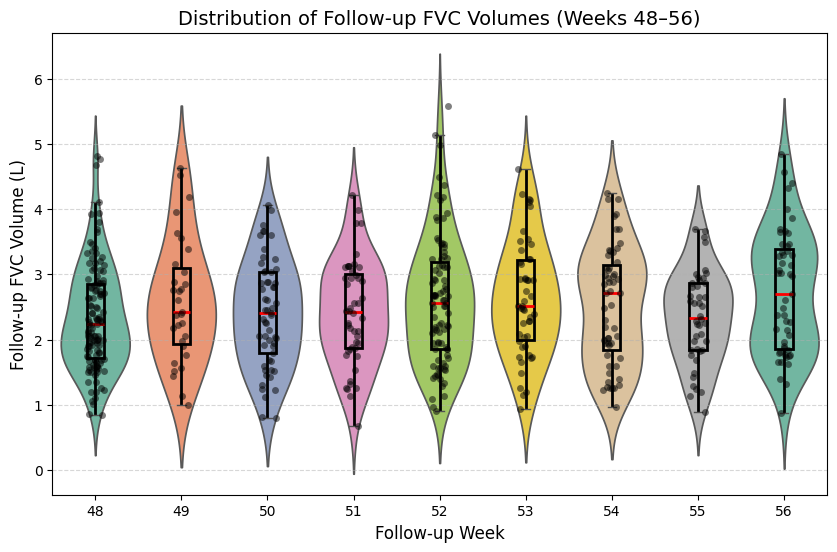

In [38]:
# --- Filter only patients with follow-up weeks between 48 and 56 ---
plot_df = final_df.copy()
plot_df = plot_df[plot_df["Followup FVC Week"].notna()]
plot_df["Followup FVC Week"] = plot_df["Followup FVC Week"].round().astype(int)

plot_df = plot_df[
    (plot_df["Followup FVC Week"] >= 48) & (plot_df["Followup FVC Week"] <= 56)
]

plt.figure(figsize=(10,6))

# --- Violin plot for distribution (no internal box) ---
sns.violinplot(
    data=plot_df,
    x="Followup FVC Week",
    y="Followup FVC Volume L",
    inner=None,       # remove default box so we can add a clearer one
    scale="width",
    palette="Set2"
)

# --- Overlay boxplot (clear median, IQR, whiskers) ---
sns.boxplot(
    data=plot_df,
    x="Followup FVC Week",
    y="Followup FVC Volume L",
    width=0.2,
    showcaps=True,
    boxprops={'facecolor':'none','edgecolor':'black','linewidth':2},
    whiskerprops={'color':'black','linewidth':2},
    medianprops={'color':'red','linewidth':2},   # red line for median
    showfliers=False
)

# --- Overlay scatter points for individual patients ---
sns.stripplot(
    data=plot_df,
    x="Followup FVC Week",
    y="Followup FVC Volume L",
    color="black",
    alpha=0.5,
    jitter=True
)

plt.xlabel("Follow-up Week", fontsize=12)
plt.ylabel("Follow-up FVC Volume (L)", fontsize=12)
plt.title("Distribution of Follow-up FVC Volumes (Weeks 48–56)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.show()


/tmp/ipykernel_2797504/1342828315.py:28: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


/tmp/ipykernel_2797504/1342828315.py:48: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.stripplot(


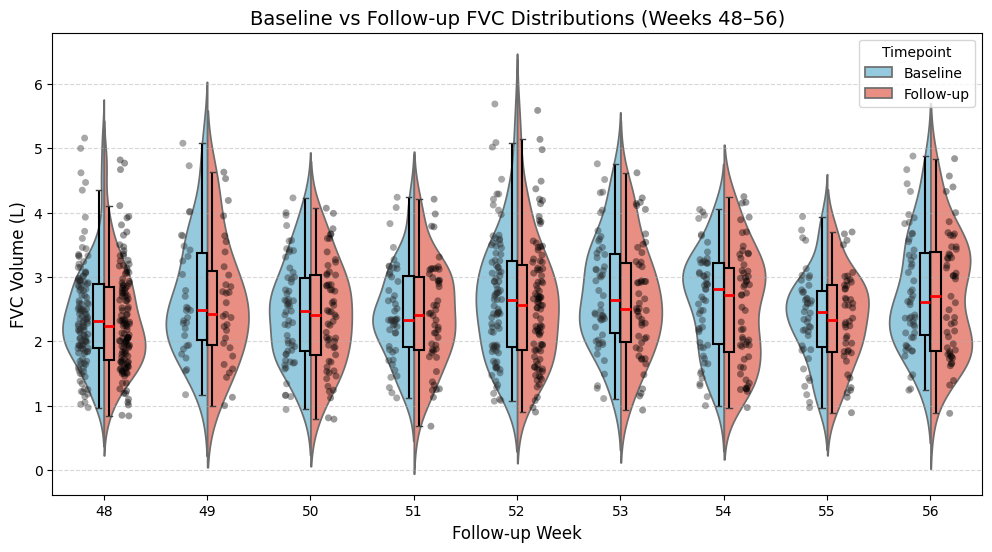

In [39]:
# --- Step 1: Prepare follow-up data ---
plot_df = final_df.copy()
plot_df = plot_df[plot_df["Followup FVC Week"].notna()]
plot_df["Followup FVC Week"] = plot_df["Followup FVC Week"].round().astype(int)

plot_df = plot_df[
    (plot_df["Followup FVC Week"] >= 48) & (plot_df["Followup FVC Week"] <= 56)
]

# --- Step 2: Build long-format dataframe with Baseline + Follow-up ---
baseline_long = pd.DataFrame({
    "Week": plot_df["Followup FVC Week"],   # align baseline to the same week as follow-up
    "FVC Volume L": plot_df["Baseline FVC Volume L"],
    "Timepoint": "Baseline"
})

followup_long = pd.DataFrame({
    "Week": plot_df["Followup FVC Week"],
    "FVC Volume L": plot_df["Followup FVC Volume L"],
    "Timepoint": "Follow-up"
})

long_df = pd.concat([baseline_long, followup_long], ignore_index=True)

# --- Step 3: Plot violin + boxplot + stripplot ---
plt.figure(figsize=(12,6))

sns.violinplot(
    data=long_df,
    x="Week", y="FVC Volume L", hue="Timepoint",
    split=True, inner=None, scale="width",
    palette={"Baseline":"skyblue", "Follow-up":"salmon"}
)

# Overlay boxplot for clarity
sns.boxplot(
    data=long_df,
    x="Week", y="FVC Volume L", hue="Timepoint",
    width=0.2, showcaps=True,
    boxprops={'facecolor':'none','edgecolor':'black','linewidth':1.5},
    whiskerprops={'color':'black','linewidth':1.5},
    medianprops={'color':'red','linewidth':2},
    showfliers=False,
    dodge=True
)

# Overlay raw data points
sns.stripplot(
    data=long_df,
    x="Week", y="FVC Volume L", hue="Timepoint",
    dodge=True, color="black", alpha=0.4, jitter=True
)

plt.xlabel("Follow-up Week", fontsize=12)
plt.ylabel("FVC Volume (L)", fontsize=12)
plt.title("Baseline vs Follow-up FVC Distributions (Weeks 48–56)", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.5)

# Remove duplicate legends
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[0:2], labels[0:2], title="Timepoint")

plt.show()


/tmp/ipykernel_2797504/3282408297.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2797504/3282408297.py:19: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


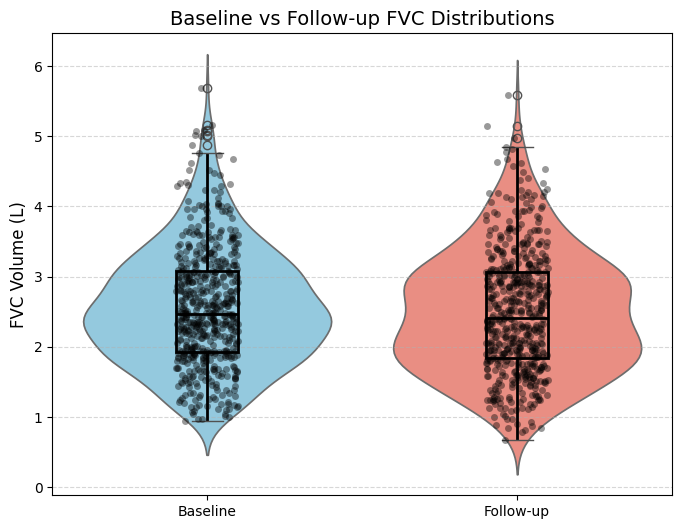

In [40]:
# Step 1: Keep only patients with both baseline and follow-up FVC
valid_df = final_df.dropna(subset=["Baseline FVC Volume L", "Followup FVC Volume L"]).copy()

# Step 2: Reshape into long format
baseline = pd.DataFrame({
    "FVC Volume L": valid_df["Baseline FVC Volume L"],
    "Timepoint": "Baseline"
})
followup = pd.DataFrame({
    "FVC Volume L": valid_df["Followup FVC Volume L"],
    "Timepoint": "Follow-up"
})
long_df = pd.concat([baseline, followup], ignore_index=True)

# Step 3: Plot violin + boxplot + stripplot
plt.figure(figsize=(8,6))

# Violin for distribution
sns.violinplot(
    data=long_df, x="Timepoint", y="FVC Volume L",
    palette=["skyblue","salmon"], scale="width", inner=None
)

# Overlay boxplot (clear median, IQR, whiskers)
sns.boxplot(
    data=long_df, x="Timepoint", y="FVC Volume L",
    width=0.2, showcaps=True, boxprops={'facecolor':'none','edgecolor':'black','linewidth':2},
    whiskerprops={'color':'black','linewidth':2},
    medianprops={'color':'black','linewidth':2}
)

# Overlay raw data points
sns.stripplot(
    data=long_df, x="Timepoint", y="FVC Volume L",
    color="black", alpha=0.4, jitter=True
)

plt.title("Baseline vs Follow-up FVC Distributions", fontsize=14)
plt.xlabel("")
plt.ylabel("FVC Volume (L)", fontsize=12)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.show()


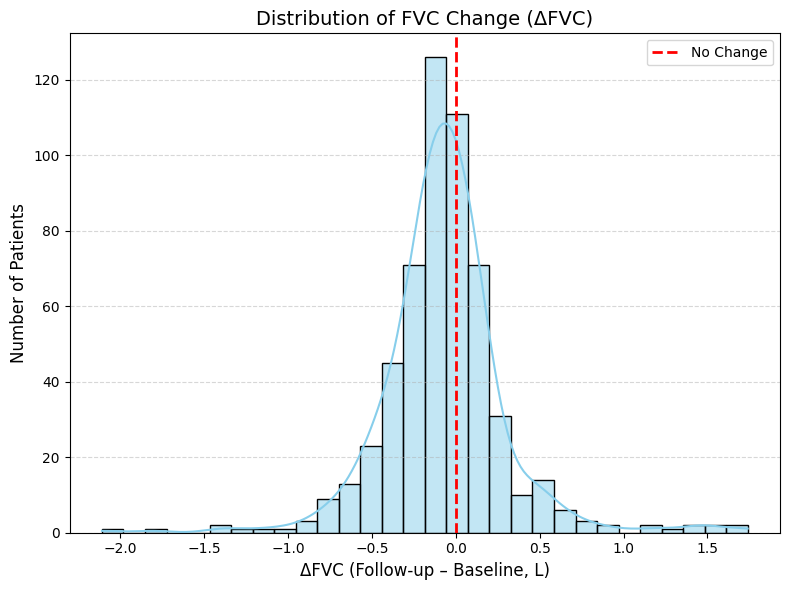

In [41]:
# Step 1: Compute ΔFVC (Follow-up – Baseline)
final_df = final_df.dropna(subset=["Baseline FVC Volume L", "Followup FVC Volume L"]).copy()
final_df["Delta FVC"] = final_df["Followup FVC Volume L"] - final_df["Baseline FVC Volume L"]

# Step 2: Plot histogram with KDE overlay
plt.figure(figsize=(8,6))
sns.histplot(final_df["Delta FVC"], bins=30, kde=True, color="skyblue", edgecolor="black")

# Step 3: Add vertical line at 0 (no change)
plt.axvline(0, color="red", linestyle="--", linewidth=2, label="No Change")

# Labels and title
plt.xlabel("ΔFVC (Follow-up – Baseline, L)", fontsize=12)
plt.ylabel("Number of Patients", fontsize=12)
plt.title("Distribution of FVC Change (ΔFVC)", fontsize=14)
plt.legend()
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


Primary Diagnosis % per FVC Change Category:
Primary Diagnosis                                    CHP  CTD-ILD  Emphysema  \
Change Category           Change Category                                      
Improvement (0–10%)       Improvement (0–10%)        2.9     34.5        0.7   
Mild Decline (0–5%)       Mild Decline (0–5%)        5.1     29.7        0.0   
Mild Decline (5–10%)      Mild Decline (5–10%)       7.8     30.0        0.0   
No Change                 No Change                  0.0     16.7        0.0   
Severe Decline (≥10%)     Severe Decline (≥10%)      9.4     29.0        0.0   
Strong Improvement (>10%) Strong Improvement (>10%)  4.8     42.9        0.0   

Primary Diagnosis                                    Exposure-related  \
Change Category           Change Category                               
Improvement (0–10%)       Improvement (0–10%)                     1.4   
Mild Decline (0–5%)       Mild Decline (0–5%)                     0.8   
Mild Decline (5–10%)  

/tmp/ipykernel_2797504/3284540202.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=category_counts.index, y=category_counts.values, palette="Set2", edgecolor="black")


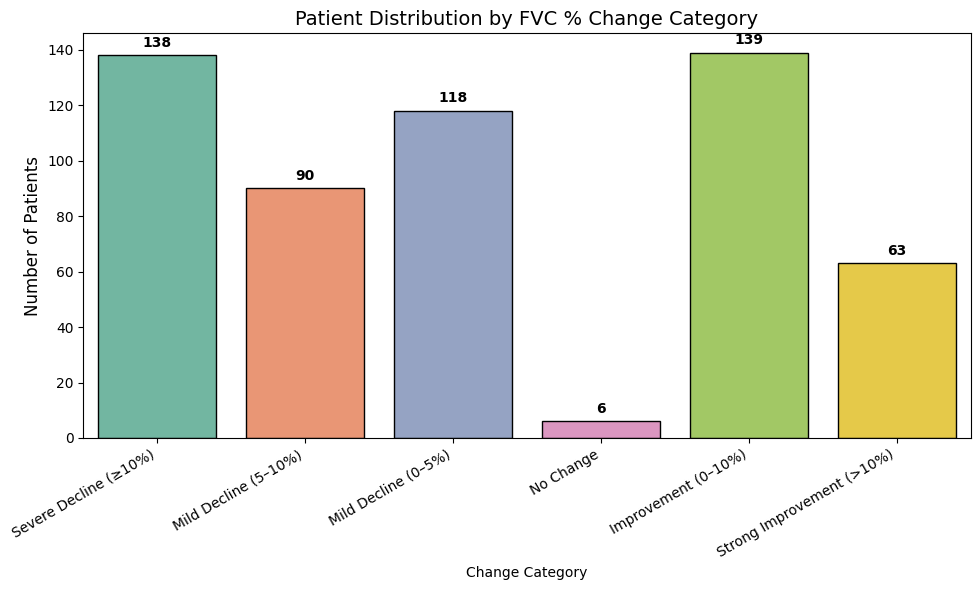

In [42]:
# Step 1: Compute % change in FVC
df = final_df.dropna(subset=["Baseline FVC Volume L", "Followup FVC Volume L"]).copy()
df["FVC % Change"] = (df["Followup FVC Volume L"] - df["Baseline FVC Volume L"]) / df["Baseline FVC Volume L"] * 100

# Step 2: Categorize patients
def categorize_change(pct):
    if pct <= -10:
        return "Severe Decline (≥10%)"
    elif -10 < pct <= -5:
        return "Mild Decline (5–10%)"
    elif -5 < pct < 0:
        return "Mild Decline (0–5%)"
    elif pct == 0:
        return "No Change"
    elif 0 < pct <= 10:
        return "Improvement (0–10%)"
    else:
        return "Strong Improvement (>10%)"

df["Change Category"] = df["FVC % Change"].apply(categorize_change)

# Step 3: Count patients per category
category_counts = df["Change Category"].value_counts().reindex([
    "Severe Decline (≥10%)",
    "Mild Decline (5–10%)",
    "Mild Decline (0–5%)",
    "No Change",
    "Improvement (0–10%)",
    "Strong Improvement (>10%)"
])

# ✅ Step 4: Compute Primary Diagnosis % per category
diagnosis_pct = (
    df.groupby(["Change Category", "Primary Diagnosis"])
      .size()
      .groupby(level=0)
      .apply(lambda x: (x / x.sum() * 100).round(1))
      .unstack(fill_value=0)
)

print("Primary Diagnosis % per FVC Change Category:")
print(diagnosis_pct)

# ✅ Step 5: Plot bar chart with counts
plt.figure(figsize=(10,6))
sns.barplot(x=category_counts.index, y=category_counts.values, palette="Set2", edgecolor="black")

# Annotate counts on top of bars
for i, v in enumerate(category_counts.values):
    plt.text(i, v + 2, str(v), ha="center", va="bottom", fontsize=10, fontweight="bold")

plt.xticks(rotation=30, ha="right")
plt.ylabel("Number of Patients", fontsize=12)
plt.title("Patient Distribution by FVC % Change Category", fontsize=14)
plt.tight_layout()
plt.show()


Primary Diagnosis Percentage Distribution:
Primary Diagnosis
IPF                                                    39.9
CTD-ILD                                                32.1
UILD                                                   15.0
CHP                                                     6.0
Miscellaneous                                           1.3
INSIP                                                   1.1
Exposure-related                                        1.1
Sarcoidosis                                             0.9
No information                                          0.5
Fibrotic HP (FHP)                                       0.5
Occupational-related ILD                                0.4
Smoking Related ILD (DIP / RB / RB-ILD)                 0.4
Idiopathic OP                                           0.4
Idiopathic pleuroparenchymal fibroelastosis (IPPFE)     0.2
NSIP                                                    0.2
Emphysema                              

/tmp/ipykernel_2797504/3600875186.py:12: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=diagnosis_pct.index, y=diagnosis_pct.values, palette="Set3", edgecolor="black")


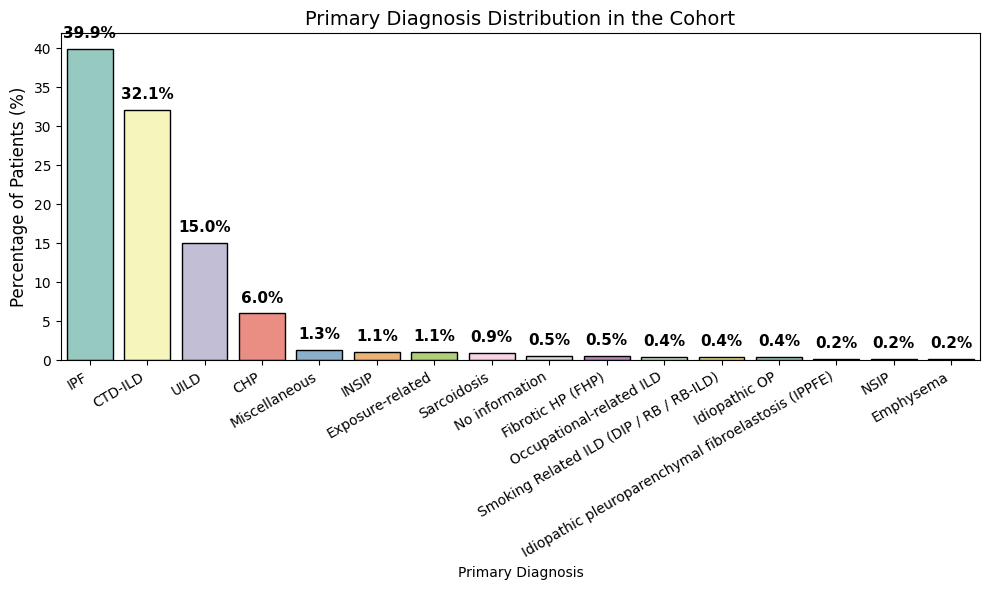

In [43]:
# Count each diagnosis
diagnosis_counts = final_df["Primary Diagnosis"].value_counts()

# Convert to percentages
diagnosis_pct = (diagnosis_counts / diagnosis_counts.sum() * 100).round(1)

print("Primary Diagnosis Percentage Distribution:")
print(diagnosis_pct)

# Plot histogram / bar chart
plt.figure(figsize=(10,6))
sns.barplot(x=diagnosis_pct.index, y=diagnosis_pct.values, palette="Set3", edgecolor="black")

# Annotate percentages on bars
for i, v in enumerate(diagnosis_pct.values):
    plt.text(i, v + 1, f"{v}%", ha="center", va="bottom", fontsize=11, fontweight="bold")

plt.xticks(rotation=30, ha="right")
plt.ylabel("Percentage of Patients (%)", fontsize=12)
plt.title("Primary Diagnosis Distribution in the Cohort", fontsize=14)
plt.tight_layout()
plt.show()


In [44]:

final_df = final_df.merge(df[["Subject ID", "Change Category"]], on="Subject ID", how="left")


In [45]:
final_df[final_df["Change Category"]== "Severe Decline (≥10%)"]

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,Followup FVC Week,Followup Acquisition Date,Followup SeriesInstanceUID,Primary Diagnosis,Sex,Delta FVC,Change Category
20,173533,1976-09-27,1.51,76.0,0,1976-09-27,1.2.840.113704.1.111.9704.1386252570.12,1977-09-26,1.08,55.0,52.0,1977-09-26,1.2.840.113704.1.111.8064.1417454240.12,UILD,Male,-0.43,Severe Decline (≥10%)
22,178448,1956-10-22,2.93,64.0,0,1956-10-22,1.3.6.1.4.1.19291.2.1.2.1162211771921352225918...,1957-10-21,1.55,34.0,52.0,NaT,<NA>,UILD,Male,-1.38,Severe Decline (≥10%)
26,194700,1980-09-22,1.68,85.3,0,1980-09-22,1.2.392.200036.9116.2.6.1.3268.2047398422.1492...,1981-09-07,1.24,77.0,50.0,1981-09-07,1.2.392.200036.9116.2.6.1.3268.2047398422.1522...,UILD,Female,-0.44,Severe Decline (≥10%)
37,250726,1975-09-29,2.06,82.0,0,1975-09-29,1.2.840.113704.1.111.11520.1356000763.13,1976-10-25,1.84,74.0,56.0,NaT,<NA>,IPF,Male,-0.22,Severe Decline (≥10%)
40,255488,1978-09-25,2.58,85.0,0,1978-09-25,1.2.840.113704.1.111.7076.1328110819.13,1979-10-08,1.76,58.0,54.0,NaT,<NA>,UILD,Male,-0.82,Severe Decline (≥10%)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,1001384,1964-12-01,1.53,59.8,0,1964-12-01,1.2.826.0.1.3680043.10.1218.113962226415490915...,1965-11-02,1.35,53.9,48.0,NaT,<NA>,CTD-ILD,Female,-0.18,Severe Decline (≥10%)
534,1001406,1986-01-01,1.38,65.0,0,1986-01-01,1.2.826.0.1.3680043.10.1218.833400882502649081...,1986-12-03,0.84,38.0,48.0,NaT,<NA>,UILD,Female,-0.54,Severe Decline (≥10%)
538,1001418,1968-12-01,2.47,73.0,0,1968-12-01,1.2.826.0.1.3680043.10.1218.156537498479849626...,1969-11-02,2.05,67.8,48.0,NaT,<NA>,CTD-ILD,Female,-0.42,Severe Decline (≥10%)
541,1002381,1943-06-01,2.34,65.0,0,1943-06-01,1.2.826.0.1.3680043.10.1218.365681510223403410...,1944-06-06,2.08,58.0,53.0,1944-06-01,1.2.826.0.1.3680043.10.1218.605411546867877756...,CHP,Male,-0.26,Severe Decline (≥10%)


/tmp/ipykernel_2797504/3084266667.py:19: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(
/tmp/ipykernel_2797504/3084266667.py:19: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(


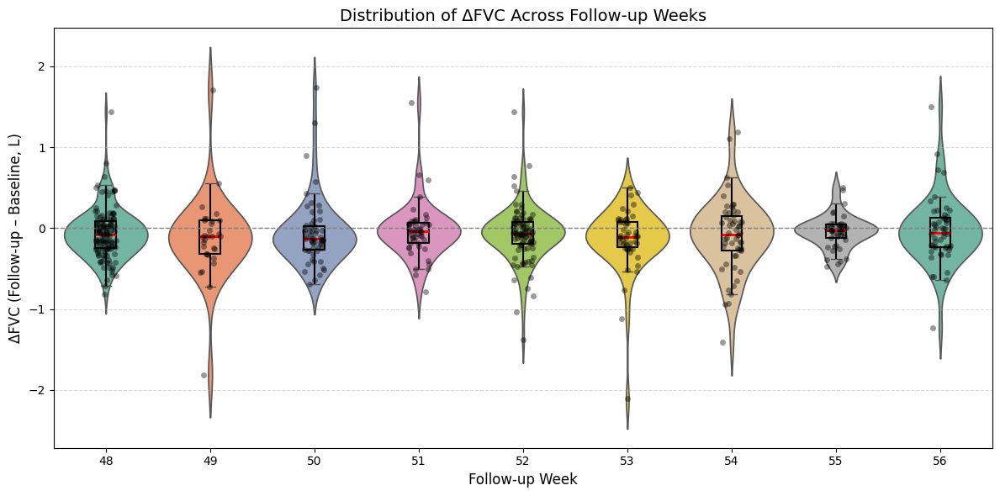

In [46]:
# --- Step 1: Filter valid rows ---
plot_df = final_df.copy()
plot_df = plot_df[
    plot_df["Baseline FVC Volume L"].notna() &
    plot_df["Followup FVC Volume L"].notna() &
    plot_df["Followup FVC Week"].notna()
]

# --- Step 2: Round follow-up week ---
plot_df["Followup FVC Week"] = plot_df["Followup FVC Week"].round().astype(int)

# --- Step 3: Compute delta FVC ---
plot_df["Delta FVC"] = plot_df["Followup FVC Volume L"] - plot_df["Baseline FVC Volume L"]

# --- Step 4: Plot violin + boxplot + stripplot ---
plt.figure(figsize=(12,6))

# Violin plot for distribution
sns.violinplot(
    data=plot_df,
    x="Followup FVC Week",
    y="Delta FVC",
    inner=None,
    scale="width",
    palette="Set2"
)

# Overlay boxplot for median + IQR
sns.boxplot(
    data=plot_df,
    x="Followup FVC Week",
    y="Delta FVC",
    width=0.2,
    showcaps=True,
    boxprops={'facecolor':'none','edgecolor':'black','linewidth':1.5},
    whiskerprops={'color':'black','linewidth':1.5},
    medianprops={'color':'red','linewidth':2},
    showfliers=False
)

# Overlay raw patient points
sns.stripplot(
    data=plot_df,
    x="Followup FVC Week",
    y="Delta FVC",
    color="black",
    alpha=0.4,
    jitter=True
)

# Labels and title
plt.axhline(0, color="gray", linestyle="--", linewidth=1)  # reference line (no change)
plt.xlabel("Follow-up Week", fontsize=12)
plt.ylabel("ΔFVC (Follow-up – Baseline, L)", fontsize=12)
plt.title("Distribution of ΔFVC Across Follow-up Weeks", fontsize=14)
plt.grid(axis="y", linestyle="--", alpha=0.5)
plt.tight_layout()
plt.show()


### Merge FVC data with Clinical and Demographic data

In [47]:
final_df

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,Followup FVC Week,Followup Acquisition Date,Followup SeriesInstanceUID,Primary Diagnosis,Sex,Delta FVC,Change Category
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,53.0,1977-10-03,1.3.46.670589.33.1.63668740139523062900002.571...,CTD-ILD,Female,0.24,Strong Improvement (>10%)
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,55.0,1970-10-26,1.2.840.113704.1.111.12856.1392370004.12,UILD,Female,-0.10,Mild Decline (0–5%)
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,53.0,1950-11-06,1.2.840.113704.1.111.12868.1380700384.12,UILD,Female,-0.12,Mild Decline (5–10%)
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,48.0,NaT,<NA>,IPF,Male,-0.05,Mild Decline (0–5%)
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,53.0,1977-10-03,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,CTD-ILD,Female,-0.18,Mild Decline (5–10%)
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,52.0,NaT,<NA>,CTD-ILD,Female,-0.04,Mild Decline (0–5%)
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,52.0,NaT,<NA>,Idiopathic OP,Male,-0.61,Severe Decline (≥10%)
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,52.0,NaT,<NA>,IPF,Male,0.13,Improvement (0–10%)
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,52.0,NaT,<NA>,IPF,Male,-0.02,Mild Decline (0–5%)


In [48]:
print(final_df[final_df['Subject ID'] == '865785'])

    Subject ID Baseline FVC DATE  Baseline FVC Volume L  \
225     865785        1969-10-06                   1.86   

     Baseline FVC Predicted %  Baseline FVC Week Baseline Acquisition Date  \
225                      86.9                  0                1969-10-06   

                            Baseline SeriesInstanceUID Followup FVC DATE  \
225  1.2.392.200036.9116.2.6.1.3268.2047398422.1583...        1970-11-02   

     Followup FVC Volume L  Followup FVC Predicted %  Followup FVC Week  \
225                   2.07                      98.1               56.0   

    Followup Acquisition Date  \
225                1970-11-02   

                            Followup SeriesInstanceUID Primary Diagnosis  \
225  1.2.392.200036.9116.2.6.1.44063.1811172214.161...           CTD-ILD   

        Sex  Delta FVC            Change Category  
225  Female       0.21  Strong Improvement (>10%)  


In [49]:
filtered_df_csv

,Subject ID,Study Date,Research : Study Visit Number,Research : Study Time,Research : Height,Research : Weight,Age,Sex,Ethnicity,Race,...,Dyspnea,Cough,Velcro Crackles,Finger Clubbing,Approx. Symptoms start,Week of Approx. Symptoms start,Exacerbation,Approx. Exacerbation date,Week of Approx. Exacerbation date,Change Log
13013,100922,1976-09-27,NaN,00:00,0.0,0.000000,77.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1976-09-27',0.0,NaN,NaN,NaN,NaN
13014,100922,NaN,NaN,NaN,0.0,NaN,78.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1977-10-03',53.0,NaN,NaN,NaN,NaN
12055,100992,1970-10-26,NaN,00:00,0.0,0.000000,70.0,Female,No Information,No Information,...,1.0,'True',1.0,0.0,'1969-10-06',-55.0,NaN,NaN,NaN,NaN
12056,100992,NaN,NaN,NaN,0.0,NaN,68.0,Female,No Information,No Information,...,1.0,'False',1.0,0.0,'1970-10-26',0.0,NaN,NaN,NaN,NaN
11359,102083,NaN,NaN,NaN,0.0,NaN,48.0,Female,No Information,No Information,...,1.0,'True',1.0,0.0,'1949-10-31',0.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8705,1007005,NaN,NaN,NaN,168.2,NaN,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8704,1007005,NaN,NaN,NaN,168.2,NaN,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8708,1007005,NaN,NaN,NaN,168.2,NaN,80.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
8702,1007005,1978-07-01,NaN,12:34,168.2,74.066466,79.0,Female,Not Hispanic or Latino,White,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [50]:
# # choose the columns you want to fill
# columns_to_fill = ["Performed By", "Familial Pulm Fibrosis", "Risk Occupational", "Risk Environmental", "Risk Precipitins"]  # replace with your own

# # Fill missing values within each Subject ID group, only for those columns
# filtered_df_csv[columns_to_fill] = (
#     filtered_df_csv.groupby("Subject ID")[columns_to_fill]
#              .transform(lambda g: g.ffill().bfill())
# )

# filtered_df_csv[["Subject ID","Performed By", "Familial Pulm Fibrosis", "Risk Occupational", "Risk Environmental", "Risk Precipitins"]]


In [51]:
# Ensure Subject ID is string
final_df["Subject ID"] = final_df["Subject ID"].astype(str)
filtered_df_csv["Subject ID"] = filtered_df_csv["Subject ID"].astype(str)

# Ensure dates are datetime
final_df["Baseline FVC DATE"] = pd.to_datetime(final_df["Baseline FVC DATE"], errors="coerce")
filtered_df_csv["FVC DATE"] = pd.to_datetime(filtered_df_csv["FVC DATE"], errors="coerce")

# # Ensure numeric columns are float
# final_df["Followup FVC Volume L"] = final_df["Followup FVC Volume L"].astype(float)
# filtered_df_csv["FVC Volume L"] = filtered_df_csv["FVC Volume L"].astype(float)
# Now merge
merged_df = pd.merge(
    final_df,
    filtered_df_csv,
    how="left",
    left_on=["Subject ID", "Baseline FVC DATE", "Baseline FVC Volume L", "Baseline FVC Predicted %", "Sex", "Primary Diagnosis"],
    right_on=["Subject ID", "FVC DATE", "FVC Volume L", "FVC Predicted %", "Sex", "Primary Diagnosis"]
)

# Drop the right-side join columns
merged_df = merged_df.drop(columns=['Study Date', "FVC DATE", "FVC Volume L", "FVC Predicted %","Week of FVC DATE"])

print("Merged shape:", merged_df.shape)
print(list(merged_df.columns))
# merged_df[merged_df['Subject ID']=='1002411']
# merged_df[["Subject ID", 'Baseline FVC DATE', "Baseline FVC Volume L", 'Cough', 'Study Date']]
merged_df


Merged shape: (554, 109)
['Subject ID', 'Baseline FVC DATE', 'Baseline FVC Volume L', 'Baseline FVC Predicted %', 'Baseline FVC Week', 'Baseline Acquisition Date', 'Baseline SeriesInstanceUID', 'Followup FVC DATE', 'Followup FVC Volume L', 'Followup FVC Predicted %', 'Followup FVC Week', 'Followup Acquisition Date', 'Followup SeriesInstanceUID', 'Primary Diagnosis', 'Sex', 'Delta FVC', 'Change Category', 'Research : Study Visit Number', 'Research : Study Time', 'Research : Height', 'Research : Weight', 'Age', 'Ethnicity', 'Race', 'Home Region', 'Performed By', 'Date of Diagnosis', 'Week of Date of Diagnosis', 'Secondary Diagnosis', 'Familial Pulm Fibrosis', 'Type CTD', 'Type CTD Description', 'Date of CTD Diagnosis', 'Week of Date of CTD Diagnosis', 'Associated Autoantibodies', 'Associated Autoantibodies Description', 'Smoking History', 'Smoking Pack Years', 'Smoking Stop Date', 'Week of Smoking Stop Date', 'Risk Occupational', 'Risk Occupational Description', 'Risk Environmental', 'Ri

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,Dyspnea,Cough,Velcro Crackles,Finger Clubbing,Approx. Symptoms start,Week of Approx. Symptoms start,Exacerbation,Approx. Exacerbation date,Week of Approx. Exacerbation date,Change Log
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,...,1.0,'False',1.0,0.0,'1976-09-27',0.0,NaN,NaN,NaN,NaN
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,...,1.0,'False',1.0,0.0,'1970-10-26',0.0,NaN,NaN,NaN,NaN
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,...,1.0,'True',1.0,0.0,'1949-10-31',0.0,NaN,NaN,NaN,NaN
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,...,1.0,'False',1.0,1.0,'1968-09-09',52.0,NaN,NaN,NaN,NaN
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,...,1.0,'False',1.0,0.0,'1976-10-18',-21.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [52]:
empty_cols = merged_df.columns[merged_df.isna().all()].tolist()
print("Columns with all None/NaN values:", empty_cols)


Columns with all None/NaN values: ['Research : Study Visit Number', 'Week of FEV1 Date', 'General Therapy Additional Information', 'Change Log']


In [53]:
# Drop columns that are completely empty
merged_df = merged_df.drop(columns=empty_cols)
print("New shape (without empty columns):", merged_df.shape)

merged_df

New shape (without empty columns): (554, 105)


,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,Week of General Therapy End Date,Dyspnea,Cough,Velcro Crackles,Finger Clubbing,Approx. Symptoms start,Week of Approx. Symptoms start,Exacerbation,Approx. Exacerbation date,Week of Approx. Exacerbation date
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,...,NaN,1.0,'False',1.0,0.0,'1976-09-27',0.0,NaN,NaN,NaN
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,...,NaN,1.0,'False',1.0,0.0,'1970-10-26',0.0,NaN,NaN,NaN
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,...,NaN,1.0,'True',1.0,0.0,'1949-10-31',0.0,NaN,NaN,NaN
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,...,NaN,1.0,'False',1.0,1.0,'1968-09-09',52.0,NaN,NaN,NaN
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,...,NaN,1.0,'False',1.0,0.0,'1976-10-18',-21.0,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [54]:
def match_test_within_window(merged_df, filtered_df_csv, date_col, value_cols, window_days):
    """
    Match test results within ±window_days of Baseline Acquisition Date.
    
    Parameters
    ----------
    merged_df : DataFrame
        Must contain 'Subject ID' and 'Baseline Acquisition Date'
    filtered_df_csv : DataFrame
        Contains test results with Subject ID, date_col, and value_cols
    date_col : str
        The exact column name of the test date in filtered_df_csv
    value_cols : list of str
        The exact column names of the associated values in filtered_df_csv
    window_days : int
        Allowed window in days (default ±14)
    
    Returns
    -------
    merged_df with new columns:
        - date_col (filled with matched date)
        - all value_cols (filled with matched values)
        - <date_col>_week_diff (difference in weeks from baseline)
    """
    # Ensure datetime
    merged_df["Baseline Acquisition Date"] = pd.to_datetime(
        merged_df["Baseline Acquisition Date"], errors="coerce"
    )
    filtered_df_csv[date_col] = pd.to_datetime(filtered_df_csv[date_col], errors="coerce")

    # Extract relevant subset
    param_long = filtered_df_csv[["Subject ID", date_col] + value_cols].dropna(subset=[date_col])

    # Function to find nearest within window
    def nearest_within(row):
        patient = param_long[param_long["Subject ID"] == row["Subject ID"]]
        if patient.empty or pd.isna(row["Baseline Acquisition Date"]):
            return pd.Series([pd.NaT] + [np.nan]*len(value_cols) + [np.nan],
                             index=[date_col] + value_cols + [f"{date_col}_week_diff"])
        patient = patient.copy()
        patient["diff_days"] = (patient[date_col] - row["Baseline Acquisition Date"]).dt.days
        in_window = patient[patient["diff_days"].abs() <= window_days]
        if in_window.empty:
            return pd.Series([pd.NaT] + [np.nan]*len(value_cols) + [np.nan],
                             index=[date_col] + value_cols + [f"{date_col}_week_diff"])
        idx = in_window["diff_days"].abs().idxmin()
        chosen_date = in_window.loc[idx, date_col]
        chosen_values = in_window.loc[idx, value_cols].tolist()
        week_diff = (chosen_date - row["Baseline Acquisition Date"]).days / 7
        return pd.Series([chosen_date] + chosen_values + [week_diff],
                         index=[date_col] + value_cols + [f"{date_col}_week_diff"])

    # Apply row-wise
    merged_df[[date_col] + value_cols + [f"{date_col}_week_diff"]] = merged_df.apply(nearest_within, axis=1)

    return merged_df



merged_df = match_test_within_window(
    merged_df,
    filtered_df_csv,
    date_col="Date of BAL",
    value_cols=["%BAL Macrophages", "%BAL Lymphocytes", "%BAL Neutrophils", "%BAL Eosinophils"],
    window_days=14
)
merged_df[["Subject ID", "Baseline Acquisition Date",'Broncho Lavage Available','Date of BAL', "%BAL Macrophages", "%BAL Lymphocytes", "%BAL Neutrophils", "%BAL Eosinophils", "Date of BAL_week_diff"]]
missing_dlco = merged_df[merged_df["Date of BAL_week_diff"].isna()]
df = merged_df[merged_df['Subject ID'] == "914798"]
df[["Subject ID", "Baseline Acquisition Date",'Broncho Lavage Available','Date of BAL', "%BAL Macrophages", "%BAL Lymphocytes", "%BAL Neutrophils", "%BAL Eosinophils", "Date of BAL_week_diff"]]

,Subject ID,Baseline Acquisition Date,Broncho Lavage Available,Date of BAL,%BAL Macrophages,%BAL Lymphocytes,%BAL Neutrophils,%BAL Eosinophils,Date of BAL_week_diff
243,914798,1969-10-06,Yes,1969-10-06,19.0,7.0,72.0,2.0,0.0


In [55]:
merged_df = match_test_within_window(
    merged_df,
    filtered_df_csv,
    date_col="Approx. Symptoms start",
    value_cols=["Dyspnea", "Cough", "Velcro Crackles", "Finger Clubbing"],
    window_days=20000
)

merged_df[["Subject ID", "Baseline Acquisition Date", "Approx. Symptoms start", "Dyspnea", "Cough", "Velcro Crackles", "Finger Clubbing"]]

,Subject ID,Baseline Acquisition Date,Approx. Symptoms start,Dyspnea,Cough,Velcro Crackles,Finger Clubbing
0,100922,1976-09-27,1976-09-27,1.0,'False',1.0,0.0
1,100992,1969-10-06,1969-10-06,1.0,'True',1.0,0.0
2,102083,1949-10-31,1949-10-31,1.0,'True',1.0,0.0
3,111522,1967-10-09,1967-10-09,1.0,'True',1.0,1.0
4,115616,1976-09-27,1976-10-18,1.0,'False',1.0,0.0
...,...,...,...,...,...,...,...
549,1006455,1962-05-01,NaT,NaT,NaT,NaT,NaT
550,1006459,1966-05-01,NaT,NaT,NaT,NaT,NaT
551,1006781,1952-10-01,NaT,NaT,NaT,NaT,NaT
552,1006982,1973-07-01,NaT,NaT,NaT,NaT,NaT


In [56]:
# Ensure datetime
merged_df["Baseline Acquisition Date"] = pd.to_datetime(merged_df["Baseline Acquisition Date"], errors="coerce")
filtered_df_csv["DLCO DATE(Adjusted)"] = pd.to_datetime(filtered_df_csv["DLCO DATE(Adjusted)"], errors="coerce")
filtered_df_csv["DLCO DATE(Not Adjusted)"] = pd.to_datetime(filtered_df_csv["DLCO DATE(Not Adjusted)"], errors="coerce")

# Reshape DLCO into long format
dlco_long = pd.concat([
    filtered_df_csv[["Subject ID", "DLCO DATE(Adjusted)", "DLCO CAP(Adjusted)"]]
        .rename(columns={"DLCO DATE(Adjusted)": "DLCO_DATE", "DLCO CAP(Adjusted)": "DLCO_CAP"}),
    filtered_df_csv[["Subject ID", "DLCO DATE(Not Adjusted)", "DLCO CAP(Not Adjusted)"]]
        .rename(columns={"DLCO DATE(Not Adjusted)": "DLCO_DATE", "DLCO CAP(Not Adjusted)": "DLCO_CAP"}),
], ignore_index=True)

# Drop rows without DLCO date
dlco_long = dlco_long.dropna(subset=["DLCO_DATE"])

# Function: find DLCO within ±14 days of baseline
def dlco_within_window(row, window=14):
    patient = dlco_long[dlco_long["Subject ID"] == row["Subject ID"]]
    if patient.empty or pd.isna(row["Baseline Acquisition Date"]):
        return pd.Series([pd.NaT, np.nan])
    
    # Compute difference in days
    patient["diff_days"] = (patient["DLCO_DATE"] - row["Baseline Acquisition Date"]).dt.days
    
    # Keep only those within ±window
    in_window = patient[patient["diff_days"].abs() <= window]
    if in_window.empty:
        return pd.Series([pd.NaT, np.nan])
    
    # If multiple, pick the closest
    idx = in_window["diff_days"].abs().idxmin()
    return pd.Series([in_window.loc[idx, "DLCO_DATE"], in_window.loc[idx, "DLCO_CAP"]])

# Apply function row-wise
merged_df[["DLCO_DATE", "DLCO_CAP"]] = merged_df.apply(dlco_within_window, axis=1)

# Add week difference (optional)
merged_df["DLCO_Week"] = (merged_df["DLCO_DATE"] - merged_df["Baseline FVC DATE"]).dt.days / 7

# Final view
merged_df[["Subject ID", "Baseline Acquisition Date", "DLCO_DATE", "DLCO_CAP", "DLCO_Week", "DLCO DATE(Adjusted)", "DLCO CAP(Adjusted)", "DLCO DATE(Not Adjusted)", "DLCO CAP(Not Adjusted)" ]]


,Subject ID,Baseline Acquisition Date,DLCO_DATE,DLCO_CAP,DLCO_Week,DLCO DATE(Adjusted),DLCO CAP(Adjusted),DLCO DATE(Not Adjusted),DLCO CAP(Not Adjusted)
0,100922,1976-09-27,1976-09-27,8.24,0.0,'1976-09-27',8.24,NaN,NaN
1,100992,1969-10-06,1969-10-06,13.31,0.0,'1969-10-06',13.31,NaN,NaN
2,102083,1949-10-31,NaT,NaT,NaN,'',NaN,NaN,NaN
3,111522,1967-10-09,1967-10-09,10.49,0.0,'1967-10-09',10.49,NaN,NaN
4,115616,1976-09-27,1976-09-27,17.06,0.0,'1976-09-27',17.06,NaN,NaN
...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,NaT,NaT,NaN,'',NaN,'1963-02-01',15.88
550,1006459,1966-05-01,NaT,NaT,NaN,'',NaN,'1966-08-01',12.06
551,1006781,1952-10-01,NaT,NaT,NaN,'',NaN,'1954-04-01',24.45
552,1006982,1973-07-01,1973-07-01,21.77,0.0,'',NaN,'1973-07-01',21.77


In [57]:
merged_df = merged_df.drop(columns=[
    "DLCO CAP(Adjusted)", "DLCO CAP(Not Adjusted)",
    "DLCO DATE(Adjusted)", "DLCO DATE(Not Adjusted)"
])
merged_df

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,Approx. Symptoms start,Week of Approx. Symptoms start,Exacerbation,Approx. Exacerbation date,Week of Approx. Exacerbation date,Date of BAL_week_diff,Approx. Symptoms start_week_diff,DLCO_DATE,DLCO_CAP,DLCO_Week
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,...,1976-09-27,0.0,NaN,NaN,NaN,0.0,0.0,1976-09-27,8.24,0.0
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,...,1969-10-06,0.0,NaN,NaN,NaN,0.0,0.0,1969-10-06,13.31,0.0
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,...,1949-10-31,0.0,NaN,NaN,NaN,0.0,0.0,NaT,NaT,NaN
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,...,1967-10-09,52.0,NaN,NaN,NaN,NaT,0.0,1967-10-09,10.49,0.0
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,...,1976-10-18,-21.0,NaN,NaN,NaN,NaT,3.0,1976-09-27,17.06,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,...,NaT,NaN,NaN,NaN,NaN,NaT,NaT,NaT,NaT,NaN
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,...,NaT,NaN,NaN,NaN,NaN,NaT,NaT,NaT,NaT,NaN
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,...,NaT,NaN,NaN,NaN,NaN,NaT,NaT,NaT,NaT,NaN
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,...,NaT,NaN,NaN,NaN,NaN,NaT,NaT,1973-07-01,21.77,0.0


In [58]:
# Filter patients with missing DLCO_CAP
missing_dlco = merged_df[merged_df["DLCO_CAP"].isna()]

# Display the result
print(missing_dlco[["Subject ID", "Baseline Acquisition Date", "DLCO_DATE", "DLCO_CAP", "DLCO_Week"]])


    Subject ID Baseline Acquisition Date  DLCO_DATE DLCO_CAP  DLCO_Week
2       102083                1949-10-31        NaT      NaT        NaN
7       132730                1948-11-01 1948-11-01      NaT        0.0
8       133692                1969-10-06 1969-10-06      NaT        0.0
10      142332                1956-10-22        NaT      NaT        NaN
11      145031                1982-09-20 1982-09-20      NaT        0.0
12      151493                1969-10-06        NaT      NaT        NaN
20      173533                1976-09-27        NaT      NaT        NaN
23      181192                1968-10-07        NaT      NaT        NaN
37      250726                1975-09-29        NaT      NaT        NaN
40      255488                1978-09-25        NaT      NaT        NaN
43      261883                1950-10-30        NaT      NaT        NaN
52      311927                1972-10-02        NaT      NaT        NaN
55      322456                1949-10-31 1949-10-31      NaT    

In [59]:
# Ensure both columns are datetime
merged_df["Baseline FVC DATE"] = pd.to_datetime(merged_df["Baseline FVC DATE"], errors="coerce")
merged_df["DLCO_DATE"] = pd.to_datetime(merged_df["DLCO_DATE"], errors="coerce")

# Calculate week difference (absolute value, in weeks)
merged_df["DLCO_Week"] = (merged_df["DLCO_DATE"] - merged_df["Baseline FVC DATE"]).dt.days / 7

# Filter patients where week difference > 1
filtered_df = merged_df.loc[merged_df["DLCO_Week"].abs() >= 1, 
                            ["Subject ID", "DLCO_CAP", "Baseline FVC DATE", "Followup FVC DATE", "DLCO_DATE", "DLCO_Week"]]

filtered_df


,Subject ID,DLCO_CAP,Baseline FVC DATE,Followup FVC DATE,DLCO_DATE,DLCO_Week


In [60]:
# Filter patients with missing DLCO_CAP
missing_dlco = merged_df[merged_df["DLCO_CAP"].isna()]

# Display the result
len(missing_dlco[["Subject ID", "DLCO_CAP", "DLCO_DATE"]])


56

In [61]:
# # Replace missing values (NaN) with "No information"
# cols_to_fill = ["Risk Occupational", "Risk Environmental", "Risk Precipitins", "Familial Pulm Fibrosis", "ImmunomodulationTherepy Treatment Performed", "Antifibrotic therapy Treatment Performed", "General Therapy Treatment Performed"]
# merged_df[cols_to_fill] = merged_df[cols_to_fill].fillna("No Information")
# Replace all "No Information" values with empty string across the entire DataFrame


# Replace both "No Information" and empty strings with NaN
merged_df.replace(["No Information", ""], np.nan, inplace=True)




In [62]:
list(merged_df['General Therapy Treatment Performed'])

['No',
 nan,
 'Yes',
 'Yes',
 'No',
 'Yes',
 nan,
 'Yes',
 'No',
 nan,
 'No',
 'Yes',
 'Yes',
 nan,
 'Yes',
 'Yes',
 'Yes',
 nan,
 nan,
 'No',
 'Yes',
 'No',
 'Yes',
 'No',
 nan,
 nan,
 nan,
 nan,
 nan,
 'Yes',
 nan,
 'No',
 'No',
 'No',
 nan,
 nan,
 'Yes',
 'No',
 'Yes',
 'No',
 'No',
 'Yes',
 nan,
 'No',
 nan,
 'No',
 nan,
 nan,
 'No',
 nan,
 'No',
 'No',
 'No',
 nan,
 nan,
 'No',
 nan,
 'Yes',
 nan,
 'No',
 'Yes',
 nan,
 'No',
 nan,
 'Yes',
 'Yes',
 'No',
 nan,
 'No',
 'No',
 'Yes',
 nan,
 'No',
 'Yes',
 'No',
 nan,
 nan,
 'No',
 nan,
 'Yes',
 'Yes',
 'Yes',
 'No',
 nan,
 'Yes',
 'No',
 'No',
 'Yes',
 nan,
 'No',
 nan,
 nan,
 nan,
 'No',
 'Yes',
 'Yes',
 'Yes',
 nan,
 'No',
 'No',
 'Yes',
 'No',
 'Yes',
 nan,
 nan,
 nan,
 'Yes',
 'Yes',
 'Yes',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 'Yes',
 'No',
 nan,
 'No',
 'No',
 nan,
 'Yes',
 'No',
 nan,
 nan,
 nan,
 'No',
 'Yes',
 'Yes',
 'No',
 'No',
 'Yes',
 'No',
 'No',
 'No',
 nan,
 'Yes',
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 nan,
 'No

### Explore Missing Information in Clinical data


In [63]:
merged_df.describe()

,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,Followup FVC Week,Followup Acquisition Date,...,Week of ImmunomodulationTherepy End Date,Week of Antifibrotic therapy Start Date,Week of Antifibrotic therapy End Date,Week of General Therapy Start Date,Week of General Therapy End Date,Approx. Symptoms start,Week of Approx. Symptoms start,Week of Approx. Exacerbation date,DLCO_DATE,DLCO_Week
count,554,554.000000,552.000000,554.0,554,554,554.000000,553.000000,554.000000,157,...,9.000000,5.000000,10.000000,54.000000,17.000000,244,179.000000,19.000000,513,513.000000
mean,1965-05-28 13:49:10.180505408,2.563114,76.935041,0.0,1965-05-28 06:14:17.761732864,1966-05-24 07:37:28.375451264,2.491764,75.939805,51.518051,1966-05-01 19:06:29.808917200,...,54.777778,54.200000,50.700000,-28.851852,52.941176,1965-01-12 22:25:34.426229504,-3.759777,47.526316,1965-04-29 05:42:27.368421056,-0.000557
min,1917-12-10 00:00:00,0.940000,26.000000,0.0,1917-12-10 00:00:00,1919-01-06 00:00:00,0.680000,25.800000,48.000000,1922-12-04 00:00:00,...,-47.000000,8.000000,-81.000000,-433.000000,-81.000000,1921-12-05 00:00:00,-278.000000,-45.000000,1917-12-10 00:00:00,-0.142857
25%,1958-10-20 00:00:00,1.931750,62.150000,0.0,1958-10-20 00:00:00,1959-10-27 18:00:00,1.840000,62.000000,49.000000,1959-10-12 00:00:00,...,-4.000000,14.000000,0.000000,-52.500000,-38.000000,1957-11-16 06:00:00,-36.000000,-14.500000,1958-10-20 00:00:00,0.000000
50%,1967-10-09 00:00:00,2.470000,76.500000,0.0,1967-10-09 00:00:00,1968-10-21 00:00:00,2.415000,76.400000,52.000000,1968-09-30 00:00:00,...,37.000000,47.000000,31.500000,-5.000000,39.000000,1967-10-05 12:00:00,0.000000,30.000000,1967-10-09 00:00:00,0.000000
75%,1973-12-09 00:00:00,3.077500,90.550000,0.0,1973-12-09 00:00:00,1974-11-20 12:00:00,3.060000,91.900000,54.000000,1974-09-23 00:00:00,...,47.000000,50.000000,85.750000,17.500000,92.000000,1973-09-08 06:00:00,28.500000,94.000000,1973-10-01 00:00:00,0.000000
max,1990-09-03 00:00:00,5.690000,120.000000,0.0,1990-09-10 00:00:00,1991-08-26 00:00:00,5.590000,120.000000,56.000000,1990-10-08 00:00:00,...,348.000000,152.000000,254.000000,101.000000,348.000000,1990-11-05 00:00:00,116.000000,258.000000,1989-09-11 00:00:00,0.000000
std,NaN,0.843367,20.357289,0.0,NaN,NaN,0.874017,21.648605,2.669335,NaN,...,116.830837,57.846348,102.272023,83.779677,113.727454,NaN,49.198216,84.759377,NaN,0.008911


In [64]:
print(merged_df.isna().sum().to_dict())

{'Subject ID': 0, 'Baseline FVC DATE': 0, 'Baseline FVC Volume L': 0, 'Baseline FVC Predicted %': 2, 'Baseline FVC Week': 0, 'Baseline Acquisition Date': 0, 'Baseline SeriesInstanceUID': 0, 'Followup FVC DATE': 0, 'Followup FVC Volume L': 0, 'Followup FVC Predicted %': 1, 'Followup FVC Week': 0, 'Followup Acquisition Date': 397, 'Followup SeriesInstanceUID': 397, 'Primary Diagnosis': 0, 'Sex': 0, 'Delta FVC': 0, 'Change Category': 0, 'Research : Study Time': 156, 'Research : Height': 1, 'Research : Weight': 157, 'Age': 0, 'Ethnicity': 279, 'Race': 298, 'Home Region': 0, 'Performed By': 0, 'Date of Diagnosis': 529, 'Week of Date of Diagnosis': 529, 'Secondary Diagnosis': 540, 'Familial Pulm Fibrosis': 220, 'Type CTD': 18, 'Type CTD Description': 550, 'Date of CTD Diagnosis': 540, 'Week of Date of CTD Diagnosis': 540, 'Associated Autoantibodies': 488, 'Associated Autoantibodies Description': 523, 'Smoking History': 10, 'Smoking Pack Years': 373, 'Smoking Stop Date': 424, 'Week of Smoking

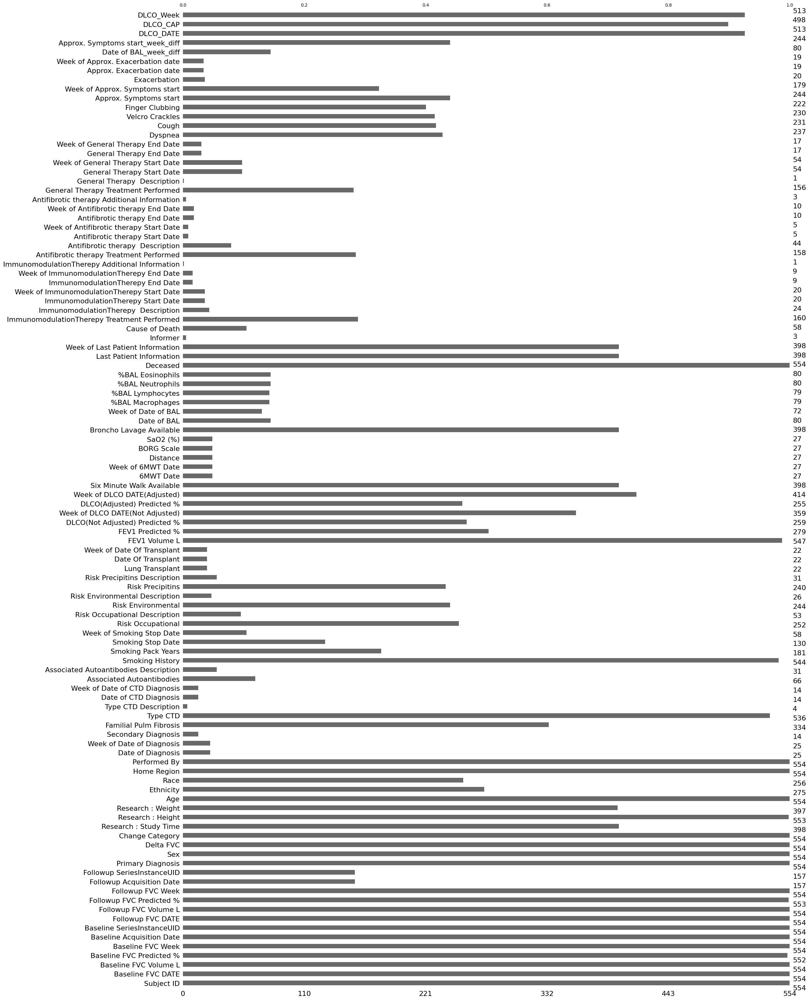

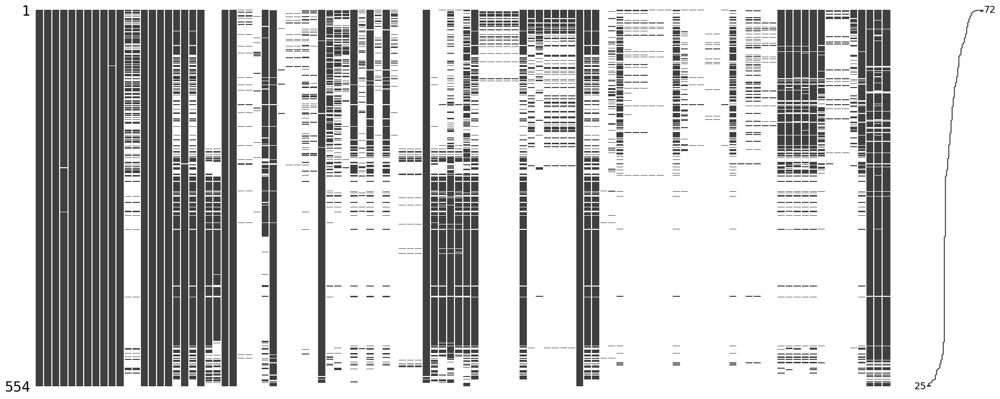

In [ ]:
import missingno as msno
import matplotlib.pyplot as plt

# Bar chart of missing values per column
msno.bar(merged_df)
plt.show()

sorted_data = msno.nullity_sort(merged_df, sort='descending') 
msno.matrix(sorted_data)
plt.show()

# import missingno as msno
# import matplotlib.pyplot as plt

# Increase global font sizes
# plt.rcParams.update({
#     "font.size": 30,          # Base font size
#     "axes.titlesize": 30,     # Title font
#     "axes.labelsize": 30,     # Axis labels
#     "xtick.labelsize": 30,    # X‑axis tick labels
#     "ytick.labelsize": 50     # Y‑axis tick labels
# })

# # Bar chart of missing values per column
# plt.figure(figsize=(12, 6))
# msno.bar(merged_df)
# plt.title("Missing Values per Column")
# plt.show()

# # Sorted matrix plot
# sorted_data = msno.nullity_sort(merged_df, sort='descending')

# plt.figure(figsize=(12, 6))
# msno.matrix(sorted_data)
# plt.title("Missing Data Matrix (Sorted)")
# plt.show()



In [66]:
# Fraction of missing values per column
col_missing_fraction = merged_df.isna().mean()
print(dict(col_missing_fraction*100))
# Columns with >80% missing
cols_with_many_nans = col_missing_fraction[col_missing_fraction * 100 > 11].index.tolist()
print(cols_with_many_nans)
len(cols_with_many_nans)

{'Subject ID': 0.0, 'Baseline FVC DATE': 0.0, 'Baseline FVC Volume L': 0.0, 'Baseline FVC Predicted %': 0.36101083032490977, 'Baseline FVC Week': 0.0, 'Baseline Acquisition Date': 0.0, 'Baseline SeriesInstanceUID': 0.0, 'Followup FVC DATE': 0.0, 'Followup FVC Volume L': 0.0, 'Followup FVC Predicted %': 0.18050541516245489, 'Followup FVC Week': 0.0, 'Followup Acquisition Date': 71.66064981949458, 'Followup SeriesInstanceUID': 71.66064981949458, 'Primary Diagnosis': 0.0, 'Sex': 0.0, 'Delta FVC': 0.0, 'Change Category': 0.0, 'Research : Study Time': 28.158844765342963, 'Research : Height': 0.18050541516245489, 'Research : Weight': 28.339350180505413, 'Age': 0.0, 'Ethnicity': 50.361010830324915, 'Race': 53.79061371841155, 'Home Region': 0.0, 'Performed By': 0.0, 'Date of Diagnosis': 95.48736462093864, 'Week of Date of Diagnosis': 95.48736462093864, 'Secondary Diagnosis': 97.47292418772562, 'Familial Pulm Fibrosis': 39.71119133574007, 'Type CTD': 3.2490974729241873, 'Type CTD Description': 

80

In [67]:
# Drop those columns
filtered_df_clean = merged_df.drop(columns=cols_with_many_nans)
print("New shape (after dropping >% missing columns):", filtered_df_clean.shape)
list(filtered_df_clean.columns)

New shape (after dropping >% missing columns): (554, 26)


['Subject ID',
 'Baseline FVC DATE',
 'Baseline FVC Volume L',
 'Baseline FVC Predicted %',
 'Baseline FVC Week',
 'Baseline Acquisition Date',
 'Baseline SeriesInstanceUID',
 'Followup FVC DATE',
 'Followup FVC Volume L',
 'Followup FVC Predicted %',
 'Followup FVC Week',
 'Primary Diagnosis',
 'Sex',
 'Delta FVC',
 'Change Category',
 'Research : Height',
 'Age',
 'Home Region',
 'Performed By',
 'Type CTD',
 'Smoking History',
 'FEV1 Volume L',
 'Deceased',
 'DLCO_DATE',
 'DLCO_CAP',
 'DLCO_Week']

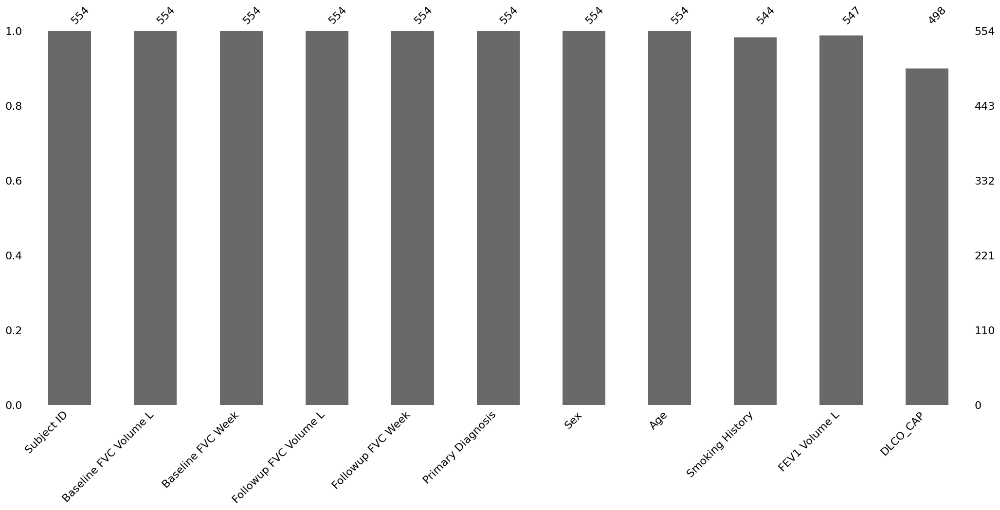

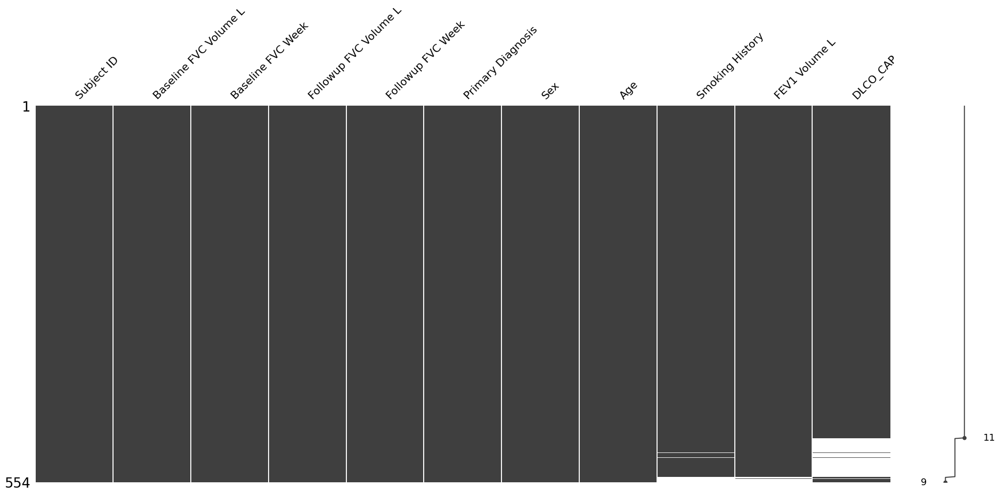

In [68]:
import missingno as msno
import matplotlib.pyplot as plt

Clinical_demographic_data = filtered_df_clean[['Subject ID',
 'Baseline FVC Volume L',
 'Baseline FVC Week',
 'Followup FVC Volume L',
 'Followup FVC Week',
 'Primary Diagnosis',
 'Sex',
 'Age',
 'Smoking History',
 'FEV1 Volume L',
'DLCO_CAP'
]]

# Bar chart of missing values per column
msno.bar(Clinical_demographic_data)
plt.show()

sorted_data = msno.nullity_sort(Clinical_demographic_data, sort='descending') 
msno.matrix(sorted_data)
plt.show()


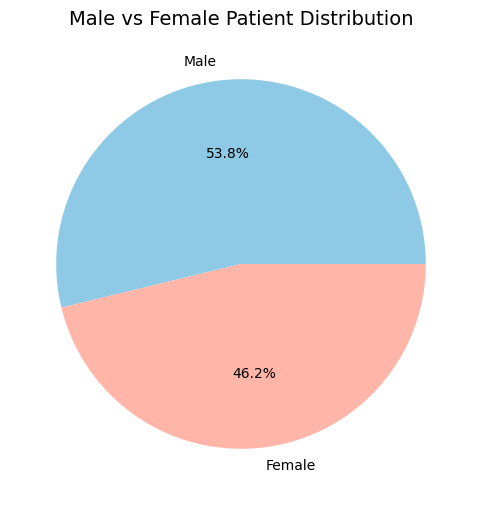

In [82]:

sex_counts = Clinical_demographic_data['Sex'].value_counts()

plt.figure(figsize=(6, 6))
plt.pie(sex_counts.values, labels=sex_counts.index, autopct='%1.1f%%', 
        colors=['#8ecae6', '#ffb5a7'])

plt.title("Male vs Female Patient Distribution", fontsize=14)
plt.show()


In [83]:
Clinical_demographic_data['Age'].describe()

count    554.000000
mean      65.115523
std       12.390614
min       16.000000
25%       58.000000
50%       67.000000
75%       74.000000
max       89.000000
Name: Age, dtype: float64

In [69]:
Clinical_demographic_data[Clinical_demographic_data["Primary Diagnosis"]== "IPF"]

,Subject ID,Baseline FVC Volume L,Baseline FVC Week,Followup FVC Volume L,Followup FVC Week,Primary Diagnosis,Sex,Age,Smoking History,FEV1 Volume L,DLCO_CAP
3,111522,2.88,0,2.830,48.0,IPF,Male,67.0,Ex Smoker,2.41,10.49
5,116111,2.79,0,3.260,48.0,IPF,Male,61.0,Ex Smoker,1.98,8.32
8,133692,3.35,0,3.470,48.0,IPF,Male,70.0,Ex Smoker,3.09,NaT
17,165755,2.87,0,2.871,55.0,IPF,Male,68.0,NaN,NaN,40.203601
18,166351,3.07,0,3.010,56.0,IPF,Male,60.0,Ex Smoker,2.43,5.44
...,...,...,...,...,...,...,...,...,...,...,...
544,1002394,2.57,0,2.700,56.0,IPF,Male,62.0,Ex Smoker,1.97,1.843
546,1002411,3.42,0,3.470,56.0,IPF,Male,64.0,Ex Smoker,2.89,5.316
548,1002416,1.85,0,1.960,56.0,IPF,Male,77.0,Ex Smoker,1.51,4.28
551,1006781,2.93,0,3.060,52.0,IPF,Male,54.0,Never Smoker,2.22,NaT


In [70]:
#remove patients that does not have FEV1 Volume L
# Clinical_demographic_data.dropna(subset=["FEV1 Volume L"], inplace=True)
# Clinical_demographic_data.dropna(subset=["DLCO_CAP"], inplace=True)
# Replace empty field in smoking history column with "No Knowledge" 
Clinical_demographic_data["Smoking History"] = Clinical_demographic_data["Smoking History"].fillna("No Knowledge")
Clinical_demographic_data.to_csv("/home/pansurya/OSIC_thesis/CSV_ Files/Clinical_demographic_data.csv", index=False)
Clinical_demographic_data

/tmp/ipykernel_2797504/4038774476.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  Clinical_demographic_data["Smoking History"] = Clinical_demographic_data["Smoking History"].fillna("No Knowledge")


,Subject ID,Baseline FVC Volume L,Baseline FVC Week,Followup FVC Volume L,Followup FVC Week,Primary Diagnosis,Sex,Age,Smoking History,FEV1 Volume L,DLCO_CAP
0,100922,1.49,0,1.73,53.0,CTD-ILD,Female,77.0,Never Smoker,1.16,8.24
1,100992,2.18,0,2.08,55.0,UILD,Female,68.0,Never Smoker,1.75,13.31
2,102083,1.27,0,1.15,53.0,UILD,Female,48.0,Never Smoker,1.10,NaT
3,111522,2.88,0,2.83,48.0,IPF,Male,67.0,Ex Smoker,2.41,10.49
4,115616,3.11,0,2.93,53.0,CTD-ILD,Female,75.0,Never Smoker,2.41,17.06
...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,3.15,0,3.11,52.0,CTD-ILD,Female,62.0,Never Smoker,2.15,NaT
550,1006459,2.75,0,2.14,52.0,Idiopathic OP,Male,66.0,Never Smoker,1.82,NaT
551,1006781,2.93,0,3.06,52.0,IPF,Male,54.0,Never Smoker,2.22,NaT
552,1006982,4.21,0,4.19,52.0,IPF,Male,74.0,Never Smoker,2.74,21.77


In [71]:
print(Clinical_demographic_data["Smoking History"].isna().sum())  # should be 0

0


No missing: 17
Low missing (<11%): Index(['Baseline FVC Predicted %', 'Followup FVC Predicted %',
       'Research : Height', 'Type CTD', 'Smoking History', 'FEV1 Volume L',
       'DLCO_DATE', 'DLCO_CAP', 'DLCO_Week'],
      dtype='object')


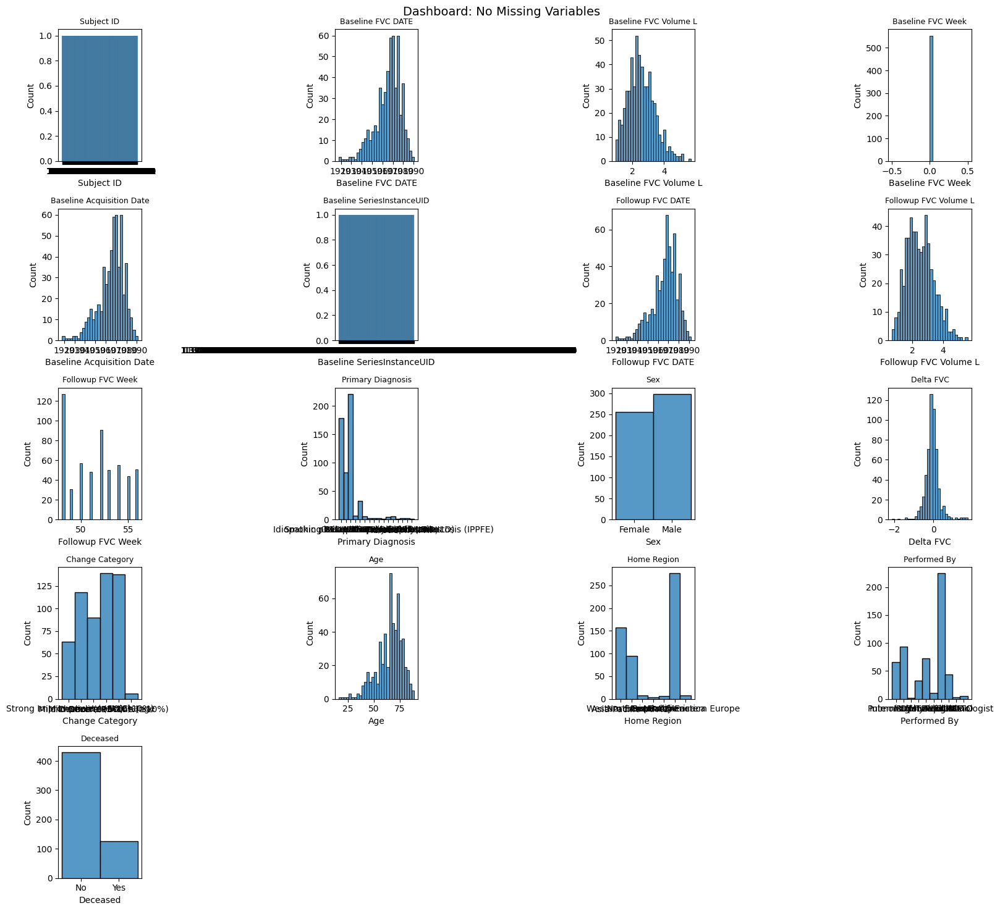

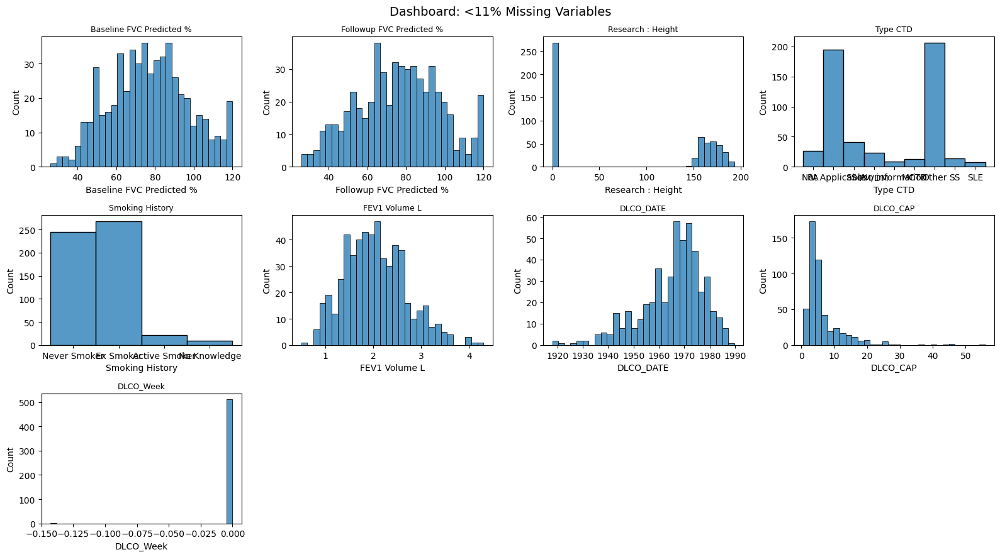

In [72]:
import math
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Suppose your dataframe is filtered_df_clean

# 1. Calculate missingness per column
missing_ratio = filtered_df_clean.isnull().mean()

# 2. Identify groups of variables
no_missing = missing_ratio[missing_ratio == 0].index
low_missing = missing_ratio[(missing_ratio > 0) & (missing_ratio < 0.11)].index

print("No missing:", len(no_missing))
print("Low missing (<11%):", (low_missing))

# -----------------------------
# Helper function to plot dashboard
# -----------------------------
def plot_dashboard(columns, title, ncols=4):
    n = len(columns)
    nrows = math.ceil(n / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(4*ncols, 3*nrows))
    axes = axes.flatten()

    for i, col in enumerate(columns):
        sns.histplot(filtered_df_clean[col].dropna(), bins=30, ax=axes[i], kde=False)
        axes[i].set_title(col, fontsize=9)
    # Hide unused subplots
    for j in range(i+1, len(axes)):
        axes[j].set_visible(False)

    fig.suptitle(title, fontsize=14)
    plt.tight_layout()
    plt.show()

# -----------------------------
# 3. Plot dashboards
# -----------------------------
plot_dashboard(no_missing, "Dashboard: No Missing Variables")
plot_dashboard(low_missing, "Dashboard: <11% Missing Variables")


No missing: 17
Low missing (<10%): 9


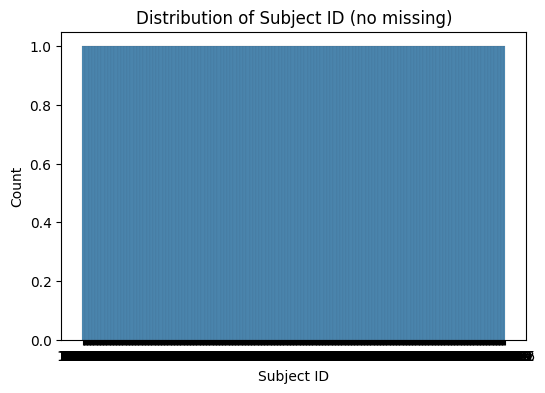

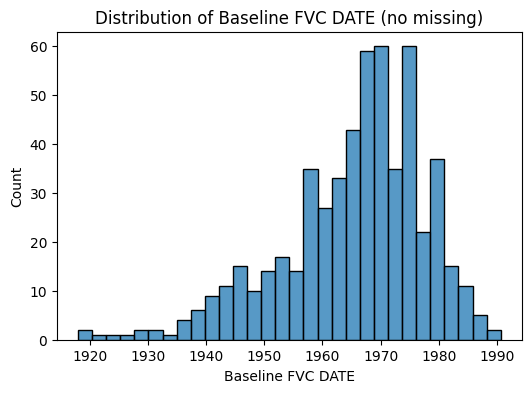

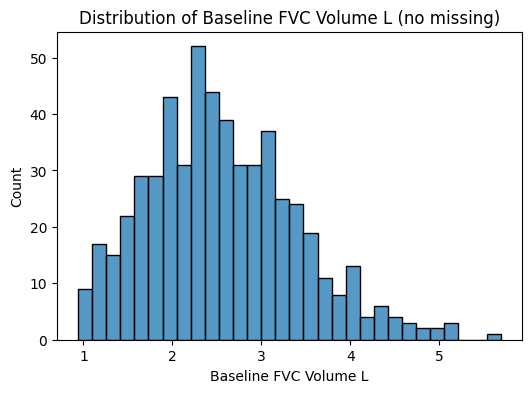

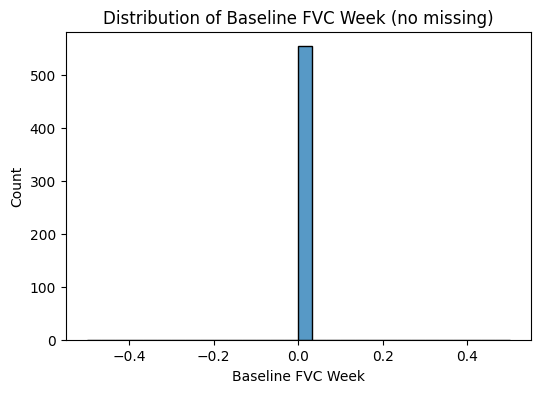

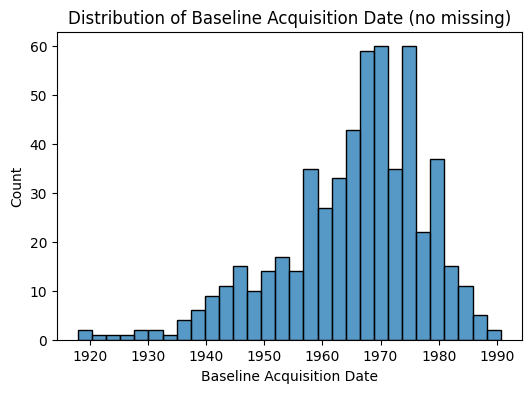

...

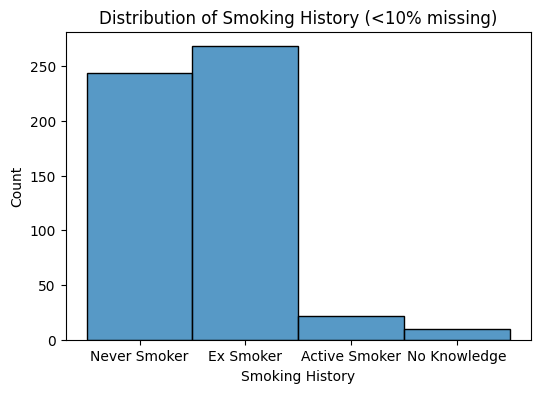

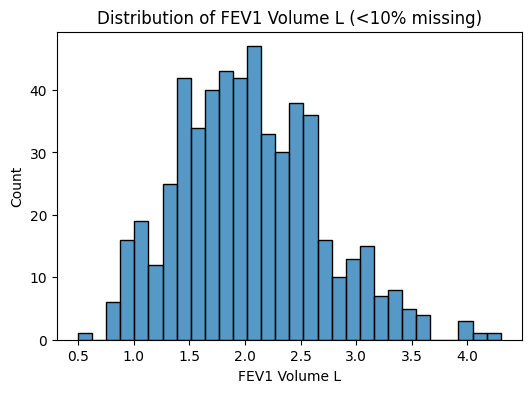

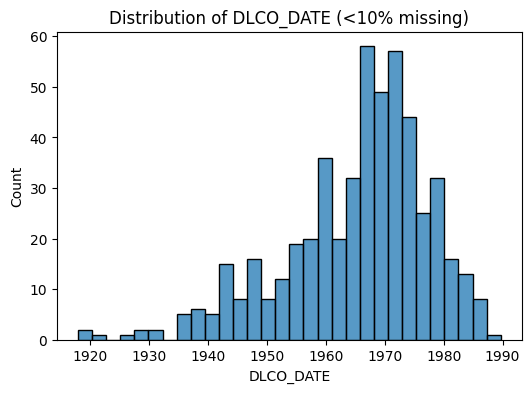

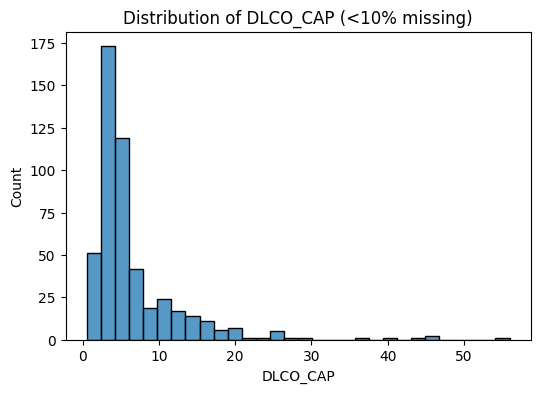

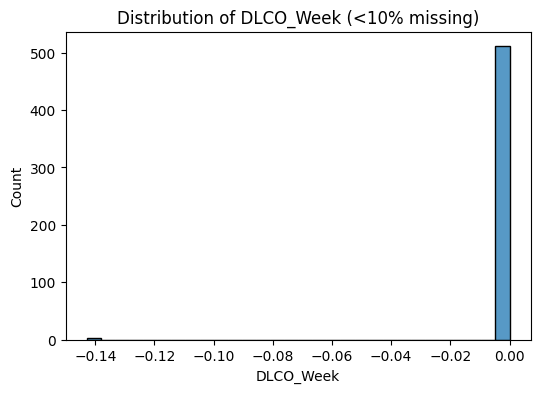

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Suppose your dataframe is called df

# 1. Calculate missingness per column
missing_ratio = filtered_df_clean.isnull().mean()

# 2. Identify groups of variables
no_missing = missing_ratio[missing_ratio == 0].index
low_missing = missing_ratio[(missing_ratio > 0) & (missing_ratio < 0.12)].index

print("No missing:", len(no_missing))
print("Low missing (<10%):", len(low_missing))

# 3. Plot histograms for no-missing variables
for col in no_missing:
    plt.figure(figsize=(6,4))
    sns.histplot(filtered_df_clean[col], kde=False, bins=30)
    plt.title(f"Distribution of {col} (no missing)")
    plt.show()

# 4. Plot histograms for low-missing variables
for col in low_missing:
    plt.figure(figsize=(6,4))
    sns.histplot(filtered_df_clean[col].dropna(), kde=False, bins=30)
    plt.title(f"Distribution of {col} (<10% missing)")
    plt.show()


In [74]:
filtered_df_clean[filtered_df_clean["Change Category"]== "Severe Decline (≥10%)"]

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,Age,Home Region,Performed By,Type CTD,Smoking History,FEV1 Volume L,Deceased,DLCO_DATE,DLCO_CAP,DLCO_Week
20,173533,1976-09-27,1.51,76.0,0,1976-09-27,1.2.840.113704.1.111.9704.1386252570.12,1977-09-26,1.08,55.0,...,76.0,Western Europe,Pulmonogists,Not Applicable,Never Smoker,1.05,Yes,NaT,NaT,NaN
22,178448,1956-10-22,2.93,64.0,0,1956-10-22,1.3.6.1.4.1.19291.2.1.2.1162211771921352225918...,1957-10-21,1.55,34.0,...,56.0,Western Europe,MDT,Not Applicable,Never Smoker,2.55,Yes,1956-10-22,11.49,0.0
26,194700,1980-09-22,1.68,85.3,0,1980-09-22,1.2.392.200036.9116.2.6.1.3268.2047398422.1492...,1981-09-07,1.24,77.0,...,80.0,Asia-Pacific (APAC),Pulmonologist,Not Applicable,Never Smoker,0.50,Yes,1980-09-22,2.83,0.0
37,250726,1975-09-29,2.06,82.0,0,1975-09-29,1.2.840.113704.1.111.11520.1356000763.13,1976-10-25,1.84,74.0,...,74.0,Western Europe,Pulmonogists,Not Applicable,Ex Smoker,1.71,Yes,NaT,NaT,NaN
40,255488,1978-09-25,2.58,85.0,0,1978-09-25,1.2.840.113704.1.111.7076.1328110819.13,1979-10-08,1.76,58.0,...,77.0,Western Europe,MDT,Not Applicable,Ex Smoker,2.03,Yes,NaT,NaT,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
528,1001384,1964-12-01,1.53,59.8,0,1964-12-01,1.2.826.0.1.3680043.10.1218.113962226415490915...,1965-11-02,1.35,53.9,...,65.0,North America,RHEUMATO,Other,Never Smoker,1.33,No,1964-12-01,1.8414,0.0
534,1001406,1986-01-01,1.38,65.0,0,1986-01-01,1.2.826.0.1.3680043.10.1218.833400882502649081...,1986-12-03,0.84,38.0,...,86.0,North America,PNEUMO,Other,Never Smoker,1.23,No,1986-01-01,1.935144,0.0
538,1001418,1968-12-01,2.47,73.0,0,1968-12-01,1.2.826.0.1.3680043.10.1218.156537498479849626...,1969-11-02,2.05,67.8,...,69.0,North America,PNEUMO,SS,Never Smoker,2.17,Yes,1968-12-01,4.82112,0.0
541,1002381,1943-06-01,2.34,65.0,0,1943-06-01,1.2.826.0.1.3680043.10.1218.365681510223403410...,1944-06-06,2.08,58.0,...,43.0,Central & Eastern Europe,MDT,NaN,Never Smoker,2.10,No,1943-06-01,1.521,0.0


In [75]:
# import seaborn as sns
# import matplotlib.pyplot as plt
# mapping = {
#     "Severe Decline (≥10%)": -2,
#     "Mild Decline (5–10%)": -1,
#     "Mild Decline (0–5%)": -0.5,
#     "No Change": 0,
#     "Improvement (0–10%)": 1,
#     "Strong Improvement (>10%)": 2
# }
# # Age distribution
# sns.boxplot(x="Change Category", y="Age", data=filtered_df_clean, order=mapping.keys())
# plt.xticks(rotation=30, ha="right")
# plt.title("Age by Change Category")
# plt.show()

# # Sex distribution
# sns.countplot(x="Change Category", hue="Sex", data=filtered_df_clean, order=mapping.keys())
# plt.xticks(rotation=30, ha="right")
# plt.title("Sex distribution across Change Categories")
# plt.show()

# # Sex distribution
# sns.countplot(x="Change Category", hue="Deceased", data=filtered_df_clean, order=mapping.keys())
# plt.xticks(rotation=30, ha="right")
# plt.title("Deceased distribution across Change Categories")
# plt.show()


# # Therapy distribution
# therapy_cols = [
#     "ImmunomodulationTherepy Treatment Performed",
#     "Antifibrotic therapy Treatment Performed",
#     "General Therapy Treatment Performed"
# ]

# for col in therapy_cols:
#     sns.countplot(x="Change Category", hue=col, data=filtered_df_clean, order=mapping.keys())
#     plt.xticks(rotation=30, ha="right")
#     plt.title(f"{col} vs Change Category")
#     plt.show()


In [76]:
filtered_df_clean[[
 'FEV1 Volume L',
 'Deceased',
 'DLCO_DATE',
 'DLCO_CAP',
 'DLCO_Week']]




,FEV1 Volume L,Deceased,DLCO_DATE,DLCO_CAP,DLCO_Week
0,1.16,No,1976-09-27,8.24,0.0
1,1.75,No,1969-10-06,13.31,0.0
2,1.10,Yes,NaT,NaT,NaN
3,2.41,No,1967-10-09,10.49,0.0
4,2.41,No,1976-09-27,17.06,0.0
...,...,...,...,...,...
549,2.15,No,NaT,NaT,NaN
550,1.82,No,NaT,NaT,NaN
551,2.22,No,NaT,NaT,NaN
552,2.74,No,1973-07-01,21.77,0.0


In [77]:
#Fill up the messing value

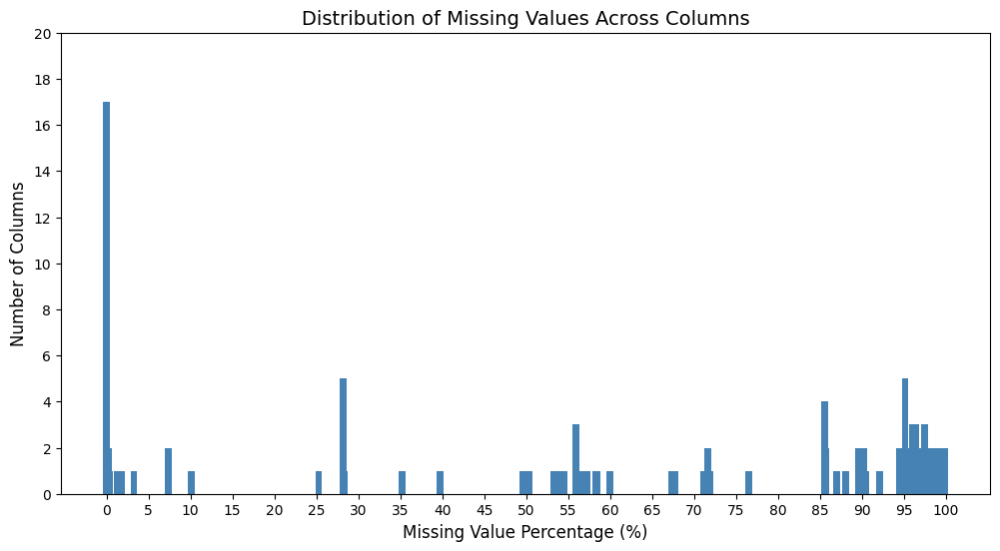

In [78]:
# Calculate missing percentage per column
missing_percentages = (merged_df.isna().mean() * 100)

# Count how many columns have each missing percentage
missing_distribution = missing_percentages.value_counts().sort_index()

# Plot
plt.figure(figsize=(12,6))
plt.bar(missing_distribution.index, missing_distribution.values, color="steelblue")
plt.xlabel("Missing Value Percentage (%)", fontsize=12)
plt.ylabel("Number of Columns", fontsize=12)
plt.title("Distribution of Missing Values Across Columns", fontsize=14)
plt.yticks(range(0, 21, 2))
plt.xticks(range(0, 101, 5))  # tick marks every 5%
plt.show()


### Correlation between radiomics and followup FVC

In [79]:
#merge radiomics and clinical data for see the correlation between radiomics features and Followup FVC

# radiomic_features_csv = pd.read_csv("/home/pansurya/OSIC_thesis/radiomics_files/RadiomicsFeaturesresults_main.csv")
# radiomic_features_csv.head()

### One‑Hot Encoding

In [80]:
# import pandas as pd
# from sklearn.impute import SimpleImputer
# from sklearn.preprocessing import StandardScaler
# from sklearn.preprocessing import OneHotEncoder
# filtered_df_clean[['Subject ID',
#  'Baseline FVC DATE',
#  'Baseline FVC Volume L',
#  'Baseline FVC Predicted %',
#  'Baseline FVC Week',
#  'Baseline Acquisition Date',
#  'Baseline SeriesInstanceUID',
#  'Followup FVC DATE',
#  'Followup FVC Volume L',
#  'Followup FVC Predicted %',
#  'Followup FVC Week',
#  'Primary Diagnosis',
#  'Sex',
#  'Delta FVC',
#  'Change Category',
#  'Research : Height',
#  'Age',
#  'Home Region',
#  'Performed By',
#  'Smoking History',
#  'FEV1 Volume L',
#  'Deceased',
#  'DLCO_DATE',
#  'DLCO_CAP',
#  'DLCO_Week']]
# # Force conversion to numeric
# filtered_df_clean["DLCO_CAP"] = pd.to_numeric(filtered_df_clean["DLCO_CAP"], errors="coerce")


# # Define categorical and numeric columns
# cat_cols = ['Primary Diagnosis', 'Sex', 'Home Region', 'Performed By', 'Smoking History', 'Deceased']
# num_cols = ['DLCO_CAP', 'FEV1 Volume L', 'Age', 'Followup FVC Predicted %', 'Baseline FVC Predicted %']

# # --- 1. Impute categorical columns with most frequent ---
# cat_imputer = SimpleImputer(strategy="most_frequent")
# imputed_cats = cat_imputer.fit_transform(filtered_df_clean[cat_cols])
# filtered_df_clean[cat_cols] = pd.DataFrame(imputed_cats, columns=cat_cols, index=filtered_df_clean.index)

# # --- 2. Impute numeric columns with mean ---
# num_imputer = SimpleImputer(strategy="mean")
# imputed_nums = num_imputer.fit_transform(filtered_df_clean[num_cols])
# filtered_df_clean[num_cols] = pd.DataFrame(imputed_nums, columns=num_cols, index=filtered_df_clean.index)



# encoder = OneHotEncoder(sparse_output=False, drop=None)
# encoded = encoder.fit_transform(filtered_df_clean[['Primary Diagnosis', 'Sex', 'Home Region', 'Performed By', 'Smoking History', 'Deceased']]).astype(int)

# # Convert back to DataFrame with column names
# encoded_df = pd.DataFrame(encoded, columns=encoder.get_feature_names_out(['Primary Diagnosis', 'Sex', 'Home Region', 'Performed By', 'Smoking History', 'Deceased']))
# Clinical_df_encoded = pd.concat([filtered_df_clean.drop(['Primary Diagnosis', 'Sex', 'Home Region', 'Performed By', 'Smoking History', 'Deceased'], axis=1), encoded_df], axis=1)
# Clinical_df_encoded

In [81]:
Clinical_df_encoded["Subject ID"] = Clinical_df_encoded["Subject ID"].astype(str)
radiomic_features_csv["PatientID"] = radiomic_features_csv["PatientID"].astype(str)

Clinical_df_encoded["Baseline Acquisition Date"] = pd.to_datetime(Clinical_df_encoded["Baseline Acquisition Date"], errors="coerce")
radiomic_features_csv["BaselineDate"] = pd.to_datetime(radiomic_features_csv["BaselineDate"], errors="coerce")

# final_df["Followup FVC Volume L"] = final_df["Followup FVC Volume L"].astype(float)
# filtered_df_csv["FVC Volume L"] = filtered_df_csv["FVC Volume L"].astype(float)
# Now merge
merged_radiomic_clinical = pd.merge(
    radiomic_features_csv,
    Clinical_df_encoded,
    how="inner",
    left_on=["PatientID", "BaselineDate"],
    right_on=["Subject ID", "Baseline Acquisition Date"]
)

print("Merged shape:", merged_radiomic_clinical.shape)
print(list(merged_radiomic_clinical.columns))
merged_radiomic_clinical
# merged_radiomic_clinical[['original_shape_VoxelVolume_label1', 'original_shape_VoxelVolume_label2','Followup FVC Volume L', 'Followup FVC Volume L']]


NameError: name 'Clinical_df_encoded' is not defined

In [ ]:
#Drop the right-side join columns
merged_radiomic_FVC = merged_radiomic_clinical.drop(columns=["PatientID", "SeriesUID", "BaselineDate", "Image", "Mask", 'Subject ID', 'Baseline FVC DATE', 'Baseline FVC Week', 'Baseline Acquisition Date', 'Baseline SeriesInstanceUID', 'Followup FVC Week', 'Followup FVC DATE', 'Delta FVC', "Change Category", 'Research : Height', 'DLCO_DATE', 'DLCO_Week'])
merged_radiomic_FVC

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,Performed By_Pulmonogists,Performed By_Pulmonologist,Performed By_RHEUMATO,Performed By_pulmonologist,Smoking History_Active Smoker,Smoking History_Ex Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge,Deceased_No,Deceased_Yes
0,0.420187,0.130738,52.402080,400.816893,439.550907,184.458667,460.108683,475.458726,1.886126e+06,168.417965,...,0,0,1,0,0,1,0,0,1,0
1,0.831037,0.732034,129.431489,176.810734,246.916990,196.124960,185.000000,247.543935,2.056160e+06,146.936264,...,0,0,0,0,0,0,1,0,1,0
2,0.847265,0.639267,120.835834,189.022386,217.816436,238.824203,200.249844,250.710989,1.901542e+06,160.152094,...,0,0,0,0,0,1,0,0,1,0
3,0.918112,0.553487,106.066920,191.634136,260.931025,229.386137,195.310010,267.845104,1.776213e+06,175.941563,...,0,0,0,0,0,0,1,0,1,0
4,0.815482,0.730328,132.707854,181.709883,232.422030,205.761998,193.080294,249.142529,2.065693e+06,148.181096,...,0,1,0,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.726119,0.484869,125.748118,259.344354,293.264386,208.081715,310.104821,313.972929,3.210182e+06,188.314793,...,1,0,0,0,0,1,0,0,1,0
571,0.449398,0.126135,58.291219,462.135209,568.148748,217.082933,590.371070,592.218710,2.884371e+06,207.682551,...,0,0,0,0,0,0,1,0,1,0
572,0.881909,0.704290,161.614927,229.472190,289.689489,235.416652,282.793211,295.448811,4.013125e+06,202.373703,...,0,0,0,0,0,1,0,0,1,0
573,0.695807,0.340087,82.987358,244.018123,277.504955,177.417587,332.031625,335.005970,1.664340e+06,169.789506,...,0,0,0,0,0,1,0,0,1,0


In [ ]:
from sklearn.feature_selection import VarianceThreshold

vt = VarianceThreshold(threshold=0)  # remove features with 0 variance
merged_radiomic_FVC_scaled = pd.DataFrame(vt.fit_transform(merged_radiomic_FVC), columns=merged_radiomic_FVC.columns[vt.get_support()])
merged_radiomic_FVC_scaled

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,Performed By_Pulmonogists,Performed By_Pulmonologist,Performed By_RHEUMATO,Performed By_pulmonologist,Smoking History_Active Smoker,Smoking History_Ex Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge,Deceased_No,Deceased_Yes
0,0.420187,0.130738,52.402080,400.816893,439.550907,184.458667,460.108683,475.458726,1.886126e+06,168.417965,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,0.831037,0.732034,129.431489,176.810734,246.916990,196.124960,185.000000,247.543935,2.056160e+06,146.936264,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
2,0.847265,0.639267,120.835834,189.022386,217.816436,238.824203,200.249844,250.710989,1.901542e+06,160.152094,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,0.918112,0.553487,106.066920,191.634136,260.931025,229.386137,195.310010,267.845104,1.776213e+06,175.941563,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
4,0.815482,0.730328,132.707854,181.709883,232.422030,205.761998,193.080294,249.142529,2.065693e+06,148.181096,...,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.726119,0.484869,125.748118,259.344354,293.264386,208.081715,310.104821,313.972929,3.210182e+06,188.314793,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
571,0.449398,0.126135,58.291219,462.135209,568.148748,217.082933,590.371070,592.218710,2.884371e+06,207.682551,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0
572,0.881909,0.704290,161.614927,229.472190,289.689489,235.416652,282.793211,295.448811,4.013125e+06,202.373703,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
573,0.695807,0.340087,82.987358,244.018123,277.504955,177.417587,332.031625,335.005970,1.664340e+06,169.789506,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0


In [ ]:
from sklearn.preprocessing import StandardScaler
# Normalize (z-score)
scaler = StandardScaler()
merged_radiomic_FVC_var = pd.DataFrame(scaler.fit_transform(merged_radiomic_FVC_scaled), columns=merged_radiomic_FVC_scaled.columns, index=merged_radiomic_FVC_scaled.index)
merged_radiomic_FVC_var

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,Performed By_Pulmonogists,Performed By_Pulmonologist,Performed By_RHEUMATO,Performed By_pulmonologist,Smoking History_Active Smoker,Smoking History_Ex Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge,Deceased_No,Deceased_Yes
0,-1.320348,-1.502801,-1.443448,1.034794,0.845200,-0.401933,1.444095,0.894661,-0.506973,0.139028,...,-0.360092,-0.384324,3.205388,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
1,0.671568,1.062856,0.534138,-0.753822,-0.524401,-0.309196,-0.790867,-0.625478,-0.372723,-0.847983,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548,-0.548548
2,0.750247,0.667031,0.313461,-0.656316,-0.731302,0.030225,-0.666978,-0.604355,-0.494801,-0.240761,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
3,1.093731,0.301015,-0.065704,-0.635462,-0.424763,-0.044800,-0.707109,-0.490074,-0.593755,0.484711,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548,-0.548548
4,0.596152,1.055577,0.618253,-0.714704,-0.627458,-0.232590,-0.725223,-0.614816,-0.365196,-0.790788,...,-0.360092,2.601974,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.162895,0.008234,0.439575,-0.094818,-0.194877,-0.214151,0.225475,-0.182412,0.538434,1.053219,...,2.777071,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
571,-1.178725,-1.522444,-1.292256,1.524401,1.759514,-0.142599,2.502337,1.673424,0.281190,1.943101,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548,-0.548548
572,0.918212,0.944474,1.360388,-0.333338,-0.220294,0.003138,0.003598,-0.305964,1.172396,1.699178,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
573,0.015935,-0.609536,-0.658228,-0.217193,-0.306925,-0.457903,0.403607,-0.042126,-0.682084,0.202045,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548


In [ ]:
# Separate features and target
X_var = merged_radiomic_FVC_var.drop(columns=["Followup FVC Volume L"])   # all radiomics features

y = merged_radiomic_FVC_var["Followup FVC Volume L"]                  # outcome (follow-up FVC)
X_var

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,Performed By_Pulmonogists,Performed By_Pulmonologist,Performed By_RHEUMATO,Performed By_pulmonologist,Smoking History_Active Smoker,Smoking History_Ex Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge,Deceased_No,Deceased_Yes
0,-1.320348,-1.502801,-1.443448,1.034794,0.845200,-0.401933,1.444095,0.894661,-0.506973,0.139028,...,-0.360092,-0.384324,3.205388,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
1,0.671568,1.062856,0.534138,-0.753822,-0.524401,-0.309196,-0.790867,-0.625478,-0.372723,-0.847983,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548,-0.548548
2,0.750247,0.667031,0.313461,-0.656316,-0.731302,0.030225,-0.666978,-0.604355,-0.494801,-0.240761,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
3,1.093731,0.301015,-0.065704,-0.635462,-0.424763,-0.044800,-0.707109,-0.490074,-0.593755,0.484711,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548,-0.548548
4,0.596152,1.055577,0.618253,-0.714704,-0.627458,-0.232590,-0.725223,-0.614816,-0.365196,-0.790788,...,-0.360092,2.601974,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.162895,0.008234,0.439575,-0.094818,-0.194877,-0.214151,0.225475,-0.182412,0.538434,1.053219,...,2.777071,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
571,-1.178725,-1.522444,-1.292256,1.524401,1.759514,-0.142599,2.502337,1.673424,0.281190,1.943101,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548,-0.548548
572,0.918212,0.944474,1.360388,-0.333338,-0.220294,0.003138,0.003598,-0.305964,1.172396,1.699178,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548
573,0.015935,-0.609536,-0.658228,-0.217193,-0.306925,-0.457903,0.403607,-0.042126,-0.682084,0.202045,...,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548,-0.548548


In [ ]:
import pandas as pd

# Suppose X is your DataFrame of features (patients × features)

# 1. Calculate missingness per feature
missing_fraction = merged_radiomic_FVC.isnull().mean()   # fraction of NaNs per column

# 2. Filter out features with > 0.5 (50%) missing values
X_filtered = merged_radiomic_FVC.loc[:, missing_fraction <= 0]

print("Original features:", merged_radiomic_FVC.shape[1])
print("After missingness filter:", X_filtered.shape[1])


Original features: 2680
After missingness filter: 2680


In [ ]:
#using pam clustering algo
import pandas as pd
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import calculate_distance_matrix

def pam_feature_selection_pyclust(X, y=None, k=150, use_outcome=False, random_state=42):

    # 2) Spearman correlation and distance
    corr = X.corr(method="spearman").abs().fillna(0.0)
    dist = 1.0 - corr.values
    np.fill_diagonal(dist, 0.0)

    # 3) Initial medoids (choose k random features as starting points)
    rng = np.random.default_rng(random_state)
    initial_medoids = rng.choice(range(len(X.columns)), size=k, replace=False).tolist()

    # 4) Run k-medoids on distance matrix
    kmedoids_instance = kmedoids(dist, initial_medoids, data_type='distance_matrix')
    kmedoids_instance.process()

    clusters = kmedoids_instance.get_clusters()
    medoids = kmedoids_instance.get_medoids()

    # 5) Representatives
    reps = X.columns[medoids].tolist()

    if use_outcome and (y is not None):
        reps_outcome = []
        for cluster in clusters:
            feats = X.columns[cluster]
            corrs_to_y = X[feats].apply(lambda col: abs(col.corr(y)))
            reps_outcome.append(corrs_to_y.idxmax())
        reps = reps_outcome

    return reps, clusters, dist

# -----------------------
# Example usage:
reps, clusters, dist = pam_feature_selection_pyclust(X_var, y, k=120, use_outcome=True)




In [ ]:
X_selected_pam = merged_radiomic_FVC_var[reps]
X_selected_pam
# Separate features and target
X_selected_pam['Followup FVC Volume L']= merged_radiomic_FVC_var['Followup FVC Volume L']
X_pam = X_selected_pam.drop(columns=["Followup FVC Volume L"])   # all radiomics features
y_pam = X_selected_pam["Followup FVC Volume L"]                  # outcome (follow-up FVC)

/tmp/ipykernel_1349639/2309715480.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X_selected_pam['Followup FVC Volume L']= merged_radiomic_FVC_var['Followup FVC Volume L']


100%|██████████| 80/80 [00:02<00:00, 29.83it/s]


Selected features (mRMR):
['Baseline FVC Volume L', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung', 'original_shape_MinorAxisLength_right_lung', 'Sex_Female', 'original_glrlm_GrayLevelNonUniformity_right_lung', 'original_glrlm_GrayLevelNonUniformity_left_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glszm_GrayLevelNonUniformity_right_lung', 'log-sigma-1-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_left_lung', 'log-sigma-3-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-LLH_glrlm_GrayLevelNonUniformity_left_lun

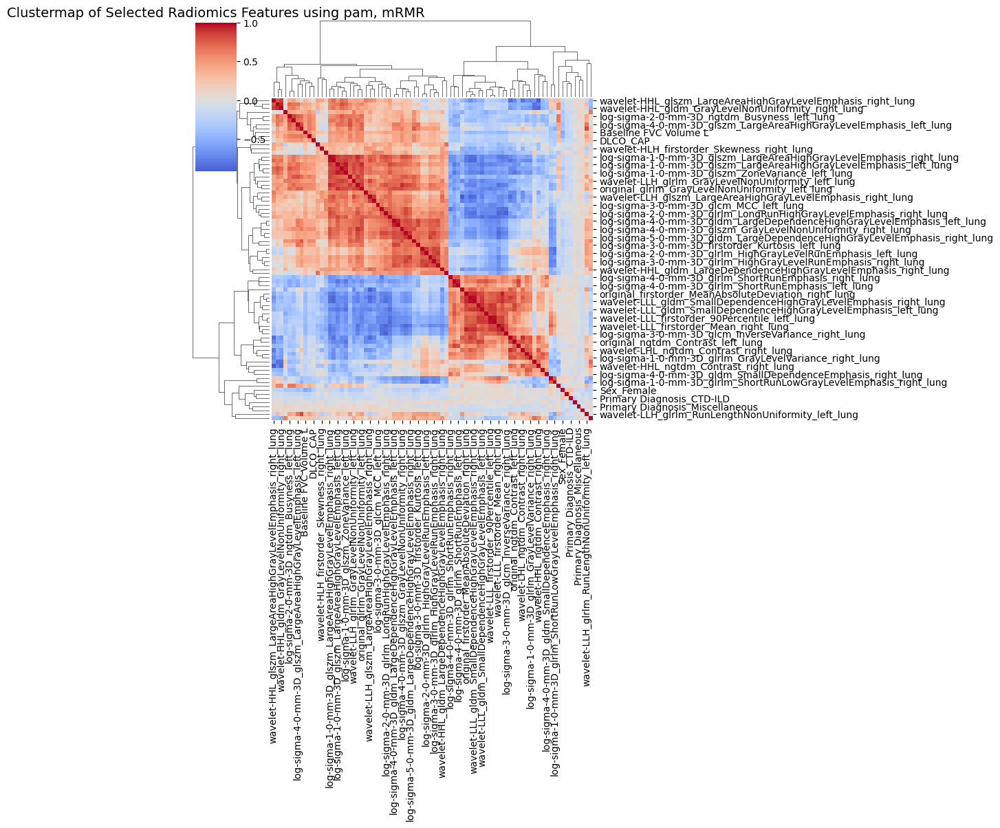

Selected features (VIF < 10):
['Baseline FVC Volume L', 'original_shape_MinorAxisLength_right_lung', 'Sex_Female', 'Smoking History_Never Smoker', 'Primary Diagnosis_Miscellaneous', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_left_lung', 'DLCO_CAP', 'wavelet-HHL_glcm_Idn_left_lung', 'log-sigma-4-0-mm-3D_glrlm_ShortRunEmphasis_right_lung', 'wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-LLH_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_glrlm_ShortRunLowGrayLevelEmphasis_right_lung', 'Age', 'wavelet-HLH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-HLH_firstorder_Skewness_right_lung', 'Smoking History_Active Smoker', 'log-sigma-5-0-mm-3D_glcm_ClusterShade_right_lung', 'wavelet-HLL_firstorder_Energy_left_lung', 'Primary Diagnosis_CTD-ILD', 'log-sigma-3-0-mm-3D_glcm_MCC_left_lung', 'wavelet-HHL_ngtdm_Strength_left_lung']
22


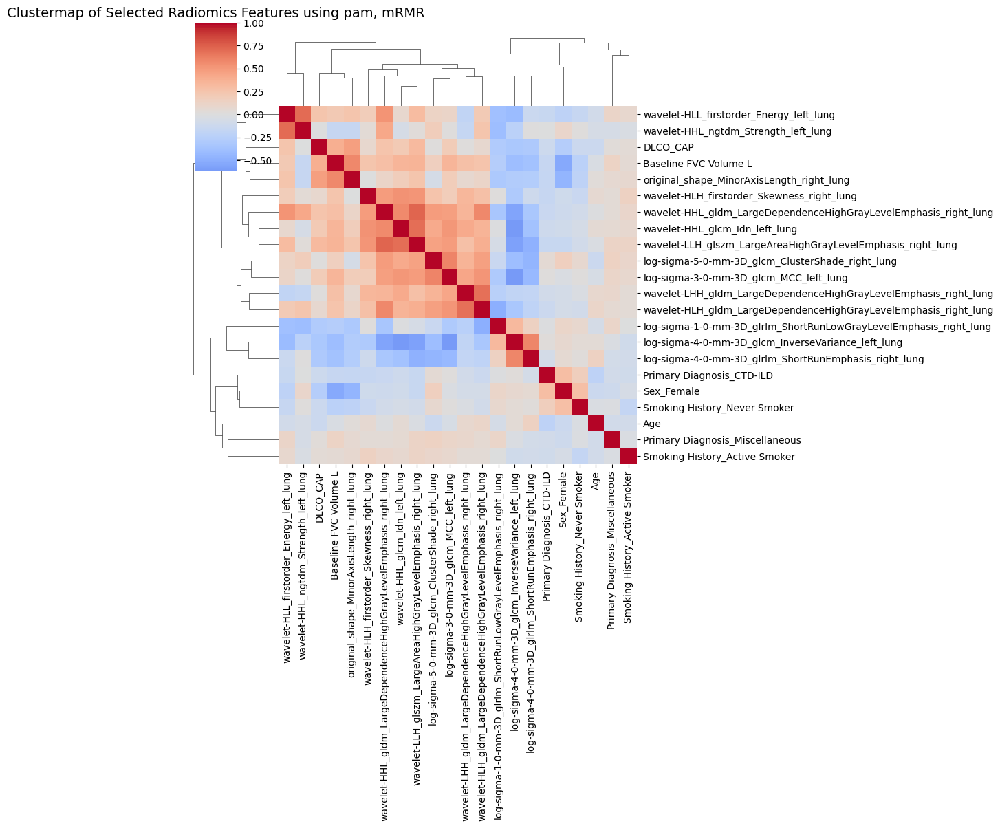

In [ ]:

#select the feature using the mRMR and then VIF
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from mrmr import mrmr_regression   # for regression targets
# from mrmr import mrmr_classif    # for classification targets


# -----------------------------
# mRMR Feature Selection
# -----------------------------
def run_mrmr(X, y, n_features=50):
    """
    Run mRMR regression to select top n_features.
    """
    selected_features = mrmr_regression(
        X=X,
        y=y,
        K=n_features  # number of features to select
    )
    return selected_features


# Select top 100 features with mRMR
selected_features = run_mrmr(X_pam, y_pam, n_features=80)

print("Selected features (mRMR):")
print(selected_features)
print(len(selected_features))

# Reduced dataset
X_mrmr = X_selected_pam[selected_features]
corr_selected = X_mrmr.corr(method="spearman")

# Clustermap of selected features
sns.clustermap(corr_selected, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features using pam, mRMR", fontsize=14)
plt.show()

# Calculate VIF for each feature
X_selected_pam = X_mrmr.values
vif_data_pam = pd.DataFrame()
vif_data_pam["feature"] = X_mrmr.columns
vif_data_pam["VIF"] = [variance_inflation_factor(X_selected_pam, i) for i in range(X_selected_pam.shape[1])]

# Keep only features with VIF < 5
low_vif_features_pam = vif_data_pam.loc[vif_data_pam["VIF"] < 10, "feature"].tolist()


print("Selected features (VIF < 10):")
print(low_vif_features_pam)
print(len(low_vif_features_pam))

# If you want the reduced DataFrame:
X_reduced_mRMR_pam = X_mrmr[low_vif_features_pam]
X_reduced_mRMR_pam
corr_selected_mRMR_pam = X_reduced_mRMR_pam.corr(method="spearman")
# Clustermap of selected features
sns.clustermap(corr_selected_mRMR_pam, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features using pam, mRMR", fontsize=14)
plt.show()

In [ ]:
#select thr features using ANOVA
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score


X1_train_pam, X1_test_pam, y1_train_pam, y1_test_pam = train_test_split(X_pam, y_pam, test_size=0.3, random_state=42)

selector = SelectKBest(score_func=f_regression, k=80)
X_train_selected_pam = selector.fit_transform(X1_train_pam, y1_train_pam)
X_test_selected_pam = selector.transform(X1_test_pam)

selected_features_pam = X_pam.columns[selector.get_support()]
f_scores_pam = selector.scores_[selector.get_support()]
print(f"Selected Features: {selected_features_pam}")
print(f"F-Scores: {f_scores_pam}")
selected_features_pam = X_selected_pam[selected_features_pam]
selected_features_pam



Selected Features: Index(['log-sigma-5-0-mm-3D_glrlm_GrayLevelVariance_left_lung',
       'wavelet-HLL_firstorder_Energy_left_lung',
       'original_firstorder_90Percentile_right_lung',
       'original_shape_Maximum2DDiameterColumn_right_lung',
       'log-sigma-3-0-mm-3D_glrlm_HighGrayLevelRunEmphasis_right_lung',
       'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
       'wavelet-LHL_ngtdm_Contrast_right_lung',
       'wavelet-HHL_gldm_GrayLevelNonUniformity_right_lung',
       'wavelet-HHL_glrlm_GrayLevelNonUniformity_left_lung',
       'log-sigma-3-0-mm-3D_glrlm_ShortRunEmphasis_left_lung',
       'wavelet-HLH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung',
       'log-sigma-3-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
       'log-sigma-4-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_left_lung',
       'wavelet-LLL_glszm_SizeZoneNonUniformityNormalized_right_lung',
       'log-sigma-3-0-mm-3D_glcm_MaximumProbability_right_lung',
       'orig

IndexError: only integers, slices (`:`), ellipsis (`...`), numpy.newaxis (`None`) and integer or boolean arrays are valid indices

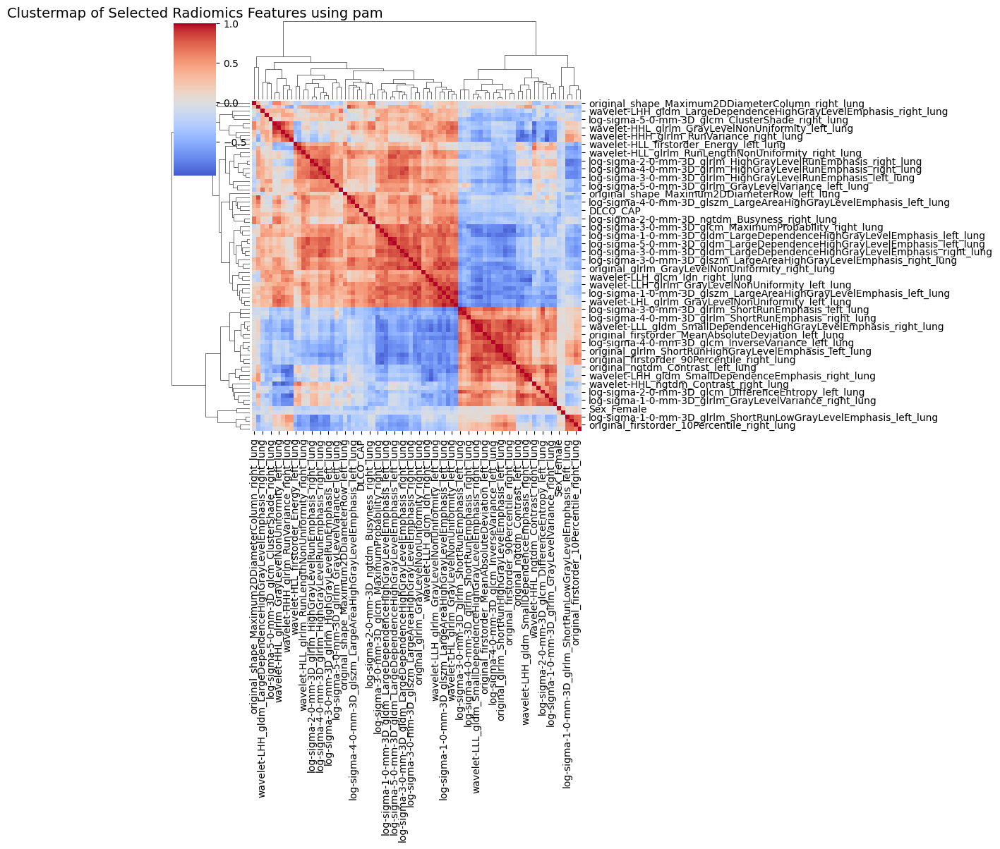

In [ ]:
#using the ANOVA
corr_selected = selected_features_pam.corr(method="spearman")

# Clustermap of selected features
sns.clustermap(corr_selected, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features using pam", fontsize=14)
plt.show()

In [ ]:
# Calculate VIF for each feature
X_selected_pam = selected_features_pam.values
vif_data_pam = pd.DataFrame()
vif_data_pam["feature"] = selected_features_pam.columns
vif_data_pam["VIF"] = [variance_inflation_factor(X_selected_pam, i) for i in range(X_selected_pam.shape[1])]

# Keep only features with VIF < 5
low_vif_features_pam = vif_data_pam.loc[vif_data_pam["VIF"] < 10, "feature"].tolist()


print("Selected features (VIF < 10):")
print(low_vif_features_pam)

# If you want the reduced DataFrame:
X_reduced_pam = selected_features_pam[low_vif_features_pam]
X_reduced_pam

Selected features (VIF < 10):
['wavelet-HLH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-HLH_firstorder_Skewness_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idn_left_lung', 'Sex_Female', 'log-sigma-5-0-mm-3D_glcm_ClusterShade_right_lung', 'log-sigma-1-0-mm-3D_glrlm_ShortRunLowGrayLevelEmphasis_right_lung', 'wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'Baseline FVC Volume L', 'DLCO_CAP', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_left_lung', 'Smoking History_Never Smoker', 'wavelet-LLH_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung']


,wavelet-HLH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung,wavelet-HLH_firstorder_Skewness_right_lung,original_shape_MinorAxisLength_right_lung,wavelet-HHL_glcm_Idn_left_lung,Sex_Female,log-sigma-5-0-mm-3D_glcm_ClusterShade_right_lung,log-sigma-1-0-mm-3D_glrlm_ShortRunLowGrayLevelEmphasis_right_lung,wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung,Baseline FVC Volume L,DLCO_CAP,log-sigma-4-0-mm-3D_glcm_InverseVariance_left_lung,Smoking History_Never Smoker,wavelet-LLH_glszm_LargeAreaHighGrayLevelEmphasis_right_lung,wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung
0,-0.145162,0.098403,0.139028,-0.625066,1.081578,-0.537603,0.000860,-0.170487,0.051535,-0.517490,0.147904,-0.883281,-0.422453,-1.097443
1,2.097253,0.842500,-0.847983,1.105808,1.081578,1.413884,0.303581,0.911395,-0.243786,-0.448600,-0.911192,1.132142,-0.005269,1.352495
2,-0.160664,1.527313,-0.240761,0.079805,-0.924575,0.911244,0.375121,0.845961,-0.078406,-0.227819,0.631733,-0.883281,-0.203815,0.939259
3,-0.150098,-0.746068,0.484711,-0.489510,-0.924575,0.393248,-0.834151,-0.224668,1.398197,-0.328527,-0.336276,1.132142,-0.386981,-0.342162
4,0.267170,1.634591,-0.790788,0.491642,-0.924575,0.914876,0.202386,0.601125,-0.231973,-0.171378,-0.232476,-0.883281,0.089996,0.822962
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.866131,2.604211,1.053219,1.692077,-0.924575,-0.600601,-0.109988,3.564583,0.098786,0.656966,0.232397,-0.883281,0.516396,-0.470460
571,-0.668050,-0.021782,1.943101,-0.269563,1.081578,-0.219068,-0.050715,0.578024,0.500422,-0.067315,0.505885,1.132142,-0.415435,-1.188478
572,0.434094,-0.159224,1.699178,-0.611377,-0.924575,-1.290873,-0.900035,0.185866,0.193289,1.432190,1.023368,-0.883281,-0.333116,0.878333
573,-0.219381,0.038259,0.202045,-0.049226,1.081578,-1.045043,0.466040,-0.275552,-0.680860,-0.551392,0.909736,-0.883281,-0.440643,-0.632174


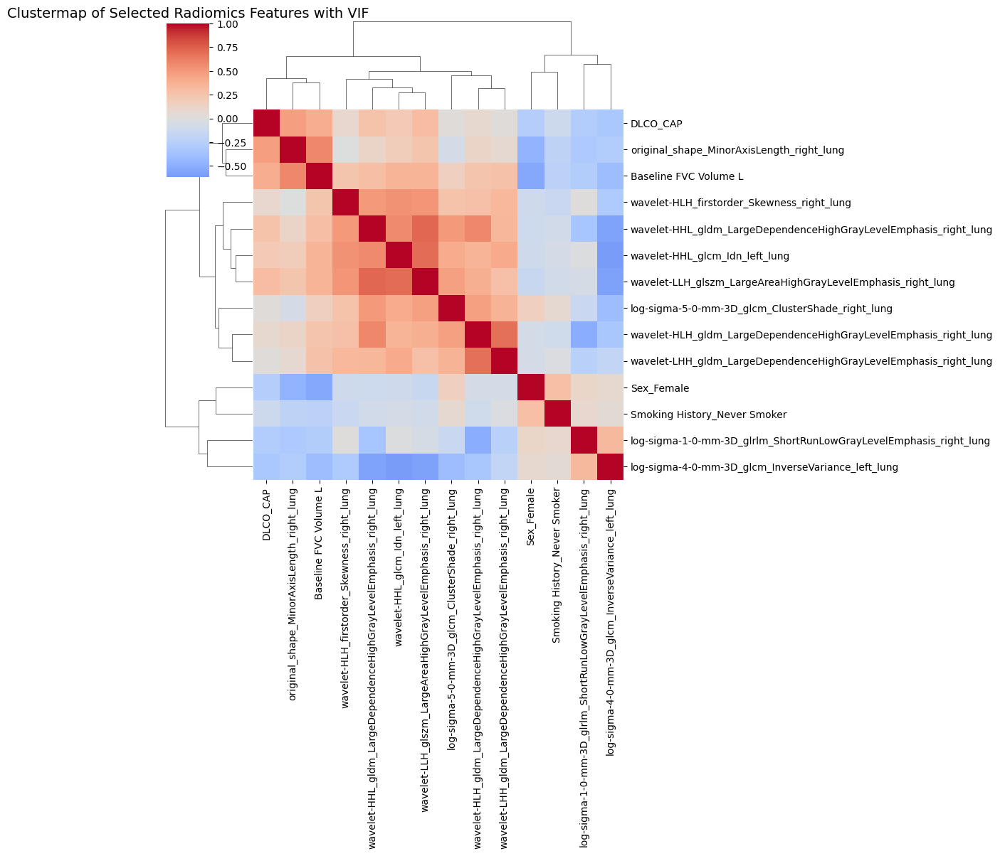

In [ ]:
#using the VIF
corr_selected = X_reduced_pam.corr(method="spearman")

# Clustermap of selected features
sns.clustermap(corr_selected, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features with VIF", fontsize=14)
plt.show()

In [ ]:
#using the corr, hierarchical cluster, select feature from each cluster using followup FVC, ANOVA, VIF
import pandas as pd
import numpy as np
from scipy.cluster.hierarchy import linkage, fcluster
from scipy.spatial.distance import squareform
import seaborn as sns
import matplotlib.pyplot as plt
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# -----------------------------
# 1. Compute absolute correlation matrix
# -----------------------------
corr = X_var.corr(method="spearman").abs()

# Clean correlation matrix
corr = corr.fillna(0.0)        # replace NaNs with 0
corr = corr.clip(0, 1)       # clip to [0,1] to avoid floating-point issues
print(corr[['original_shape_Flatness_left_lung']])
# -----------------------------
# 2. Convert to distance matrix
# -----------------------------
dist = 1 - corr.values
np.fill_diagonal(dist, 0.0)
dist_condensed = squareform(dist, checks=False)


# -----------------------------
# 3. Hierarchical clustering
# -----------------------------
linkage_matrix = linkage(dist_condensed, method='average')
# Cut dendrogram at distance threshold (0.8 = features with corr >= 0.2 grouped)
cluster_labels = fcluster(linkage_matrix, t=0.2, criterion='distance')

# Assign cluster IDs to features
clusters = pd.DataFrame({
    "Feature": X_var.columns,
    "Cluster": cluster_labels
})
print(clusters.to_dict())
# -----------------------------
# 4. Pick representative feature per cluster
# -----------------------------
# Compute Spearman correlation of each feature with target y
spearman_corr = X_var.apply(lambda col: col.corr(y, method="spearman"))

selected_features = []
for cluster_id in clusters["Cluster"].unique():
    cluster_feats = clusters.loc[clusters["Cluster"] == cluster_id, "Feature"]
    # pick feature with strongest absolute correlation to y
    best_feat = spearman_corr.loc[cluster_feats].abs().idxmax()
    selected_features.append(best_feat)

# Final reduced dataset
X_selected_hira = merged_radiomic_FVC_var[selected_features + ['Followup FVC Volume L']]

print("Number of clusters:", clusters["Cluster"].nunique())
print("Selected features:", selected_features)
# -----------------------------
# 5. Optional: visualize clustering
# -----------------------------
# sns.clustermap(corr, cmap="coolwarm", center=0, figsize=(12, 12))
# plt.title("Radiomics Feature Clustering", fontsize=14)
# plt.show()
X_selected_hira

                                                   original_shape_Flatness_left_lung
original_shape_Elongation_right_lung                                        0.812874
original_shape_Flatness_right_lung                                          0.889425
original_shape_LeastAxisLength_right_lung                                   0.653385
original_shape_MajorAxisLength_right_lung                                   0.778807
original_shape_Maximum2DDiameterColumn_right_lung                           0.686361
...                                                                              ...
Smoking History_Ex Smoker                                                   0.017687
Smoking History_Never Smoker                                                0.036605
Smoking History_No Knowledge                                                0.028052
Deceased_No                                                                 0.010014
Deceased_Yes                                                     

0      0.096584
1      0.381132
2     -0.279019
3      1.394121
4     -0.039999
         ...   
570   -0.085527
571    0.369750
572    0.016911
573   -0.609094
574   -1.018843
Name: Followup FVC Volume L, Length: 575, dtype: float64

In [ ]:
#select the feature from the each cluster using the mRMR
from mrmr import mrmr_regression

selected_features_mrmr = []

for cluster_id in clusters["Cluster"].unique():
    cluster_feats = clusters.loc[clusters["Cluster"] == cluster_id, "Feature"].tolist()
    
    # Subset the cluster features
    X_cluster = X_var[cluster_feats]
    
    # Run mRMR inside this cluster
    # K=1 means pick the single best representative feature
    # You could increase K if you want >1 feature per cluster
    selected = mrmr_regression(X=X_cluster, y=y, K=1)
    
    selected_features_mrmr.extend(selected)

# Final reduced dataset
X_selected_hira_mrmr = merged_radiomic_FVC_var[selected_features_mrmr + ['Followup FVC Volume L']]

print("Number of clusters:", clusters["Cluster"].nunique())
print("Selected features (mRMR reps):", selected_features_mrmr)




100%|██████████| 1/1 [00:00<00:00, 926.51it/s]


Number of clusters: 268
Selected features (mRMR reps): ['original_shape_Flatness_left_lung', 'original_shape_LeastAxisLength_left_lung', 'original_shape_Maximum2DDiameterColumn_right_lung', 'original_shape_Maximum2DDiameterRow_left_lung', 'original_shape_Maximum2DDiameterSlice_right_lung', 'log-sigma-2-0-mm-3D_gldm_GrayLevelNonUniformity_right_lung', 'original_shape_MinorAxisLength_right_lung', 'original_shape_Sphericity_right_lung', 'original_shape_SurfaceArea_left_lung', 'original_firstorder_10Percentile_right_lung', 'original_firstorder_90Percentile_right_lung', 'original_glrlm_GrayLevelNonUniformity_right_lung', 'original_firstorder_Range_right_lung', 'original_firstorder_Minimum_right_lung', 'original_glszm_GrayLevelNonUniformityNormalized_right_lung', 'wavelet-LLL_glszm_GrayLevelVariance_left_lung', 'log-sigma-1-0-mm-3D_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'original_glcm_Imc1_right_lung', 'log-sigma-1-0-mm-3D_glcm_DifferenceEntropy_right_lung', 'original_glrlm_L

Selected features (VIF < 10):
['wavelet-HHH_glcm_MCC_right_lung', 'wavelet-LLL_firstorder_Maximum_right_lung', 'wavelet-LHH_firstorder_Mean_left_lung', 'wavelet-LHH_firstorder_Skewness_left_lung', 'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-HHH_glcm_MCC_left_lung', 'wavelet-LLL_firstorder_Maximum_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Maximum_left_lung', 'log-sigma-3-0-mm-3D_firstorder_Maximum_left_lung', 'log-sigma-5-0-mm-3D_firstorder_Maximum_left_lung', 'Age', 'Sex_Female', 'Performed By_CARDIO', 'Performed By_RHEUMATO', 'Performed By_pulmonologist', 'Smoking History_Active Smoker', 'Smoking History_Never Smoker', 'Smoking History_No Knowledge', 'Deceased_Yes']
19


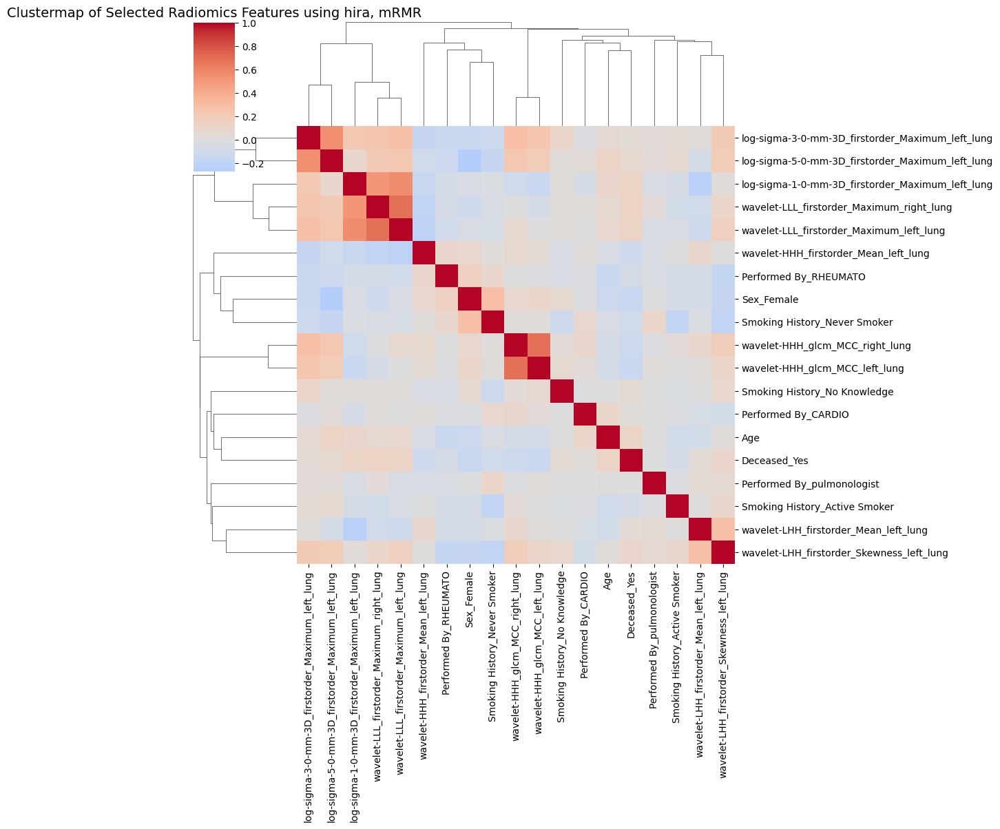

In [ ]:
# Calculate VIF form the mRMR
X_selected_hira = X_selected_hira_mrmr.values
vif_data_hira = pd.DataFrame()
vif_data_hira["feature"] = X_selected_hira_mrmr.columns
vif_data_hira["VIF"] = [variance_inflation_factor(X_selected_hira, i) for i in range(X_selected_hira.shape[1])]

# Keep only features with VIF < 5
low_vif_features_hira = vif_data_hira.loc[vif_data_hira["VIF"] < 10, "feature"].tolist()


print("Selected features (VIF < 10):")
print(low_vif_features_hira)
print(len(low_vif_features_hira))

# If you want the reduced DataFrame:
X_reduced_mRMR_hira = X_selected_hira_mrmr[low_vif_features_hira]
X_reduced_mRMR_hira
corr_selected_mRMR_hira = X_reduced_mRMR_hira.corr(method="spearman")
# Clustermap of selected features
sns.clustermap(corr_selected_mRMR_hira, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features using hira, mRMR", fontsize=14)
plt.show()

In [ ]:

X_hira = X_selected_hira.drop(columns=["Followup FVC Volume L"])   # all radiomics features
y_hira = X_selected_hira["Followup FVC Volume L"]                  # outcome (follow-up FVC)

100%|██████████| 80/80 [00:03<00:00, 24.92it/s]


Selected features (mRMR):
['Baseline FVC Volume L', 'Home Region_Asia-Pacific', 'Followup FVC Predicted %', 'Sex_Female', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung', 'original_shape_MinorAxisLength_right_lung', 'original_shape_MinorAxisLength_left_lung', 'log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_GrayLevelNonUniformity_left_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_left_lung', 'original_firstorder_90Percentile_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'original_shape_SurfaceArea_left_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'log-sigma-3-0-mm-3D_glszm_ZoneVariance_right_lung', 'wavelet-LLL_firstorder_90Percentile_left_lung', 'log-sigma-1-0-mm-3D_ngtdm_Busyness_right_lung', 'original_glszm_SmallAreaHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_glrlm_GrayLevelNonUniformity_right_

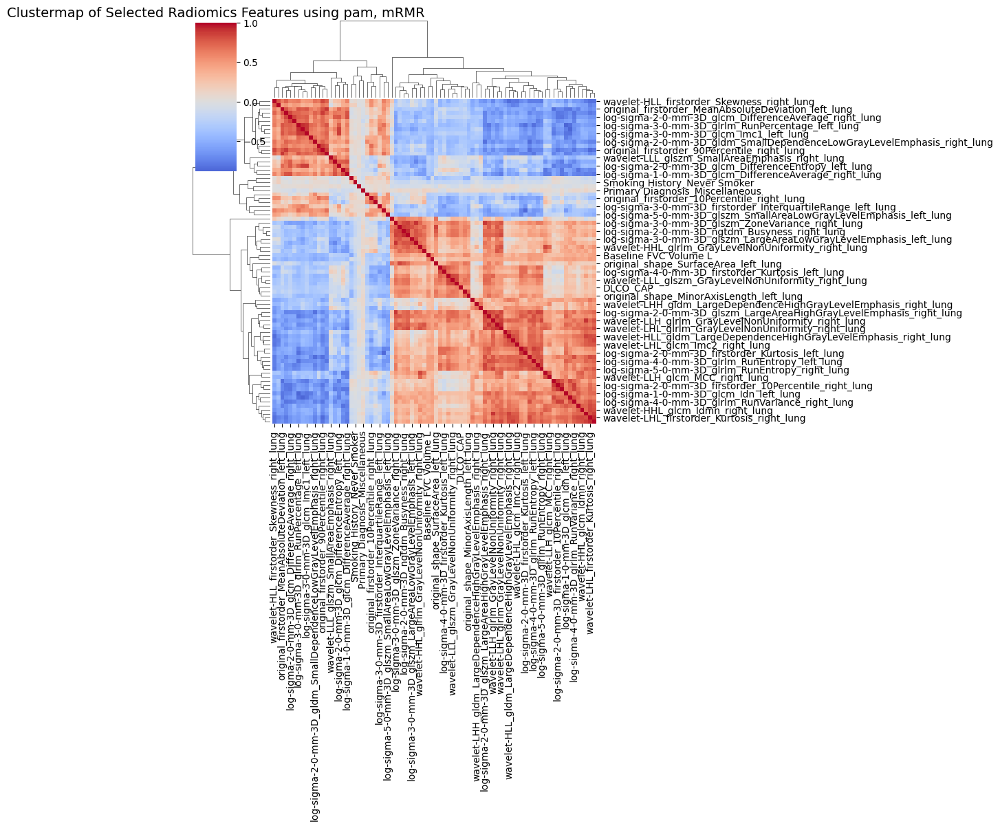

Selected features (VIF < 10):
['Baseline FVC Volume L', 'Home Region_Asia-Pacific', 'Followup FVC Predicted %', 'Sex_Female', 'original_shape_MinorAxisLength_right_lung', 'original_shape_MinorAxisLength_left_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'Smoking History_Never Smoker', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'log-sigma-4-0-mm-3D_firstorder_Kurtosis_right_lung', 'wavelet-HHL_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'DLCO_CAP', 'Primary Diagnosis_Miscellaneous', 'wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-LHL_firstorder_Skewness_right_lung', 'log-sigma-5-0-mm-3D_glszm_SmallAreaLowGrayLevelEmphasis_left_lung', 'wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-LLH_glcm_MCC_right_lung', 'wavelet-LLH_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'wavelet-HLH_glcm_MCC_right_

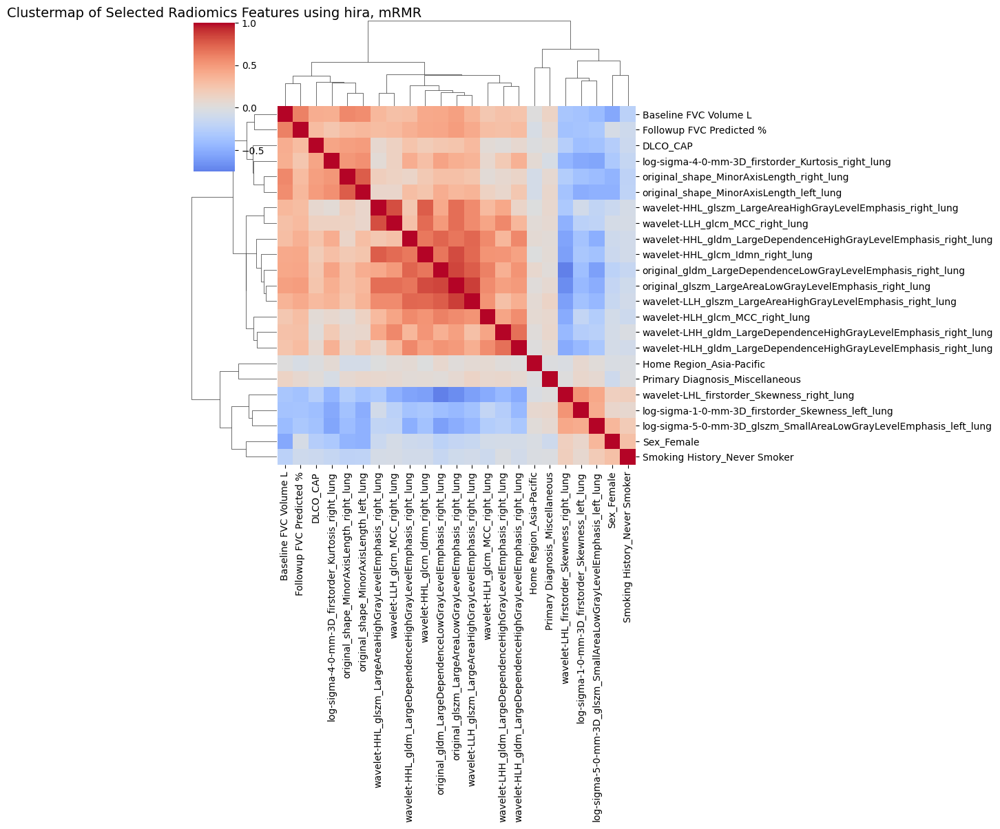

In [ ]:

# used the this after selecting the feature from the each cluster using the followup FVC
from statsmodels.stats.outliers_influence import variance_inflation_factor
import pandas as pd
import numpy as np
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from mrmr import mrmr_regression   # for regression targets
# from mrmr import mrmr_classif    # for classification targets


# -----------------------------
# mRMR Feature Selection
# -----------------------------
def run_mrmr(X, y, n_features=50):
    """
    Run mRMR regression to select top n_features.
    """
    selected_features = mrmr_regression(
        X=X,
        y=y,
        K=n_features  # number of features to select
    )
    return selected_features


# Select top 100 features with mRMR
selected_features = run_mrmr(X_hira, y_hira, n_features=80)

print("Selected features (mRMR):")
print(selected_features)
print(len(selected_features))

# Reduced dataset
X_mrmr = X_selected_hira[selected_features]
corr_selected = X_mrmr.corr(method="spearman")

# Clustermap of selected features
sns.clustermap(corr_selected, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features using pam, mRMR", fontsize=14)
plt.show()

# Calculate VIF for each feature
X_selected_hira = X_mrmr.values
vif_data_hira = pd.DataFrame()
vif_data_hira["feature"] = X_mrmr.columns
vif_data_hira["VIF"] = [variance_inflation_factor(X_selected_hira, i) for i in range(X_selected_hira.shape[1])]

# Keep only features with VIF < 5
low_vif_features_hira = vif_data_hira.loc[vif_data_hira["VIF"] < 10, "feature"].tolist()


print("Selected features (VIF < 10):")
print(low_vif_features_hira)
print(len(low_vif_features_hira))

# If you want the reduced DataFrame:
X_reduced_mRMR_hira = X_mrmr[low_vif_features_hira]
X_reduced_mRMR_hira
corr_selected_mRMR_hira = X_reduced_mRMR_hira.corr(method="spearman")
# Clustermap of selected features
sns.clustermap(corr_selected_mRMR_hira, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features using hira, mRMR", fontsize=14)
plt.show()

In [ ]:
#select the feature using the ANOVA

X1_train, X1_test, y1_train, y1_test = train_test_split(X_hira, y_hira, test_size=0.3, random_state=42)

selector = SelectKBest(score_func=f_regression, k=150)  
X_train_selected = selector.fit_transform(X1_train, y1_train)
X_test_selected = selector.transform(X1_test)

selected_features_hira = X_hira.columns[selector.get_support()]
f_scores = selector.scores_[selector.get_support()]
print(f"Selected Features: {selected_features_hira}")
print(f"F-Scores: {f_scores}")
selected_features_hira = X_selected_hira[selected_features_hira]
selected_features_hira

Selected Features: Index(['original_shape_SurfaceVolumeRatio_right_lung',
       'original_shape_Maximum2DDiameterColumn_right_lung',
       'original_shape_Maximum2DDiameterRow_left_lung',
       'original_shape_Maximum2DDiameterSlice_right_lung',
       'log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung',
       'original_shape_MinorAxisLength_right_lung',
       'original_shape_SurfaceArea_left_lung',
       'original_firstorder_10Percentile_right_lung',
       'original_firstorder_90Percentile_right_lung',
       'log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
       ...
       'log-sigma-5-0-mm-3D_glszm_SmallAreaLowGrayLevelEmphasis_left_lung',
       'Baseline FVC Volume L', 'Followup FVC Predicted %', 'DLCO_CAP',
       'Primary Diagnosis_Miscellaneous', 'Primary Diagnosis_Sarcoidosis',
       'Sex_Female', 'Home Region_North America',
       'Smoking History_Active Smoker', 'Smoking History_Never Smoker'],
      dtype='object', length=150)
F-Scores: [   7.1

,original_shape_SurfaceVolumeRatio_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_left_lung,original_shape_Maximum2DDiameterSlice_right_lung,log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung,original_shape_MinorAxisLength_right_lung,original_shape_SurfaceArea_left_lung,original_firstorder_10Percentile_right_lung,original_firstorder_90Percentile_right_lung,log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung,...,log-sigma-5-0-mm-3D_glszm_SmallAreaLowGrayLevelEmphasis_left_lung,Baseline FVC Volume L,Followup FVC Predicted %,DLCO_CAP,Primary Diagnosis_Miscellaneous,Primary Diagnosis_Sarcoidosis,Sex_Female,Home Region_North America,Smoking History_Active Smoker,Smoking History_Never Smoker
0,-0.112554,0.845200,-0.381036,1.444095,-0.072720,0.139028,0.159232,0.277037,-0.120242,-0.402536,...,-0.508277,0.051535,0.883300,-0.517490,-0.118783,-0.093659,1.081578,0.970859,-0.199457,-0.883281
1,-0.230238,-0.524401,-0.241985,-0.790867,-0.093703,-0.847983,-0.611788,-0.068526,-0.311659,-0.177149,...,-0.340008,-0.243786,1.945238,-0.448600,-0.118783,-0.093659,1.081578,-1.030015,-0.199457,1.132142
2,-0.190292,-0.731302,-0.218231,-0.666978,-0.076995,-0.240761,-0.666231,0.096028,-0.381265,-0.487685,...,0.113075,-0.078406,-0.310246,-0.227819,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
3,-0.132889,-0.424763,0.090114,-0.707109,-0.059555,0.484711,-0.479962,-0.595099,0.111778,-0.451400,...,-0.145896,1.398197,0.580602,-0.328527,-0.118783,-0.093659,-0.924575,0.970859,-0.199457,1.132142
4,-0.227120,-0.627458,-0.204129,-0.725223,-0.105058,-0.790788,-0.623522,-0.265991,-1.332549,0.027879,...,-0.333090,-0.231973,0.089116,-0.171378,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,-0.227505,-0.194877,-0.257599,0.225475,-0.149123,1.053219,-0.014467,0.392225,-0.265255,0.823253,...,-0.334090,0.098786,0.397713,0.656966,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
571,-0.131781,1.759514,-0.219411,2.502337,-0.142196,1.943101,0.532303,0.211216,-0.572682,-0.093565,...,0.160021,0.500422,0.824304,-0.067315,-0.118783,-0.093659,1.081578,0.970859,-0.199457,1.132142
572,-0.258726,-0.220294,-0.328830,0.003598,-0.165205,1.699178,0.125862,-0.990028,-0.259454,0.137820,...,-0.423245,0.193289,-0.736836,1.432190,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
573,-0.142309,-0.306925,-0.574468,0.403607,-0.028733,0.202045,-0.604081,0.721333,0.894848,-0.707460,...,0.073361,-0.680860,0.424942,-0.551392,-0.118783,-0.093659,1.081578,0.970859,-0.199457,-0.883281


In [ ]:
# Calculate VIF for each feature
X_selected_hira = selected_features_hira.values
vif_data = pd.DataFrame()
vif_data["feature"] = selected_features_hira.columns
vif_data["VIF"] = [variance_inflation_factor(X_selected_hira, i) for i in range(X_selected_hira.shape[1])]

# Keep only features with VIF < 5
low_vif_features = vif_data[vif_data["VIF"] < 10]["feature"].tolist()

print("Selected features (VIF < 10):")
print(low_vif_features)

# If you want the reduced DataFrame:
X_reduced_hira = selected_features_hira[low_vif_features]
X_reduced_hira

Selected features (VIF < 10):
['original_shape_MinorAxisLength_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-LLH_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LHH_firstorder_Kurtosis_right_lung', 'wavelet-LHH_firstorder_Skewness_right_lung', 'wavelet-LHH_glcm_MCC_right_lung', 'wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-HLH_glcm_MCC_right_lung', 'wavelet-HLH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-HHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-LLL_gldm_SmallDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-5-0-mm-3D_firstorder_Maximum_right_lung', 'wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-HLH_glcm_MCC_left_lung', 'wavelet-HLH_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LLL_

,original_shape_MinorAxisLength_right_lung,original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung,original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung,wavelet-LLH_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung,wavelet-LHH_firstorder_Kurtosis_right_lung,wavelet-LHH_firstorder_Skewness_right_lung,wavelet-LHH_glcm_MCC_right_lung,wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung,wavelet-HLH_glcm_MCC_right_lung,wavelet-HLH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung,...,log-sigma-5-0-mm-3D_firstorder_Maximum_left_lung,Baseline FVC Volume L,Followup FVC Predicted %,DLCO_CAP,Primary Diagnosis_Miscellaneous,Primary Diagnosis_Sarcoidosis,Sex_Female,Home Region_North America,Smoking History_Active Smoker,Smoking History_Never Smoker
0,0.139028,-0.350444,-0.513629,1.172696,-0.233169,0.478984,0.362574,-0.170487,-0.644620,-0.145162,...,-0.128051,0.051535,0.883300,-0.517490,-0.118783,-0.093659,1.081578,0.970859,-0.199457,-0.883281
1,-0.847983,0.008279,0.124148,1.511637,0.499806,0.463269,0.892916,0.911395,2.385861,2.097253,...,0.736095,-0.243786,1.945238,-0.448600,-0.118783,-0.093659,1.081578,-1.030015,-0.199457,1.132142
2,-0.240761,-0.116132,0.026441,-0.133125,0.153141,0.929816,0.855189,0.845961,0.832050,-0.160664,...,1.592076,-0.078406,-0.310246,-0.227819,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
3,0.484711,-0.419840,-0.505177,-0.553499,-0.445939,-0.065535,0.934868,-0.224668,-0.260390,-0.150098,...,0.313339,1.398197,0.580602,-0.328527,-0.118783,-0.093659,-0.924575,0.970859,-0.199457,1.132142
4,-0.790788,0.456867,0.347954,0.323484,0.421204,0.653051,0.836818,0.601125,0.653998,0.267170,...,0.028979,-0.231973,0.089116,-0.171378,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,1.053219,-0.116334,-0.260980,0.641228,0.419691,2.849638,2.584065,3.564583,1.135636,0.866131,...,0.196038,0.098786,0.397713,0.656966,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
571,1.943101,-0.314919,-0.537172,0.310259,-0.248284,0.437000,1.446328,0.578024,0.318027,-0.668050,...,-0.376988,0.500422,0.824304,-0.067315,-0.118783,-0.093659,1.081578,0.970859,-0.199457,1.132142
572,1.699178,-0.279958,-0.134540,-0.321592,-0.142980,0.141482,-0.181194,0.185866,-0.276970,0.434094,...,1.031669,0.193289,-0.736836,1.432190,-0.118783,-0.093659,-0.924575,-1.030015,-0.199457,-0.883281
573,0.202045,-0.414754,-0.657706,0.491425,-0.356806,0.211249,0.014553,-0.275552,-0.829541,-0.219381,...,-0.898293,-0.680860,0.424942,-0.551392,-0.118783,-0.093659,1.081578,0.970859,-0.199457,-0.883281


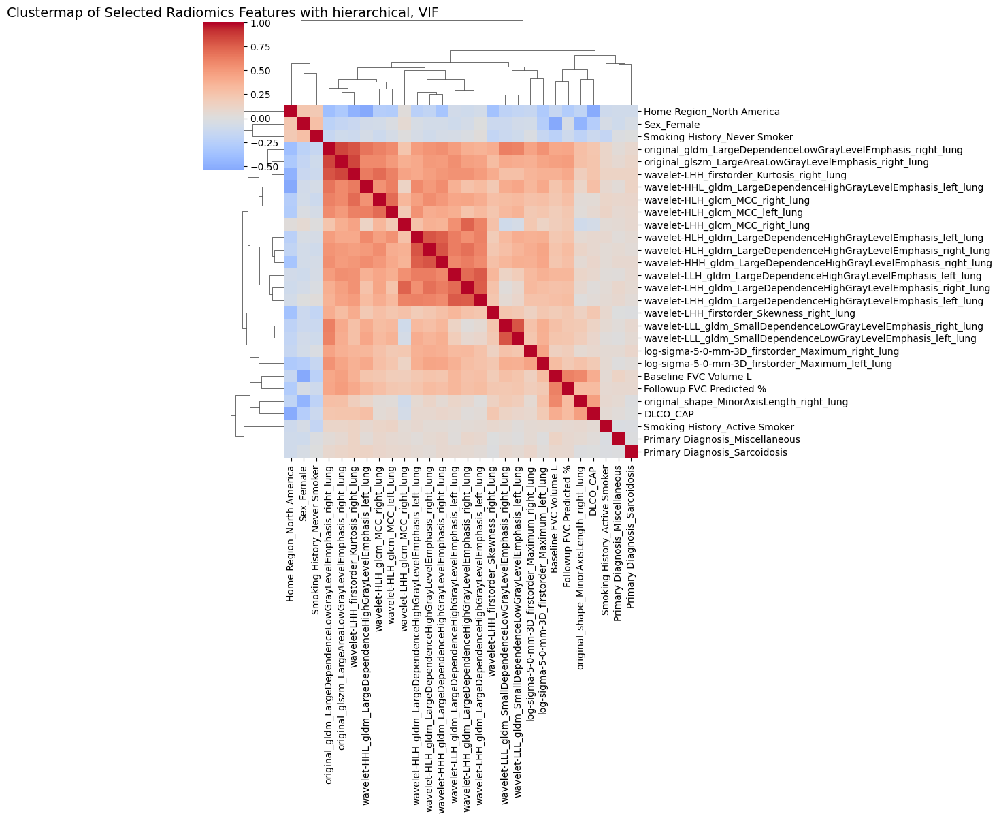

In [ ]:
corr_selected = X_reduced_hira.corr(method="spearman")

# Clustermap of selected features
sns.clustermap(corr_selected, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features with hierarchical, VIF", fontsize=14)
plt.show()

### Clustering based Features selection

In [ ]:
# import pandas as pd
# import numpy as np
# from sklearn.preprocessing import StandardScaler
# from sklearn.decomposition import KernelPCA
# from sklearn.cluster import KMeans
# from sklearn.metrics import silhouette_score
# import matplotlib.pyplot as plt

# # -----------------------------------
# # 1. Prepare data (features as rows)
# # -----------------------------------
# X_features = X_var.T   # rows = features, cols = patients

# # Standardize
# scaler = StandardScaler()
# X_scaled = scaler.fit_transform(X_features)

# # -----------------------------------
# # 2. Search over n_components and k
# # -----------------------------------
# n_components_list = [5, 10, 20, 30, 50, 100]
# k_range = range(2, 11)   # test k from 2 to 10

# results = []

# for n in n_components_list:
#     kpca = KernelPCA(n_components=n, kernel='rbf', random_state=42)
#     X_pca = kpca.fit_transform(X_scaled)
    
#     for k in k_range:
#         kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
#         labels = kmeans.fit_predict(X_pca)
#         score = silhouette_score(X_pca, labels)
#         results.append((n, k, score))
#         print(f"n_components={n}, k={k}, silhouette={score:.3f}")

# # -----------------------------------
# # 3. Find best combination
# # -----------------------------------
# results_df = pd.DataFrame(results, columns=["n_components", "k", "silhouette"])
# best_row = results_df.loc[results_df["silhouette"].idxmax()]

# print("\nBest configuration:")
# print(best_row)

# # -----------------------------------
# # 4. Optional: visualize results
# # -----------------------------------
# pivot = results_df.pivot("n_components", "k", "silhouette")
# plt.figure(figsize=(8,6))
# sns.heatmap(pivot, annot=True, fmt=".3f", cmap="viridis")
# plt.title("Silhouette Score for different n_components and k")
# plt.ylabel("n_components")
# plt.xlabel("k (clusters)")
# plt.show()



Original shape: (2679, 575)
Reduced shape: (2679, 5)


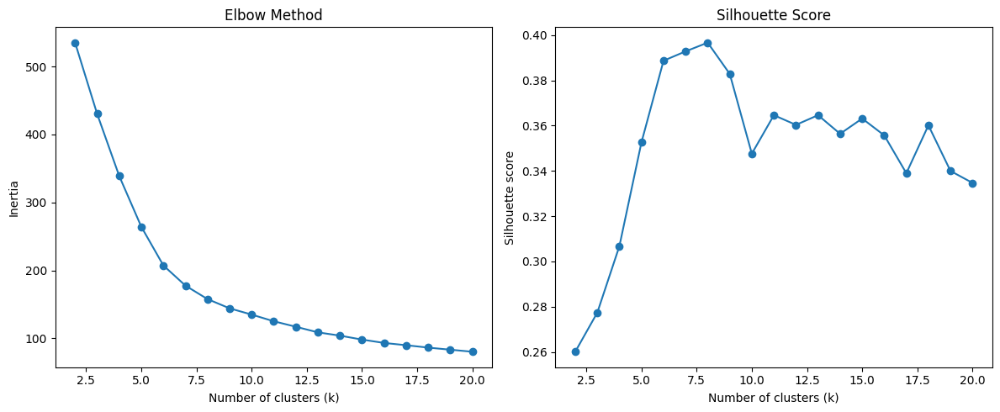

6
Best k based on silhouette: 8
                                             Feature  Cluster
0               original_shape_Elongation_right_lung        1
1                 original_shape_Flatness_right_lung        1
2          original_shape_LeastAxisLength_right_lung        1
3          original_shape_MajorAxisLength_right_lung        2
4  original_shape_Maximum2DDiameterColumn_right_lung        2
Number of clusters: 8
Selected features: ['Baseline FVC Volume L', 'Sex_Female', 'log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung', 'wavelet-LHH_ngtdm_Contrast_right_lung', 'log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_firstorder_90Percentile_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LHL_ngtdm_Strength_right_lung']


['log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung',
 'original_shape_SurfaceArea_right_lung',
 'original_firstorder_Range_right_lung',
 'wavelet-LLH_firstorder_Kurtosis_left_lung',
 'wavelet-HHH_firstorder_Mean_left_lung',
 'wavelet-LHH_firstorder_Skewness_right_lung']

In [ ]:
#K-means Clustering

import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA, KernelPCA
from sklearn.cluster import KMeans
# -----------------------------
# 1. Prepare data (transpose so features are samples)
# -----------------------------
X_features = X_var.T   # rows = features, cols = patients

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_features)
pca = KernelPCA(n_components=5, random_state=42, kernel = 'rbf')
X_pca = pca.fit_transform(X_scaled)
print("Original shape:", X_scaled.shape)
print("Reduced shape:", X_pca.shape)
# -----------------------------
# 2. Evaluate different k values
# -----------------------------
inertias = []
silhouette_scores = []
K_range = range(2, 21)  # test k from 2 to 20

for k in K_range:
    kmeans = KMeans(n_clusters=k, random_state=42, n_init=10)
    labels = kmeans.fit_predict(X_pca)
    inertias.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(X_pca, labels))

# -----------------------------
# 3. Plot elbow and silhouette
# -----------------------------
fig, ax = plt.subplots(1, 2, figsize=(12, 5))

# Elbow plot
ax[0].plot(K_range, inertias, marker='o')
ax[0].set_title("Elbow Method")
ax[0].set_xlabel("Number of clusters (k)")
ax[0].set_ylabel("Inertia")

# Silhouette plot
ax[1].plot(K_range, silhouette_scores, marker='o')
ax[1].set_title("Silhouette Score")
ax[1].set_xlabel("Number of clusters (k)")
ax[1].set_ylabel("Silhouette score")

plt.tight_layout()
plt.show()

# -----------------------------
# 4. Choose best k (example: max silhouette)
# -----------------------------
print(np.argmax(silhouette_scores))
best_k = K_range[np.argmax(silhouette_scores)]
print("Best k based on silhouette:", best_k)

# -----------------------------
# 5. Final clustering with best k
# -----------------------------
kmeans_final = KMeans(n_clusters=best_k, random_state=42, n_init=10)
final_labels = kmeans_final.fit_predict(X_pca)

# Assign cluster labels to features
clusters = pd.DataFrame({
    "Feature": X_var.columns,
    "Cluster": final_labels
})

print(clusters.head())


# Compute Spearman correlation of each feature with target y
spearman_corr = X_var.apply(lambda col: col.corr(y, method="spearman"))

selected_features = []
for cluster_id in clusters["Cluster"].unique():
    cluster_feats = clusters.loc[clusters["Cluster"] == cluster_id, "Feature"]
    # pick feature with strongest absolute correlation to y
    best_feat = spearman_corr.loc[cluster_feats].abs().idxmax()
    selected_features.append(best_feat)

# Final reduced dataset
X_selected = X_var[selected_features]

print("Number of clusters:", clusters["Cluster"].nunique())
print("Selected features:", selected_features)
['log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_firstorder_Range_right_lung', 'wavelet-LLH_firstorder_Kurtosis_left_lung', 'wavelet-HHH_firstorder_Mean_left_lung', 'wavelet-LHH_firstorder_Skewness_right_lung']

In [ ]:
# import matplotlib.pyplot as plt

# # Scatter plot of clusters using first two KernelPCA components
# plt.figure(figsize=(8,6))
# scatter = plt.scatter(
#     X_pca[:, 0], X_pca[:, 1],
#     c=final_labels, cmap="tab10", s=60, alpha=0.8, edgecolor="k"
# )

# plt.xlabel("KernelPCA Component 1")
# plt.ylabel("KernelPCA Component 2")
# plt.title(f"K-means Clusters (k={best_k}) on KernelPCA-reduced Features")
# plt.legend(*scatter.legend_elements(), title="Cluster")
# plt.show()


In [ ]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
X = X_selected.values
vif_data = pd.DataFrame()
vif_data["feature"] = X_selected.columns
vif_data["VIF"] = [variance_inflation_factor(X, i) for i in range(X.shape[1])]

# Keep only features with VIF < 5
low_vif_features = vif_data[vif_data["VIF"] < 5]["feature"].tolist()

print("Selected features (VIF < 5):")
print(low_vif_features)

# If you want the reduced DataFrame:
X_reduced = X_selected[low_vif_features]
X_reduced

Selected features (VIF < 5):
['Baseline FVC Volume L', 'Sex_Female', 'log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung', 'wavelet-LHH_ngtdm_Contrast_right_lung', 'log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_firstorder_90Percentile_right_lung', 'wavelet-LHL_ngtdm_Strength_right_lung']


,Baseline FVC Volume L,Sex_Female,log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung,wavelet-LHH_ngtdm_Contrast_right_lung,log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung,original_firstorder_90Percentile_right_lung,wavelet-LHL_ngtdm_Strength_right_lung
0,0.051535,1.081578,-0.072720,-0.015593,-0.402536,-0.120242,-0.344389
1,-0.243786,1.081578,-0.093703,-0.893679,-0.177149,-0.311659,-0.290356
2,-0.078406,-0.924575,-0.076995,-0.883235,-0.487685,-0.381265,-0.386745
3,1.398197,-0.924575,-0.059555,-0.019939,-0.451400,0.111778,0.558312
4,-0.231973,-0.924575,-0.105058,-0.895900,0.027879,-1.332549,-0.446157
...,...,...,...,...,...,...,...
570,0.098786,-0.924575,-0.149123,-0.932116,0.823253,-0.265255,-0.595586
571,0.500422,1.081578,-0.142196,0.160382,-0.093565,-0.572682,-0.289573
572,0.193289,-0.924575,-0.165205,0.033963,0.137820,-0.259454,0.052905
573,-0.680860,1.081578,-0.028733,0.301252,-0.707460,0.894848,0.436519


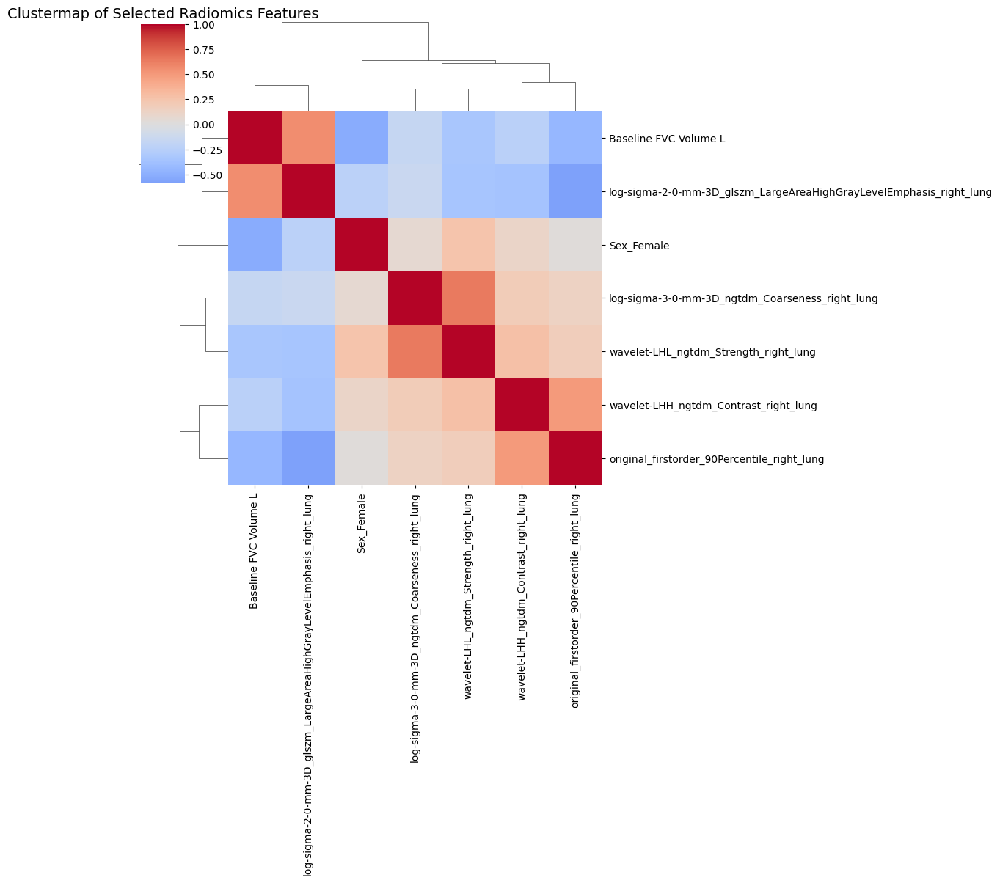

In [ ]:
corr_selected = X_reduced.corr()

# Clustermap of selected features
sns.clustermap(corr_selected, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features", fontsize=14)
plt.show()

In [ ]:
# import pandas as pd
# import numpy as np
# from scipy.cluster.hierarchy import linkage, fcluster
# from scipy.spatial.distance import squareform
# import seaborn as sns
# import matplotlib.pyplot as plt

# # -----------------------------
# # 1. Compute absolute correlation matrix
# # -----------------------------
# corr = X_var.corr().abs()

# # Clean correlation matrix
# corr = corr.fillna(0)        # replace NaNs with 0
# corr = corr.clip(0, 1)       # clip to [0,1] to avoid floating-point issues
# print(corr[['original_shape_Flatness_left_lung']])
# # -----------------------------
# # 2. Convert to distance matrix
# # -----------------------------
# dist_condensed = squareform(1 - corr.values, checks=False)


# # -----------------------------
# # 3. Hierarchical clustering
# # -----------------------------
# linkage_matrix = linkage(dist_condensed, method='average')
# # Cut dendrogram at distance threshold (0.8 = features with corr >= 0.2 grouped)
# cluster_labels = fcluster(linkage_matrix, t=0.2, criterion='distance')

# # Assign cluster IDs to features
# clusters = pd.DataFrame({
#     "Feature": X_var.columns,
#     "Cluster": cluster_labels
# })
# print(clusters.to_dict())
# # -----------------------------
# # 4. Pick representative feature per cluster
# # -----------------------------
# # Compute Spearman correlation of each feature with target y
# spearman_corr = X_var.apply(lambda col: col.corr(y, method="spearman"))

# selected_features = []
# for cluster_id in clusters["Cluster"].unique():
#     cluster_feats = clusters.loc[clusters["Cluster"] == cluster_id, "Feature"]
#     # pick feature with strongest absolute correlation to y
#     best_feat = spearman_corr.loc[cluster_feats].abs().idxmax()
#     selected_features.append(best_feat)

# # Final reduced dataset
# X_selected_hira = X_var[selected_features]

# print("Number of clusters:", clusters["Cluster"].nunique())
# print("Selected features:", selected_features)
# # -----------------------------
# # 5. Optional: visualize clustering
# # -----------------------------
# # sns.clustermap(corr, cmap="coolwarm", center=0, figsize=(12, 12))
# # plt.title("Radiomics Feature Clustering", fontsize=14)
# # plt.show()
# X_selected_hira


In [ ]:
# import pandas as pd
# from statsmodels.stats.outliers_influence import variance_inflation_factor

# # Calculate VIF for each feature
# X = X_selected_hira.values
# vif_data = pd.DataFrame()
# vif_data["feature"] = X_selected_hira.columns
# vif_data["VIF"] = [variance_inflation_factor(X, i) for i in range(X.shape[1])]

# # Keep only features with VIF < 5
# low_vif_features = vif_data[vif_data["VIF"] < 5]["feature"].tolist()

# print("Selected features (VIF < 5):")
# print(low_vif_features)

# # If you want the reduced DataFrame:
# X_reduced = X_selected_hira[low_vif_features]
# X_reduced

/home/pansurya/.venv/lib64/python3.9/site-packages/statsmodels/stats/outliers_influence.py:197: RuntimeWarning: divide by zero encountered in scalar divide
  vif = 1. / (1. - r_squared_i)


Selected features (VIF < 5):
['Performed By_CARDIO', 'Performed By_RHEUMATO', 'Performed By_pulmonologist', 'Smoking History_Active Smoker', 'Smoking History_Never Smoker', 'Smoking History_No Knowledge', 'Deceased_No']


,Performed By_CARDIO,Performed By_RHEUMATO,Performed By_pulmonologist,Smoking History_Active Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge,Deceased_No
0,-0.072421,3.205388,-0.093659,-0.199457,-0.883281,-0.133038,0.548548
1,-0.072421,-0.311975,-0.093659,-0.199457,1.132142,-0.133038,0.548548
2,-0.072421,-0.311975,-0.093659,-0.199457,-0.883281,-0.133038,0.548548
3,-0.072421,-0.311975,-0.093659,-0.199457,1.132142,-0.133038,0.548548
4,-0.072421,-0.311975,-0.093659,-0.199457,-0.883281,-0.133038,0.548548
...,...,...,...,...,...,...,...
570,-0.072421,-0.311975,-0.093659,-0.199457,-0.883281,-0.133038,0.548548
571,-0.072421,-0.311975,-0.093659,-0.199457,1.132142,-0.133038,0.548548
572,-0.072421,-0.311975,-0.093659,-0.199457,-0.883281,-0.133038,0.548548
573,-0.072421,-0.311975,-0.093659,-0.199457,-0.883281,-0.133038,0.548548


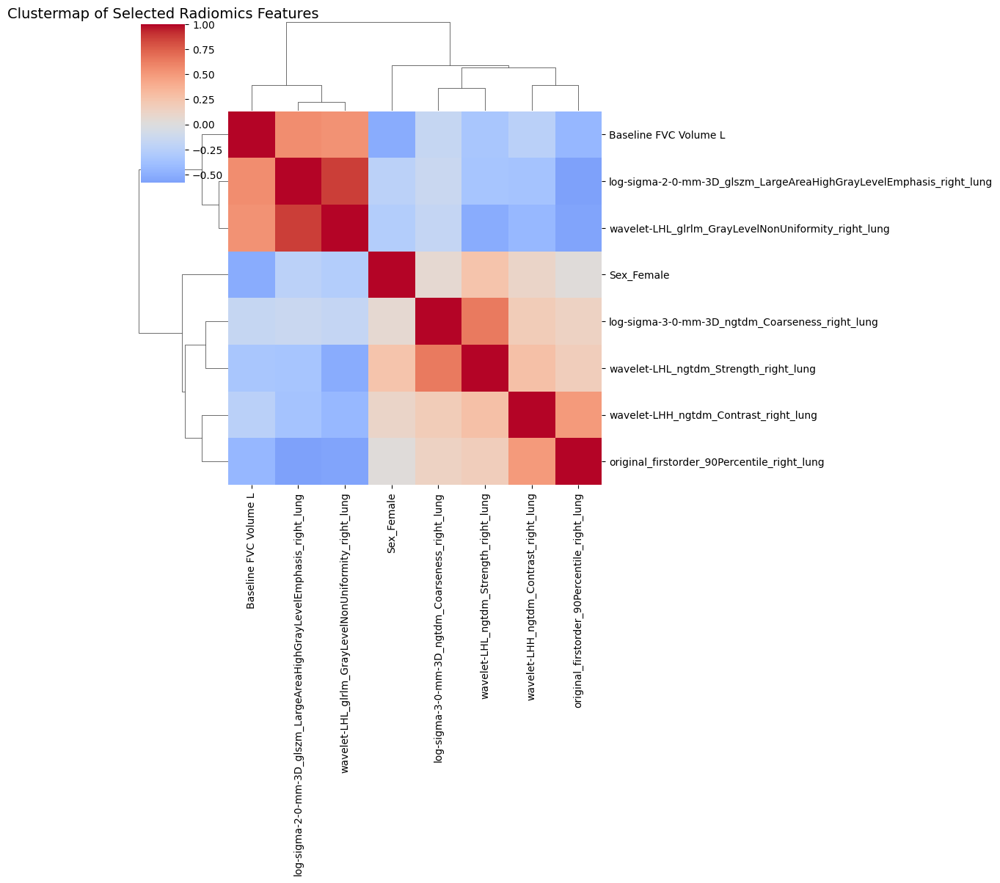

,Baseline FVC Volume L,Sex_Female,log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung,wavelet-LHH_ngtdm_Contrast_right_lung,log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung,original_firstorder_90Percentile_right_lung,wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung,wavelet-LHL_ngtdm_Strength_right_lung
Baseline FVC Volume L,1.000000,-0.518145,-0.162943,-0.238958,0.557371,-0.445884,0.536231,-0.334674
Sex_Female,-0.518145,1.000000,0.068706,0.111513,-0.234584,0.023155,-0.274617,0.257818
log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung,-0.162943,0.068706,1.000000,0.191936,-0.147365,0.135327,-0.176900,0.645004
wavelet-LHH_ngtdm_Contrast_right_lung,-0.238958,0.111513,0.191936,1.000000,-0.360004,0.493662,-0.436331,0.279832
log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung,0.557371,-0.234584,-0.147365,-0.360004,1.000000,-0.581663,0.865055,-0.345651
original_firstorder_90Percentile_right_lung,-0.445884,0.023155,0.135327,0.493662,-0.581663,1.000000,-0.559561,0.173065
wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung,0.536231,-0.274617,-0.176900,-0.436331,0.865055,-0.559561,1.000000,-0.515032
wavelet-LHL_ngtdm_Strength_right_lung,-0.334674,0.257818,0.645004,0.279832,-0.345651,0.173065,-0.515032,1.000000


In [ ]:
# Correlation matrix of selected features
corr_selected = X_selected.corr()

# Clustermap of selected features
sns.clustermap(corr_selected, cmap="coolwarm", center=0, figsize=(12, 12))
plt.title("Clustermap of Selected Radiomics Features", fontsize=14)
plt.show()
corr_selected

### Correlation based Features selection

In [ ]:
# # Sort by absolute correlation and keep top 50
# top_corr = selected_features
# corr_df = selected_features.loc[top_corr.index].to_frame(name="Spearman Correlation")

# plt.figure(figsize=(6, len(corr_df) * 0.3))
# sns.heatmap(
#     corr_df,
#     annot=True, fmt=".2f",
#     cmap="coolwarm", center=0,
#     cbar_kws={"label": "Spearman correlation with FVC"}
# )
# plt.title("Top 50 Radiomics Features vs FVC (Spearman Correlation)", fontsize=14)
# plt.ylabel("Feature")
# plt.xlabel("Correlation")
# plt.tight_layout()
# plt.show()

### Calculate the Correlation matrix with all radiomics features with Follow-up FVC 

In [ ]:
import numpy as np
spearman_corr_features_FVC = X_var.apply(lambda col: col.corr(y, method="spearman"))
spearman_corr_features_FVC = spearman_corr_features_FVC.fillna(0)  
selected = spearman_corr_features_FVC[abs(spearman_corr_features_FVC) > 0]  # threshold
X_corr = X_var[selected.index]

print("Kept after Spearman filter:", len(selected))

# Sort by correlation values (descending)
selected_sorted = selected.sort_values(ascending=False)
selected_dict = selected_sorted.to_dict()

print(selected_dict)

selected


Kept after Spearman filter: 2679
{'Baseline FVC Volume L': 0.8960733537329236, 'FEV1 Volume L': 0.8377720340123048, 'Followup FVC Predicted %': 0.7344991559297565, 'Baseline FVC Predicted %': 0.6189967494654804, 'log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung': 0.5715036152692957, 'log-sigma-2-0-mm-3D_gldm_GrayLevelNonUniformity_right_lung': 0.5663055931973695, 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung': 0.5657537120712358, 'log-sigma-3-0-mm-3D_gldm_GrayLevelNonUniformity_right_lung': 0.5650533349655495, 'wavelet-LHL_glrlm_GrayLevelNonUniformity_left_lung': 0.5644787612550805, 'original_glrlm_GrayLevelNonUniformity_right_lung': 0.5632265661458873, 'log-sigma-1-0-mm-3D_gldm_GrayLevelNonUniformity_right_lung': 0.5616307945790087, 'original_shape_MinorAxisLength_right_lung': 0.5601602267423925, 'original_shape_MinorAxisLength_left_lung': 0.5599313756589203, 'log-sigma-4-0-mm-3D_gldm_GrayLevelNonUniformity_right_lung': 0.5590426090735421, 'log-sigma-5-0-mm-3

original_shape_Elongation_right_lung                 0.024244
original_shape_Flatness_right_lung                   0.089080
original_shape_LeastAxisLength_right_lung            0.340525
original_shape_MajorAxisLength_right_lung            0.197678
original_shape_Maximum2DDiameterColumn_right_lung    0.252864
                                                       ...   
Smoking History_Ex Smoker                            0.184493
Smoking History_Never Smoker                        -0.225855
Smoking History_No Knowledge                         0.009498
Deceased_No                                          0.098436
Deceased_Yes                                        -0.098436
Length: 2679, dtype: float64

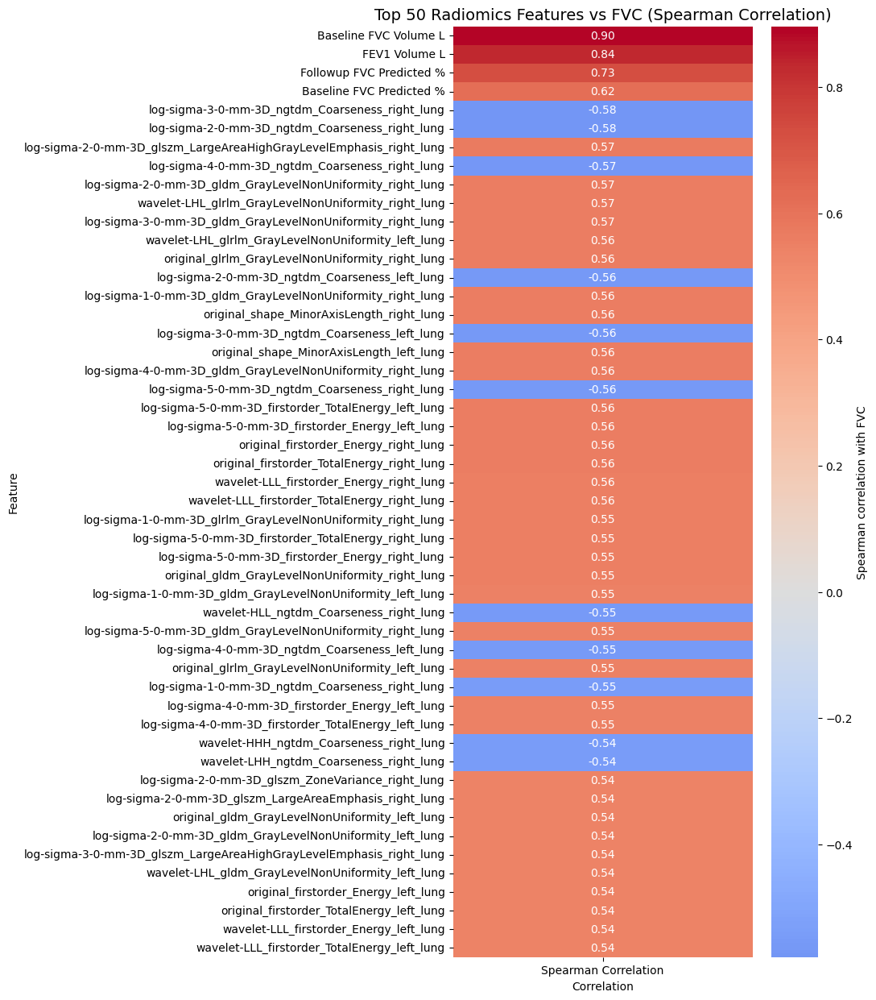

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Sort by absolute correlation and keep top 50
top_corr = spearman_corr_features_FVC.abs().sort_values(ascending=False).head(50)
corr_df = spearman_corr_features_FVC.loc[top_corr.index].to_frame(name="Spearman Correlation")

plt.figure(figsize=(6, len(corr_df) * 0.3))
sns.heatmap(
    corr_df,
    annot=True, fmt=".2f",
    cmap="coolwarm", center=0,
    cbar_kws={"label": "Spearman correlation with FVC"}
)
plt.title("Top 50 Radiomics Features vs FVC (Spearman Correlation)", fontsize=14)
plt.ylabel("Feature")
plt.xlabel("Correlation")
plt.tight_layout()
plt.show()


### corrlation between features and then find another corr between the selected features with Followup FVC

In [ ]:
spearman_corr_between_features = X_var.corr(method="spearman")
spearman_corr_between_features = spearman_corr_between_features.fillna(0)  
# Absolute values
corr_abs = spearman_corr_between_features.abs()

# # Keep only upper triangle (to avoid duplicates)
upper = corr_abs.where(np.triu(np.ones(corr_abs.shape), k=1).astype(bool))

# Drop features with correlation > 0.9
to_drop = [column for column in upper.columns if any(upper[column] > 0.9)]

print("Highly correlated features to drop:", (to_drop))

# Keep non-redundant features
X_corr_between_features = merged_radiomic_FVC_var.drop(columns=to_drop)
upper


Highly correlated features to drop: ['original_shape_Maximum2DDiameterColumn_right_lung', 'original_shape_Maximum3DDiameter_right_lung', 'original_shape_VoxelVolume_right_lung', 'original_firstorder_Energy_right_lung', 'original_firstorder_Entropy_right_lung', 'original_firstorder_InterquartileRange_right_lung', 'original_firstorder_Kurtosis_right_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'original_firstorder_Mean_right_lung', 'original_firstorder_Median_right_lung', 'original_firstorder_RobustMeanAbsoluteDeviation_right_lung', 'original_firstorder_RootMeanSquared_right_lung', 'original_firstorder_Skewness_right_lung', 'original_firstorder_TotalEnergy_right_lung', 'original_firstorder_Uniformity_right_lung', 'original_firstorder_Variance_right_lung', 'original_glcm_Autocorrelation_right_lung', 'original_glcm_ClusterShade_right_lung', 'original_glcm_ClusterTendency_right_lung', 'original_glcm_DifferenceAverage_right_lung', 'original_glcm_DifferenceEntropy_right_lung

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,Performed By_Pulmonogists,Performed By_Pulmonologist,Performed By_RHEUMATO,Performed By_pulmonologist,Smoking History_Active Smoker,Smoking History_Ex Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge,Deceased_No,Deceased_Yes
original_shape_Elongation_right_lung,NaN,0.84495,0.505583,0.879876,0.791324,0.165648,0.570175,0.813840,0.080350,0.093477,...,0.086907,0.237263,0.054432,0.032839,0.023350,0.026426,0.030123,0.020999,0.000124,0.000124
original_shape_Flatness_right_lung,NaN,NaN,0.741970,0.794337,0.694902,0.094186,0.466048,0.727719,0.127453,0.000878,...,0.000099,0.280191,0.089921,0.006432,0.051807,0.002242,0.026617,0.033583,0.013244,0.013244
original_shape_LeastAxisLength_right_lung,NaN,NaN,NaN,0.320976,0.241789,0.365566,0.086742,0.269649,0.668652,0.412873,...,0.288167,0.059230,0.157841,0.035096,0.078352,0.069072,0.125696,0.097942,0.136165,0.136165
original_shape_MajorAxisLength_right_lung,NaN,NaN,NaN,NaN,0.956791,0.038783,0.722579,0.971389,0.371574,0.313233,...,0.159877,0.284227,0.001990,0.003950,0.016522,0.062534,0.074531,0.019476,0.041794,0.041794
original_shape_Maximum2DDiameterColumn_right_lung,NaN,NaN,NaN,NaN,NaN,0.064153,0.681779,0.981518,0.435185,0.364513,...,0.161701,0.227016,0.006228,0.028551,0.036595,0.054151,0.078606,0.037550,0.007951,0.007951
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Smoking History_Ex Smoker,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.894100,0.134668,0.104689,0.104689
Smoking History_Never Smoker,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.117510,0.093837,0.093837
Smoking History_No Knowledge,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.053224,0.053224
Deceased_No,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000


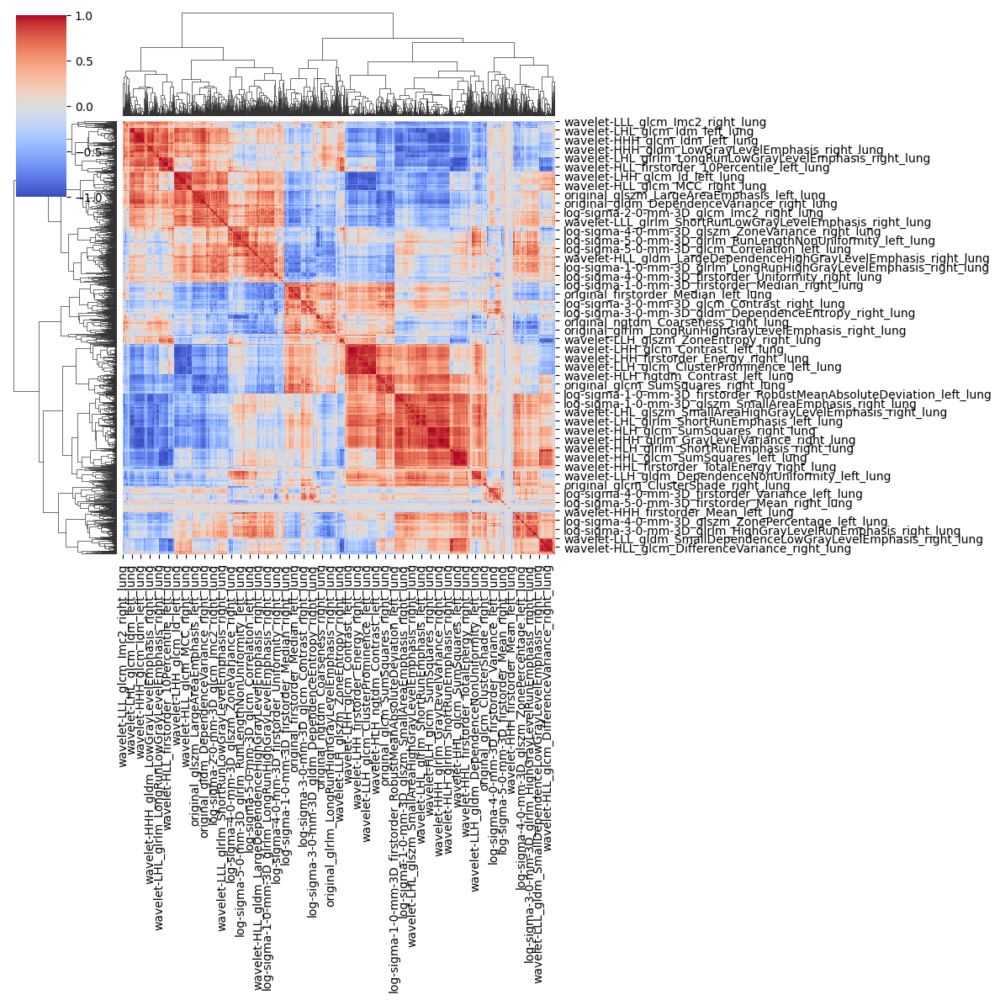

In [ ]:
sns.clustermap(spearman_corr_between_features, cmap="coolwarm", center=0, figsize=(12, 12))


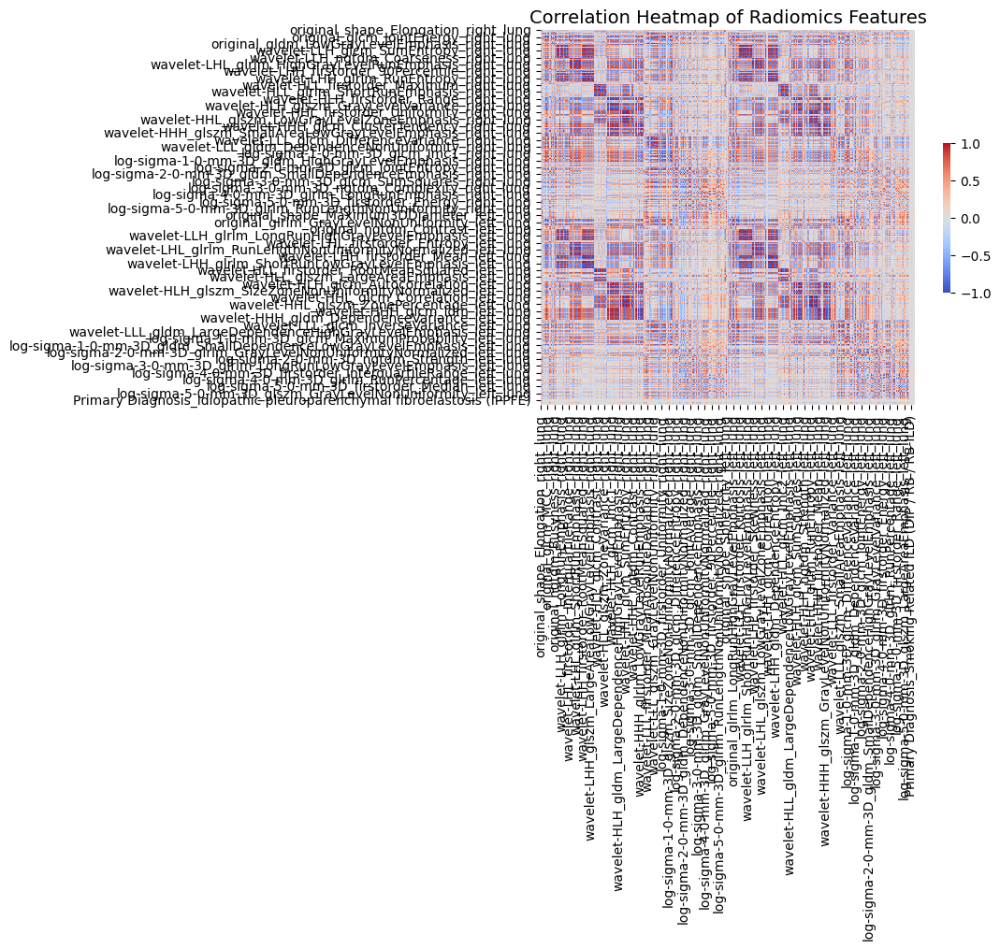

In [ ]:
plt.figure(figsize=(12, 10))
sns.heatmap(
    spearman_corr_between_features,
    cmap="coolwarm",        # color scheme
    center=0,               # center at 0 correlation
    annot=False,            # set True if you want numbers inside cells
    fmt=".2f",
    square=True,
    cbar_kws={"shrink": 0.4}
)
plt.title("Correlation Heatmap of Radiomics Features", fontsize=14)
plt.tight_layout()
plt.show()

In [ ]:
# Separate features and target
X1 = X_corr_between_features.drop(columns=["Followup FVC Volume L"])   # all radiomics features
y1 = X_corr_between_features["Followup FVC Volume L"]                  # outcome (follow-up FVC)
print(y1)
from sklearn.feature_selection import VarianceThreshold

vt = VarianceThreshold(threshold=0.0)  # remove features with 0 variance
X_var1 = pd.DataFrame(vt.fit_transform(X1), columns=X1.columns[vt.get_support()])
X_var1


0      0.096584
1      0.381132
2     -0.279019
3      1.394121
4     -0.039999
         ...   
570   -0.085527
571    0.369750
572    0.016911
573   -0.609094
574   -1.018843
Name: Followup FVC Volume L, Length: 575, dtype: float64


,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,original_shape_Sphericity_right_lung,original_shape_SurfaceArea_right_lung,...,Performed By_PNEUMO,Performed By_Pulmonogists,Performed By_Pulmonologist,Performed By_RHEUMATO,Performed By_pulmonologist,Smoking History_Active Smoker,Smoking History_Ex Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge,Deceased_No
0,-1.320348,-1.502801,-1.443448,1.034794,-0.401933,1.444095,-0.506973,0.139028,-0.616570,-0.124966,...,-0.834365,-0.360092,-0.384324,3.205388,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548
1,0.671568,1.062856,0.534138,-0.753822,-0.309196,-0.790867,-0.372723,-0.847983,0.896716,-0.534790,...,-0.834365,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548
2,0.750247,0.667031,0.313461,-0.656316,0.030225,-0.666978,-0.494801,-0.240761,0.342519,-0.460268,...,-0.834365,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548
3,1.093731,0.301015,-0.065704,-0.635462,-0.044800,-0.707109,-0.593755,0.484711,-0.312738,-0.316059,...,1.198516,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548
4,0.596152,1.055577,0.618253,-0.714704,-0.232590,-0.725223,-0.365196,-0.790788,0.827970,-0.513036,...,-0.834365,-0.360092,2.601974,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.162895,0.008234,0.439575,-0.094818,-0.214151,0.225475,0.538434,1.053219,0.076421,0.272510,...,-0.834365,2.777071,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548
571,-1.178725,-1.522444,-1.292256,1.524401,-0.142599,2.502337,0.281190,1.943101,-0.980809,0.702270,...,1.198516,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,-1.012249,1.132142,-0.133038,0.548548
572,0.918212,0.944474,1.360388,-0.333338,0.003138,0.003598,1.172396,1.699178,0.268515,0.528198,...,-0.834365,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548
573,0.015935,-0.609536,-0.658228,-0.217193,-0.457903,0.403607,-0.682084,0.202045,-0.103313,-0.455229,...,1.198516,-0.360092,-0.384324,-0.311975,-0.093659,-0.199457,0.987899,-0.883281,-0.133038,0.548548


In [ ]:
#ANOVA F-test (for regression)
from sklearn.feature_selection import SelectKBest, f_regression

# Fit selector
selector = SelectKBest(score_func=f_regression, k=8)   # top 10 features
X_new = selector.fit_transform(X1, y1)

# Get boolean mask of selected features
mask = selector.get_support()

# Extract feature names
selected_features = X1.columns[mask]
print("Selected features:", selected_features.tolist())

# If you also want scores:
scores = selector.scores_
for feat, score in zip(X1.columns, scores):
    print(f"{feat}: {score:.3f}")
selected_features

Selected features: ['original_shape_MeshVolume_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'original_shape_MinorAxisLength_left_lung', 'Baseline FVC Volume L', 'Baseline FVC Predicted %', 'Followup FVC Predicted %', 'Sex_Female']
original_shape_Elongation_right_lung: 0.161
original_shape_Flatness_right_lung: 3.993
original_shape_LeastAxisLength_right_lung: 54.436
original_shape_MajorAxisLength_right_lung: 17.199
original_shape_Maximum2DDiameterRow_right_lung: 19.989
original_shape_Maximum2DDiameterSlice_right_lung: 8.235
original_shape_MeshVolume_right_lung: 219.705
original_shape_MinorAxisLength_right_lung: 272.755
original_shape_Sphericity_right_lung: 6.781
original_shape_SurfaceArea_right_lung: 81.510
original_shape_SurfaceVolumeRatio_right_lung: 11.867
original_firstorder_10Percentile_right_lung: 55.101
original_firstorder_90Percentile_right_lung: 143.710
original_firstorder_Maximum_right_lung: 0.088
original_firs

Index(['original_shape_MeshVolume_right_lung',
       'original_shape_MinorAxisLength_right_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung',
       'original_shape_MinorAxisLength_left_lung', 'Baseline FVC Volume L',
       'Baseline FVC Predicted %', 'Followup FVC Predicted %', 'Sex_Female'],
      dtype='object')

In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression
import pandas as pd
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.3, random_state=42)

selector = SelectKBest(score_func=f_regression, k=8)  
X_train_selected = selector.fit_transform(X1_train, y1_train)
X_test_selected = selector.transform(X1_test)

selected_features = X1.columns[selector.get_support()]
f_scores = selector.scores_[selector.get_support()]
print(f"Selected Features: {selected_features}")
print(f"F-Scores: {f_scores}")


Selected Features: Index(['original_shape_MeshVolume_right_lung',
       'original_shape_MinorAxisLength_right_lung',
       'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung',
       'original_shape_MinorAxisLength_left_lung', 'Baseline FVC Volume L',
       'Baseline FVC Predicted %', 'Followup FVC Predicted %', 'Sex_Female'],
      dtype='object')
F-Scores: [ 140.88035705  217.0349754   147.13440996  198.88337463 1784.986524
  217.14607427  406.04919213  143.91297892]


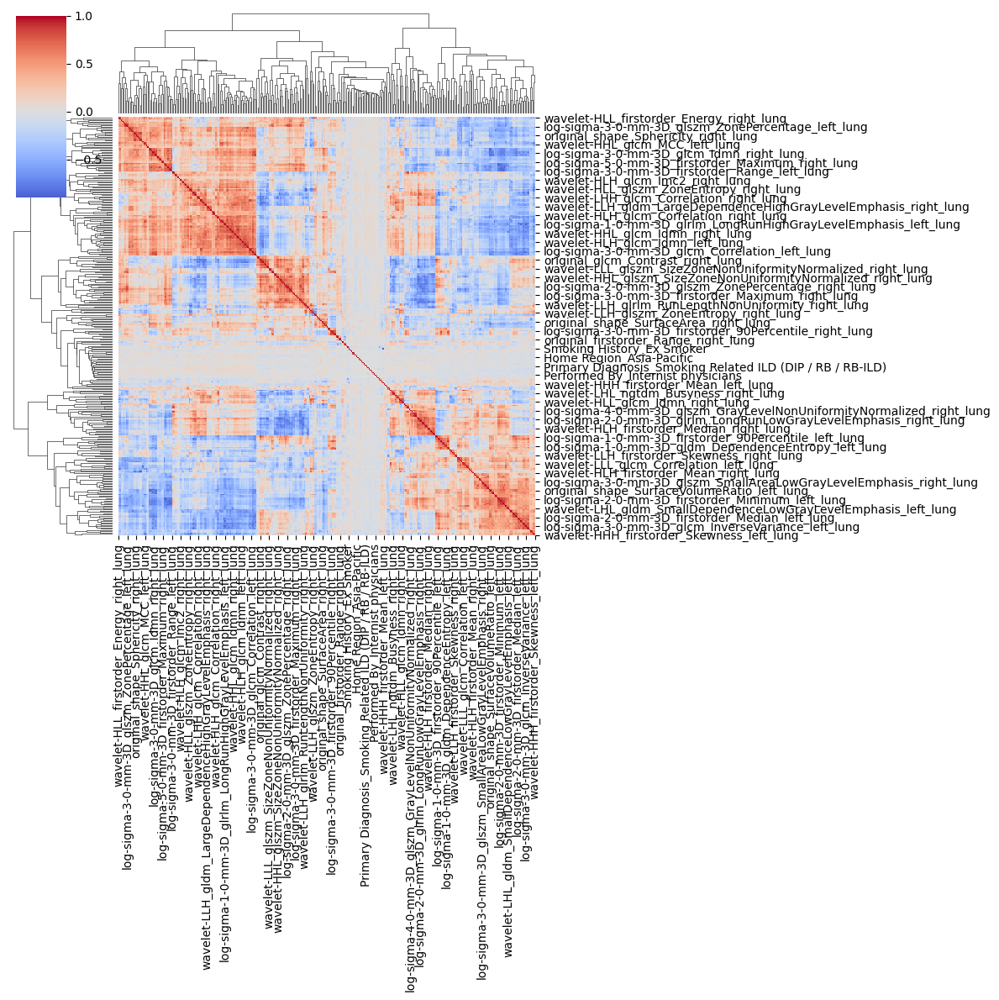

In [ ]:
spearman_corr = X_var1.corr(method="spearman")
sns.clustermap(spearman_corr, cmap="coolwarm", center=0, figsize=(12, 12))

In [ ]:
import numpy as np
spearman_corr_features_FVC1 = X_var1.apply(lambda col: col.corr(y1, method="spearman"))
selected1 = spearman_corr_features_FVC1[abs(spearman_corr_features_FVC1) >= 0.4]  # threshold
X_corr1 = X_var1[selected1.index]

print("Kept after Spearman filter:", len(selected1))

# Sort by correlation values (descending)
selected_sorted1 = selected1.sort_values(ascending=False)
selected_dict1 = selected_sorted1.to_dict()

print(selected_dict1)

X_corr1['Followup FVC Volume L'] = X_corr_between_features["Followup FVC Volume L"]  
X_corr1

Kept after Spearman filter: 31
{'Baseline FVC Volume L': 0.8960733537329236, 'Followup FVC Predicted %': 0.7344991559297565, 'Baseline FVC Predicted %': 0.6189967494654804, 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung': 0.5657537120712358, 'original_shape_MinorAxisLength_right_lung': 0.5601602267423925, 'original_shape_MinorAxisLength_left_lung': 0.5599313756589203, 'original_shape_MeshVolume_right_lung': 0.5410128616186517, 'wavelet-LLH_glrlm_GrayLevelNonUniformity_right_lung': 0.5000943447041871, 'original_shape_SurfaceArea_right_lung': 0.47289489949896185, 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung': 0.44978652642074196, 'log-sigma-3-0-mm-3D_glcm_Idmn_right_lung': 0.4383247829685842, 'log-sigma-2-0-mm-3D_glcm_Idmn_right_lung': 0.4383156933103246, 'wavelet-HLL_glrlm_RunLengthNonUniformity_right_lung': 0.43418314961751, 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_right_lung': 0.43211749321671394, 'wavelet-LHL_ngtdm_Busyness_left_lung': 0.4120930391935535, 

,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,original_shape_SurfaceArea_right_lung,original_shape_SurfaceVolumeRatio_right_lung,original_firstorder_90Percentile_right_lung,original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung,original_ngtdm_Busyness_right_lung,wavelet-LLH_glrlm_GrayLevelNonUniformity_right_lung,wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung,wavelet-LHL_ngtdm_Busyness_right_lung,...,original_firstorder_90Percentile_left_lung,wavelet-LHL_ngtdm_Busyness_left_lung,log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung,log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung,log-sigma-2-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung,Baseline FVC Volume L,Baseline FVC Predicted %,Followup FVC Predicted %,Sex_Female,Followup FVC Volume L
0,-0.506973,0.139028,-0.124966,-0.112554,-0.120242,-0.513629,-0.583464,-0.751751,-0.129158,-0.059095,...,-0.570051,0.059648,0.180706,-0.475036,-0.021895,0.051535,0.940900,0.883300,1.081578,0.096584
1,-0.372723,-0.847983,-0.534790,-0.230238,-0.311659,0.124148,-0.396237,0.159690,0.183933,-0.064175,...,-0.294887,-0.068804,0.220922,0.134776,-0.268820,-0.243786,0.989169,1.945238,1.081578,0.381132
2,-0.494801,-0.240761,-0.460268,-0.190292,-0.381265,0.026441,-0.522021,0.033510,0.030126,-0.027764,...,-0.056411,0.382914,-0.484507,0.358900,0.072635,-0.078406,-0.019657,-0.310246,-0.924575,-0.279019
3,-0.593755,0.484711,-0.316059,-0.132889,0.111778,-0.505177,-0.288885,-0.520874,-0.772054,-0.749158,...,-0.398838,-0.680678,0.390651,-0.684057,-0.337976,1.398197,0.583708,0.580602,-0.924575,1.394121
4,-0.365196,-0.790788,-0.513036,-0.227120,-1.332549,0.347954,-0.311234,0.277200,0.386238,0.154694,...,-0.735150,-0.093747,0.111421,-0.097683,0.014439,-0.231973,-0.111368,0.089116,-0.924575,-0.039999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,0.538434,1.053219,0.272510,-0.227505,-0.265255,-0.260980,-0.612319,0.704333,1.130196,0.481813,...,-0.019722,0.178905,0.427593,-0.795428,-0.529100,0.098786,0.569227,0.397713,-0.924575,-0.085527
571,0.281190,1.943101,0.702270,-0.131781,-0.572682,-0.537172,-0.174229,-0.489816,0.388929,0.025552,...,-0.019722,-0.261472,-0.062710,-0.492630,-0.371412,0.500422,0.993996,0.824304,1.081578,0.369750
572,1.172396,1.699178,0.528198,-0.258726,-0.259454,-0.134540,1.920417,0.078368,0.053864,-0.479527,...,1.588460,-0.762882,-0.357096,1.028391,0.148037,0.193289,-0.492694,-0.736836,-0.924575,0.016911
573,-0.682084,0.202045,-0.455229,-0.142309,0.894848,-0.657706,-0.693241,-0.819352,-0.620364,-0.649800,...,0.885262,-0.715875,-0.753380,0.225273,0.157576,-0.680860,0.376151,0.424942,1.081578,-0.609094


['Baseline FVC Volume L',
 'Sex_Female',
 'log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung',
 'wavelet-LHH_ngtdm_Contrast_right_lung',
 'log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung',
 'original_firstorder_90Percentile_right_lung',
 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung',
 'wavelet-LHL_ngtdm_Strength_right_lung']

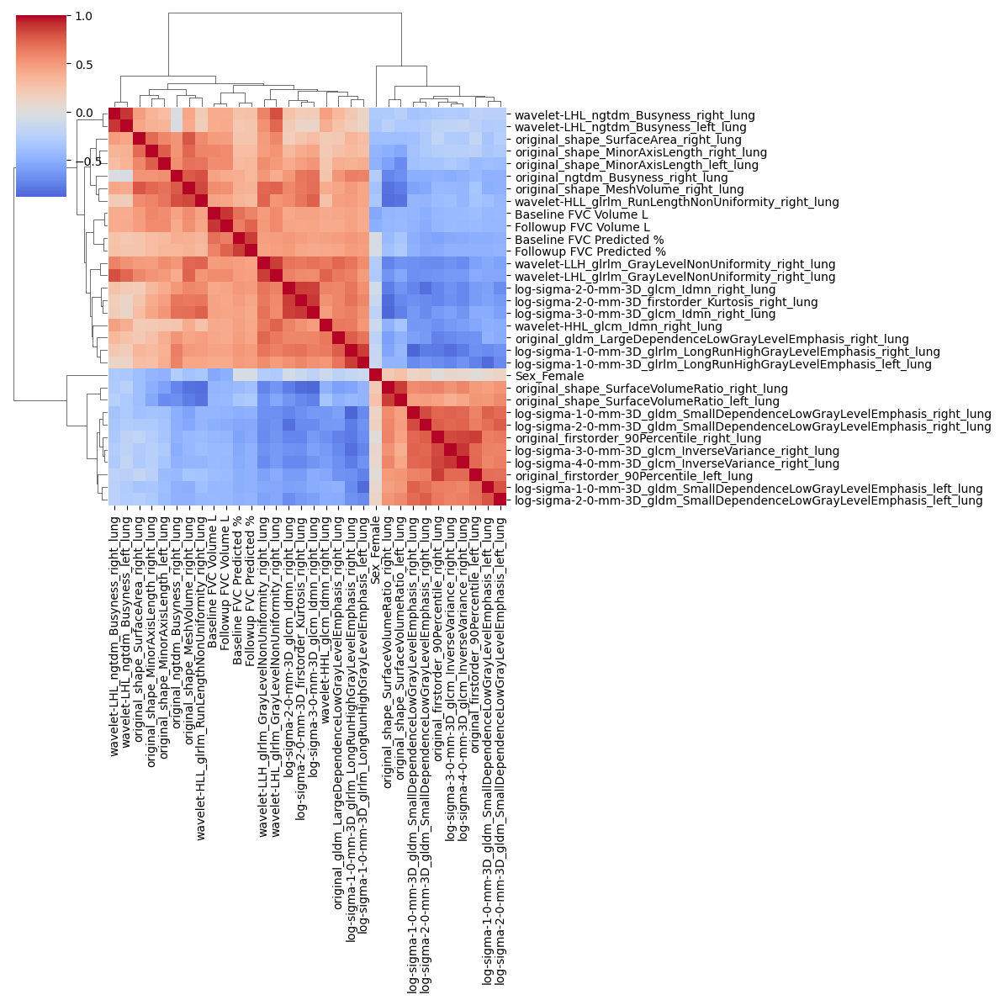

In [ ]:
spearman_corr_fvc = X_corr1.corr(method="spearman")
sns.clustermap(spearman_corr_fvc, cmap="coolwarm", center=0, figsize=(12, 12))
['Baseline FVC Volume L', 'Sex_Female', 'log-sigma-3-0-mm-3D_ngtdm_Coarseness_right_lung', 'wavelet-LHH_ngtdm_Contrast_right_lung', 'log-sigma-2-0-mm-3D_glszm_LargeAreaHighGrayLevelEmphasis_right_lung', 'original_firstorder_90Percentile_right_lung', 'wavelet-LHL_glrlm_GrayLevelNonUniformity_right_lung', 'wavelet-LHL_ngtdm_Strength_right_lung']

In [ ]:
import pandas as pd
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Calculate VIF for each feature
X = X_corr1.values
vif_data = pd.DataFrame()
vif_data["feature"] = X_corr1.columns
vif_data["VIF"] = [variance_inflation_factor(X, i) for i in range(X.shape[1])]

# Keep only features with VIF < 5
low_vif_features = vif_data[vif_data["VIF"] < 10]["feature"].tolist()

print("Selected features (VIF < 10):")
print(low_vif_features)

# If you want the reduced DataFrame:
X_reduced = X_corr1[low_vif_features]
X_reduced


NameError: name 'X_corr1' is not defined

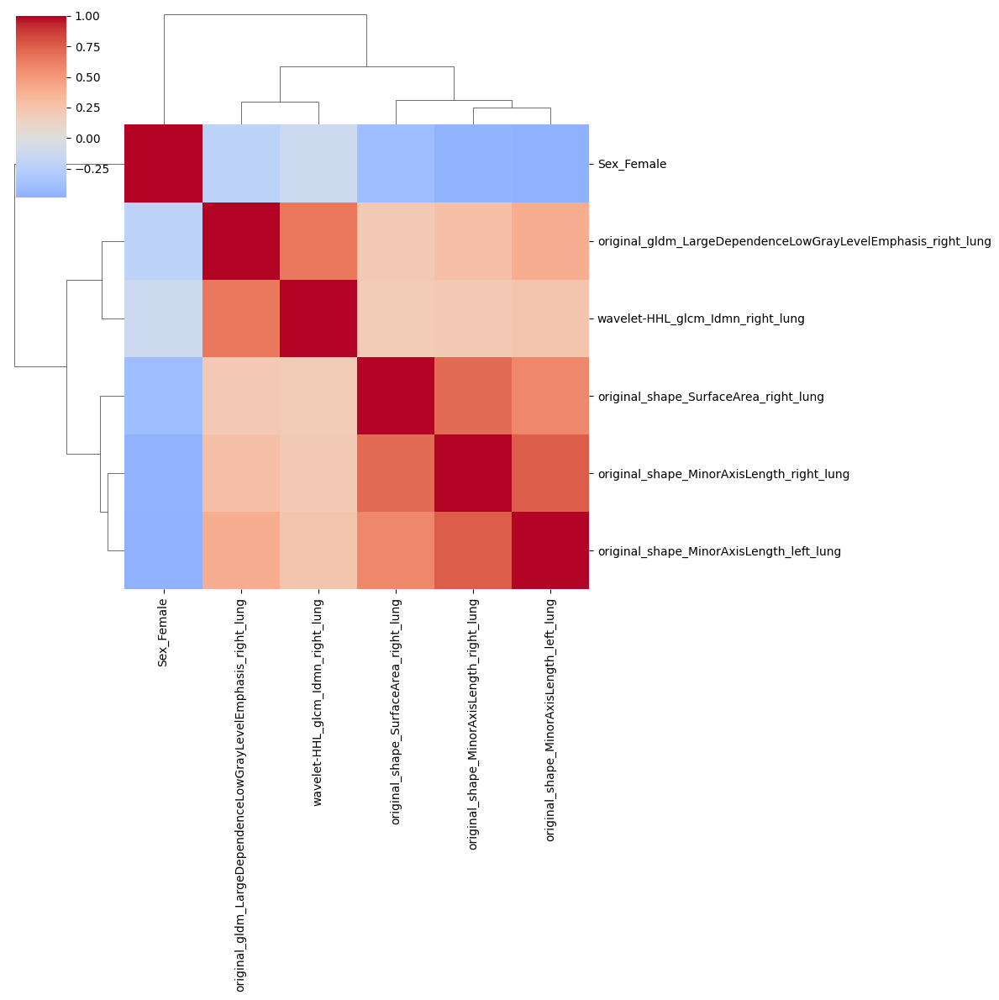

In [ ]:
X_reduced_fvc = X_reduced.corr(method="spearman")
sns.clustermap(X_reduced_fvc, cmap="coolwarm", center=0, figsize=(12, 12))

In [ ]:
# import seaborn as sns
# import matplotlib.pyplot as plt

# sns.heatmap(spearman_corr, annot=True, cmap="coolwarm")
# plt.title("Spearman Correlation Matrix")
# plt.show()


### Preprocessing DICOM metadata

In [ ]:
filtered_df_clean

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,Age,Home Region,Performed By,Type CTD,Smoking History,FEV1 Volume L,Deceased,DLCO_DATE,DLCO_CAP,DLCO_Week
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,...,77.0,Western Europe,Pulmonogists,RA,Never Smoker,1.16,No,1976-09-27,8.24,0.0
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,...,68.0,Western Europe,MDT,Not Applicable,Never Smoker,1.75,No,1969-10-06,13.31,0.0
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,...,48.0,Western Europe,MDT,Not Applicable,Never Smoker,1.10,Yes,NaT,NaT,NaN
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,...,67.0,Western Europe,MDT,Not Applicable,Ex Smoker,2.41,No,1967-10-09,10.49,0.0
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,...,75.0,Western Europe,Internist physicians,SSc,Never Smoker,2.41,No,1976-09-27,17.06,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,...,62.0,North America,pulmonologist,SS,Never Smoker,2.15,No,NaT,NaT,NaN
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,...,66.0,North America,pulmonologist,NaN,Never Smoker,1.82,No,NaT,NaT,NaN
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,...,54.0,North America,pulmonologist,NaN,Never Smoker,2.22,No,NaT,NaT,NaN
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,...,74.0,North America,pulmonologist,NaN,Never Smoker,2.74,No,1973-07-01,21.77,0.0


In [ ]:
DICOM_metadata_csv = pd.read_csv("/home/pansurya/OSIC_thesis/CSV_ Files/DICOM_info_all.csv")
DICOM_metadata_csv


,Path,Patient Name,Patient ID,Study UID,SeriesInstanceUID,Acquisition Date,Acquisition Time,Manufacturer,Model,Institution Name,...,Software Version(s),Filter Type,Patient Position,Contrast,Number of Images/Files,Number of Unreadable Files,Unreadable files,Station Name,Single Collimation Width,Total Collimation Width
0,./1.3.46.670589.33.1.63636592956521233700002.5...,100922,100922,1.3.46.670589.33.1.63636592635012844500001.540...,1.3.46.670589.33.1.63636592956521233700002.549...,19760927,NaN,Philips,NaN,NaN,...,4.7,YB,FFS,NaN,554,0,NaN,NaN,0.625,40.0
1,./1.3.46.670589.33.1.63668740139523062900002.5...,100922,100922,1.2.250.1.38.2.1.14.1.33224.10698598,1.3.46.670589.33.1.63668740139523062900002.571...,19771003,NaN,Philips,NaN,NaN,...,4.7,YB,FFS,NaN,356,0,NaN,NaN,0.625,40.0
2,./1.2.840.113704.1.111.12856.1392370004.12/,100992,100992,1.2.250.1.38.2.1.12.783845947215.2014021410312...,1.2.840.113704.1.111.12856.1392370004.12,19701026,NaN,Philips,NaN,NaN,...,3.5.5,YA,FFS,NaN,569,0,NaN,NaN,NaN,NaN
3,./1.3.6.1.4.1.19291.2.1.2.11622117719213522259...,100992,100992,1.2.840.113704.1.111.6168.1359030896.1,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,19691006,NaN,Philips,NaN,NaN,...,3.5.4,YA,FFP,NaN,617,0,NaN,NaN,NaN,NaN
4,./1.2.840.113704.1.111.12868.1380700384.12/,102083,102083,1.2.250.1.38.2.1.12.783845947215.2013100209494...,1.2.840.113704.1.111.12868.1380700384.12,19501106,NaN,Philips,NaN,NaN,...,3.5.5,YA,FFS,NaN,457,0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3058,./1.2.826.0.1.3680043.10.1218.6788313861283704...,1006459,1006459,1.2.826.0.1.3680043.10.1218.107820272165180280...,1.2.826.0.1.3680043.10.1218.678831386128370481...,19660501,152347.406,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,297,0,NaN,NaN,1.200,28.8
3059,./1.2.826.0.1.3680043.10.1218.7987831697952402...,1006781,1006781,1.2.826.0.1.3680043.10.1218.596773845258996946...,1.2.826.0.1.3680043.10.1218.798783169795240231...,19521001,84402.129,SIEMENS,SOMATOM Definition AS+,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,307,0,NaN,NaN,0.600,38.4
3060,./1.2.826.0.1.3680043.10.1218.6009837424217111...,1006781,1006781,1.2.826.0.1.3680043.10.1218.484232197514018918...,1.2.826.0.1.3680043.10.1218.600983742421711101...,19531101,100210.016,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,299,0,NaN,NaN,1.200,28.8
3061,./1.2.826.0.1.3680043.10.1218.9740861068905539...,1006982,1006982,1.2.826.0.1.3680043.10.1218.264048527134512648...,1.2.826.0.1.3680043.10.1218.974086106890553906...,19730701,85308.153,SIEMENS,SOMATOM Definition,NaN,...,syngo CT 2012B,FLAT,FFS,NaN,301,0,NaN,NaN,1.200,28.8


In [ ]:
dupes = DICOM_metadata_csv[
    DICOM_metadata_csv.duplicated(
        subset=["Patient ID", "Acquisition Date", "SeriesInstanceUID"], keep=False
    )
]
dupes

,Path,Patient Name,Patient ID,Study UID,SeriesInstanceUID,Acquisition Date,Acquisition Time,Manufacturer,Model,Institution Name,...,Software Version(s),Filter Type,Patient Position,Contrast,Number of Images/Files,Number of Unreadable Files,Unreadable files,Station Name,Single Collimation Width,Total Collimation Width
1683,./1.2.826.0.1.3680043.10.1218.5854771963697636...,1000590,1000590,1.2.826.0.1.3680043.10.1218.416714755307234874...,1.2.826.0.1.3680043.10.1218.585477196369763627...,19470101,130506.1404,SIEMENS,Sensation 16,NaN,...,syngo CT 2006G,0,FFS,NaN,1,0,NaN,NaN,0.0,0.0
1685,./1.2.826.0.1.3680043.10.1218.2660959463365016...,1000590,1000590,1.2.826.0.1.3680043.10.1218.416714755307234874...,1.2.826.0.1.3680043.10.1218.266095946336501630...,19470101,130506.1404,SIEMENS,Sensation 16,NaN,...,syngo CT 2006G,0,FFS,NaN,277,0,NaN,NaN,0.0,0.0
1687,./1.2.826.0.1.3680043.10.1218.2660959463365016...,1000590,1000590,1.2.826.0.1.3680043.10.1218.416714755307234874...,1.2.826.0.1.3680043.10.1218.266095946336501630...,19470101,130506.1404,SIEMENS,Sensation 16,NaN,...,syngo CT 2006G,0,FFS,NaN,1,0,NaN,NaN,0.0,0.0
1689,./1.2.826.0.1.3680043.10.1218.2433026096040160...,1000590,1000590,1.2.826.0.1.3680043.10.1218.416714755307234874...,1.2.826.0.1.3680043.10.1218.243302609604016097...,19470101,130506.1404,SIEMENS,Sensation 16,NaN,...,syngo CT 2006G,0,FFS,NaN,1,0,NaN,NaN,0.0,0.0
1690,./1.2.826.0.1.3680043.10.1218.2433026096040160...,1000590,1000590,1.2.826.0.1.3680043.10.1218.416714755307234874...,1.2.826.0.1.3680043.10.1218.243302609604016097...,19470101,130506.1404,SIEMENS,Sensation 16,NaN,...,syngo CT 2006G,0,FFS,NaN,247,0,NaN,NaN,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2963,./1.2.826.0.1.3680043.10.1218.6051105607225303...,1002403,1002403,1.2.826.0.1.3680043.10.1218.746684945032575195...,1.2.826.0.1.3680043.10.1218.605110560722530361...,19481001,91352.1540,1,SOMATOM Definition Edge,NaN,...,syngo CT VB20A,FLAT,HFS,NaN,110,0,NaN,NaN,0.6,38.4
2972,./1.2.826.0.1.3680043.10.1218.6051105607225303...,1002403,1002403,1.2.826.0.1.3680043.10.1218.746684945032575195...,1.2.826.0.1.3680043.10.1218.605110560722530361...,19481001,91354.4960,1,SOMATOM Definition Edge,NaN,...,syngo CT VB20A,FLAT,HFS,NaN,1,0,NaN,NaN,0.6,38.4
2974,./1.2.826.0.1.3680043.10.1218.4863872787966553...,1002403,1002403,1.2.826.0.1.3680043.10.1218.746684945032575195...,1.2.826.0.1.3680043.10.1218.486387278796655397...,19481001,91352.2130,1,SOMATOM Definition Edge,NaN,...,syngo CT VB20A,FLAT,HFS,NaN,101,0,NaN,NaN,0.6,38.4
2976,./1.2.826.0.1.3680043.10.1218.1018130224296820...,1002403,1002403,1.2.826.0.1.3680043.10.1218.746684945032575195...,1.2.826.0.1.3680043.10.1218.101813022429682004...,19481001,91352.1440,1,SOMATOM Definition Edge,NaN,...,syngo CT VB20A,FLAT,HFS,NaN,110,0,NaN,NaN,0.6,38.4


In [ ]:
dicom_empty_cols = DICOM_metadata_csv.columns[DICOM_metadata_csv.isna().all()].tolist()
print("Columns with all None/NaN values:", len(dicom_empty_cols))

Columns with all None/NaN values: 6


In [ ]:
# Drop columns that are completely empty
DICOM_metadata_csv = DICOM_metadata_csv.drop(columns=dicom_empty_cols)
print("New shape (without empty columns):", DICOM_metadata_csv.shape)

New shape (without empty columns): (3063, 33)


In [ ]:
DICOM_metadata_csv = DICOM_metadata_csv.drop_duplicates(subset=["Patient ID", "Acquisition Date", "SeriesInstanceUID"])

In [ ]:
ddd = filtered_df_clean[filtered_df_clean["Subject ID"]== "1000635"] 
print(ddd["Baseline SeriesInstanceUID"].iloc[0])   # first row


IndexError: single positional indexer is out-of-bounds

In [ ]:
DICOM_metadata_csv.columns

Index(['Path', 'Patient Name', 'Patient ID', 'Study UID', 'SeriesInstanceUID',
       'Acquisition Date', 'Acquisition Time', 'Manufacturer', 'Model',
       'Series Description', 'Scan Options', 'kVp', 'Algorithm', 'Pitch',
       'Calc Pitch', 'Dose Modulation', 'Thickness (mm)', 'Interval (mm)',
       'Calc Interval (mm)', 'X-ray Tube Current', 'Exposure', 'Exposure Time',
       'DFOV', 'CTDivol', 'Data Collection Diameter', 'Missing Slices',
       'Software Version(s)', 'Filter Type', 'Patient Position',
       'Number of Images/Files', 'Number of Unreadable Files',
       'Single Collimation Width', 'Total Collimation Width'],
      dtype='object')

In [ ]:

# Ensure Subject ID is string
filtered_df_clean["Subject ID"] = filtered_df_clean["Subject ID"].astype(str)
DICOM_metadata_csv["Patient ID"] = DICOM_metadata_csv["Patient ID"].astype(str)

# Ensure datetime conversion
# filtered_df_clean["Baseline Acquisition Date"] = pd.to_datetime(
#     filtered_df_clean["Baseline Acquisition Date"], errors="coerce"
# )
# DICOM_metadata_csv["Acquisition Date"] = pd.to_datetime(
#     DICOM_metadata_csv["Acquisition Date"].astype(str),
#     format="%Y%m%d",
#     errors="coerce"
# )


merged_DICOM_clinical_data = pd.merge(
    filtered_df_clean,
    DICOM_metadata_csv,
    how="left",
    left_on=["Subject ID", "Baseline SeriesInstanceUID"],
    right_on=["Patient ID", "SeriesInstanceUID"]
)


# # # Drop the right-side join columns
# # merged_df = merged_df.drop(columns=['Study Date', "FVC DATE", "FVC Volume L", "FVC Predicted %","Week of FVC DATE"])

print("Merged shape:", merged_DICOM_clinical_data.shape)
print(list(merged_DICOM_clinical_data.columns))
merged_DICOM_clinical_data
# merged_df[["Subject ID", 'Baseline FVC DATE', "Baseline FVC Volume L", 'Cough', 'Study Date']]




Merged shape: (554, 59)
['Subject ID', 'Baseline FVC DATE', 'Baseline FVC Volume L', 'Baseline FVC Predicted %', 'Baseline FVC Week', 'Baseline Acquisition Date', 'Baseline SeriesInstanceUID', 'Followup FVC DATE', 'Followup FVC Volume L', 'Followup FVC Predicted %', 'Followup FVC Week', 'Primary Diagnosis', 'Sex', 'Delta FVC', 'Change Category', 'Research : Height', 'Age', 'Home Region', 'Performed By', 'Type CTD', 'Smoking History', 'FEV1 Volume L', 'Deceased', 'DLCO_DATE', 'DLCO_CAP', 'DLCO_Week', 'Path', 'Patient Name', 'Patient ID', 'Study UID', 'SeriesInstanceUID', 'Acquisition Date', 'Acquisition Time', 'Manufacturer', 'Model', 'Series Description', 'Scan Options', 'kVp', 'Algorithm', 'Pitch', 'Calc Pitch', 'Dose Modulation', 'Thickness (mm)', 'Interval (mm)', 'Calc Interval (mm)', 'X-ray Tube Current', 'Exposure', 'Exposure Time', 'DFOV', 'CTDivol', 'Data Collection Diameter', 'Missing Slices', 'Software Version(s)', 'Filter Type', 'Patient Position', 'Number of Images/Files', '

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,CTDivol,Data Collection Diameter,Missing Slices,Software Version(s),Filter Type,Patient Position,Number of Images/Files,Number of Unreadable Files,Single Collimation Width,Total Collimation Width
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,...,4.71852,500.0,No,4.7,YB,FFS,554,0,0.625,40.0
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,...,3.90488,500.0,No,3.5.4,YA,FFP,617,0,NaN,NaN
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,...,5.92790,500.0,No,3.5.4,YA,FFS,509,0,NaN,NaN
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,...,4.01370,500.0,No,3.5.4,YA,FFS,676,0,NaN,NaN
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,...,2.78672,500.0,No,3.5.4,YA,FFP,604,0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,...,35.63960,500.0,No,syngo CT 2012B,FLAT,FFS,334,0,1.200,28.8
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,...,35.63960,500.0,No,syngo CT 2012B,FLAT,FFS,297,0,1.200,28.8
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,...,18.27290,500.0,No,syngo CT 2012B,FLAT,FFS,307,0,0.600,38.4
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,...,18.65150,500.0,No,syngo CT 2012B,FLAT,FFS,301,0,1.200,28.8


In [ ]:
# List of columns to check
cols_to_check = ["Manufacturer", "Algorithm", "Thickness (mm)", "Filter Type", "kVp", "Patient Position", "Exposure"]

# Count missing values in each column
missing_counts = merged_DICOM_clinical_data[cols_to_check].isnull().sum()
print(missing_counts)

# If you want to see rows with missing values
missing_rows = merged_DICOM_clinical_data[merged_DICOM_clinical_data[cols_to_check].isnull().any(axis=1)]
missing_rows


Manufacturer        0
Algorithm           0
Thickness (mm)      0
Filter Type         6
kVp                 0
Patient Position    0
Exposure            0
dtype: int64


,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,CTDivol,Data Collection Diameter,Missing Slices,Software Version(s),Filter Type,Patient Position,Number of Images/Files,Number of Unreadable Files,Single Collimation Width,Total Collimation Width
271,1000421,1971-01-01,1.94,66.7,0,1971-01-01,1.2.826.0.1.3680043.10.1218.830528948645852691...,1971-12-03,1.96,73.1,...,37.1,500.0,No,V3.50ER004,NaN,FFS,333,0,0.0,0.0
281,1000513,1964-01-01,2.37,103.0,0,1964-01-01,1.2.826.0.1.3680043.10.1218.192551797945721050...,1964-12-09,2.05,90.5,...,28.2,400.0,No,V3.50ER004,NaN,FFS,382,0,0.0,0.0
344,1000773,1971-01-01,1.54,47.8,0,1971-01-01,1.2.826.0.1.3680043.10.1218.885273548798419302...,1971-12-10,1.44,41.3,...,37.1,400.0,No,V3.50ER004,NaN,FFS,346,0,0.0,0.0
490,1001265,1975-01-01,2.58,81.1,0,1975-01-01,1.2.826.0.1.3680043.10.1218.382666750007660773...,1975-12-17,2.86,88.1,...,37.1,500.0,No,V3.50ER004,NaN,FFS,419,0,0.0,0.0
525,1001377,1964-01-01,2.77,56.3,0,1964-01-01,1.2.826.0.1.3680043.10.1218.637683879195636365...,1965-01-25,2.65,55.3,...,37.1,500.0,No,V3.50ER004,NaN,FFS,389,0,0.0,0.0
540,1001422,1960-01-01,3.33,86.0,0,1960-01-01,1.2.826.0.1.3680043.10.1218.945124311657760627...,1960-12-02,3.33,91.2,...,18.5,400.0,No,V3.50ER004,NaN,FFS,456,0,0.0,0.0


In [ ]:
# # Define bins (adjust ranges to your dataset)
# bins = [0, 1, 2, 5, 10, 100]  
# labels = ["≤1", "1–2", "2–5", "5–10", ">10"]

# # Create ThicknessBin column
# merged_DICOM_clinical_data["ThicknessBin"] = pd.cut(
#     merged_DICOM_clinical_data["Thickness (mm)"], 
#     bins=bins, 
#     labels=labels, 
#     include_lowest=True
# )

# merged_DICOM_clinical_data

# Example: simpler batch
merged_DICOM_clinical_data["ThicknessBin"] = pd.cut(
    merged_DICOM_clinical_data["Thickness (mm)"], bins=[0,2,100], labels=["<=2"," >2"], include_lowest=True
)

merged_DICOM_clinical_data["batch"] = merged_DICOM_clinical_data["Manufacturer"].astype(str)
merged_DICOM_clinical_data

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,Missing Slices,Software Version(s),Filter Type,Patient Position,Number of Images/Files,Number of Unreadable Files,Single Collimation Width,Total Collimation Width,ThicknessBin,batch
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,...,No,4.7,YB,FFS,554,0,0.625,40.0,<=2,Philips
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,...,No,3.5.4,YA,FFP,617,0,NaN,NaN,<=2,Philips
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,...,No,3.5.4,YA,FFS,509,0,NaN,NaN,<=2,Philips
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,...,No,3.5.4,YA,FFS,676,0,NaN,NaN,<=2,Philips
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,...,No,3.5.4,YA,FFP,604,0,NaN,NaN,<=2,Philips
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,...,No,syngo CT 2012B,FLAT,FFS,334,0,1.200,28.8,<=2,SIEMENS
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,...,No,syngo CT 2012B,FLAT,FFS,297,0,1.200,28.8,<=2,SIEMENS
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,...,No,syngo CT 2012B,FLAT,FFS,307,0,0.600,38.4,<=2,SIEMENS
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,...,No,syngo CT 2012B,FLAT,FFS,301,0,1.200,28.8,<=2,SIEMENS


In [ ]:
# merged_DICOM_clinical_data["batch"] = (
#     merged_DICOM_clinical_data["Manufacturer"].astype(str) + "_" +
#     merged_DICOM_clinical_data["Algorithm"].astype(str) + "_" +
#     merged_DICOM_clinical_data["ThicknessBin"].astype(str)
# )
# merged_DICOM_clinical_data

In [ ]:
RadiomicsFeaturesresults_main = pd.read_csv("/home/pansurya/OSIC_thesis/radiomics_files/RadiomicsFeaturesresults_main.csv")
RadiomicsFeaturesresults_main.drop(columns=["BaselineDate","SeriesUID", "Image", "Mask"], inplace=True)
RadiomicsFeaturesresults_main

,PatientID,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,...,log-sigma-5-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_LowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceHighGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_ngtdm_Busyness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Coarseness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Complexity_left_lung,log-sigma-5-0-mm-3D_ngtdm_Contrast_left_lung,log-sigma-5-0-mm-3D_ngtdm_Strength_left_lung
0,1001326,0.420187,0.130738,52.402080,400.816893,439.550907,184.458667,460.108683,475.458726,1.886126e+06,...,0.419370,0.002318,0.020310,9.428086,0.000051,39.586532,0.000022,229.595790,0.007051,0.017023
1,298078,0.831037,0.732034,129.431489,176.810734,246.916990,196.124960,185.000000,247.543935,2.056160e+06,...,0.584449,0.002190,0.018080,9.555249,0.000041,31.821433,0.000022,256.600569,0.005208,0.026229
2,727988,0.847265,0.639267,120.835834,189.022386,217.816436,238.824203,200.249844,250.710989,1.901542e+06,...,0.568999,0.002971,0.020283,8.182886,0.000066,27.788108,0.000030,281.030063,0.006183,0.030992
3,1001092,0.918112,0.553487,106.066920,191.634136,260.931025,229.386137,195.310010,267.845104,1.776213e+06,...,0.520253,0.002362,0.020223,9.843252,0.000052,31.931103,0.000025,248.334156,0.006476,0.023937
4,772512,0.815482,0.730328,132.707854,181.709883,232.422030,205.761998,193.080294,249.142529,2.065693e+06,...,0.453026,0.002081,0.022213,12.142016,0.000050,26.556077,0.000029,253.667054,0.007355,0.026741
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,884616,0.726119,0.484869,125.748118,259.344354,293.264386,208.081715,310.104821,313.972929,3.210182e+06,...,0.392122,0.001992,0.019201,10.399997,0.000044,32.889258,0.000022,258.723045,0.006163,0.021822
550,1000939,0.449398,0.126135,58.291219,462.135209,568.148748,217.082933,590.371070,592.218710,2.884371e+06,...,0.611136,0.003553,0.019442,6.304344,0.000075,59.092531,0.000022,169.130931,0.009339,0.011234
551,583963,0.881909,0.704290,161.614927,229.472190,289.689489,235.416652,282.793211,295.448811,4.013125e+06,...,0.365670,0.002657,0.024871,12.044779,0.000067,34.614121,0.000023,274.996828,0.007852,0.021883
552,1000731,0.695807,0.340087,82.987358,244.018123,277.504955,177.417587,332.031625,335.005970,1.664340e+06,...,0.552630,0.003359,0.017876,6.299518,0.000065,41.195646,0.000031,158.150503,0.009407,0.015823


In [ ]:
# import joblib
# from sklearn.model_selection import train_test_split
merged_DICOM_clinical_data["Smoking History"] = merged_DICOM_clinical_data["Smoking History"].fillna("No Knowledge")
merged_DICOM_clinical_data
# Clinical_demographic_batch_harmonization = merged_DICOM_clinical_data[['Subject ID',
#  'Baseline FVC Volume L',
#  'Baseline FVC Week',
#  'Followup FVC Volume L',
#  'Followup FVC Week',
#  'Primary Diagnosis',
#  'Sex',
#  'Age',
#  'Smoking History',
#  'FEV1 Volume L',
#  'batch'
# #  'DLCO_CAP'
# ]]

# Clinical_demographic_batch_harmonization["Subject ID"] = Clinical_demographic_batch_harmonization["Subject ID"].astype(str)
# RadiomicsFeaturesresults_main["PatientID"] = RadiomicsFeaturesresults_main["PatientID"].astype(str)
# # RadiomicsFeaturesresults_main["Subject ID"] = RadiomicsFeaturesresults_main["Subject ID"].astype(str)

# # final_df["Followup FVC Volume L"] = final_df["Followup FVC Volume L"].astype(float)
# # filtered_df_csv["FVC Volume L"] = filtered_df_csv["FVC Volume L"].astype(float)
# # Now merge
# merged_radiomic_clinical = pd.merge(
#     RadiomicsFeaturesresults_main,
#     Clinical_demographic_batch_harmonization,
#     how="inner",
#     left_on=["PatientID"],
#     right_on=["Subject ID"]
# )
# merged_radiomic_clinical.drop(columns=["Subject ID"], inplace=True)
# merged_radiomic_clinical
# print("Merged shape:", merged_radiomic_clinical.shape)
# print(list(merged_radiomic_clinical.columns))

# # Separate features and target
# X = merged_radiomic_clinical.drop(columns=["Followup FVC Volume L", "PatientID"])   # all radiomics features
# # X = merged_radiomic_clinical.drop(columns=["Followup FVC Volume L"]) 
# y = merged_radiomic_clinical["Followup FVC Volume L"]                  # outcome (follow-up FVC)
# X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=merged_radiomic_clinical["batch"] )
# # Save splits
# joblib.dump((X_train, X_test, y_train, y_test), "data_splits_without_nan_harmonization.pkl")
# X_train

,Subject ID,Baseline FVC DATE,Baseline FVC Volume L,Baseline FVC Predicted %,Baseline FVC Week,Baseline Acquisition Date,Baseline SeriesInstanceUID,Followup FVC DATE,Followup FVC Volume L,Followup FVC Predicted %,...,Missing Slices,Software Version(s),Filter Type,Patient Position,Number of Images/Files,Number of Unreadable Files,Single Collimation Width,Total Collimation Width,ThicknessBin,batch
0,100922,1976-09-27,1.49,78.0,0,1976-09-27,1.3.46.670589.33.1.63636592956521233700002.549...,1977-10-03,1.73,92.0,...,No,4.7,YB,FFS,554,0,0.625,40.0,<=2,Philips
1,100992,1969-10-06,2.18,97.0,0,1969-10-06,1.3.6.1.4.1.19291.2.1.2.1162211771921352225919...,1970-10-26,2.08,94.0,...,No,3.5.4,YA,FFP,617,0,NaN,NaN,<=2,Philips
2,102083,1949-10-31,1.27,51.0,0,1949-10-31,1.2.840.113704.1.111.7200.1348483519.12,1950-11-06,1.15,46.5,...,No,3.5.4,YA,FFS,509,0,NaN,NaN,<=2,Philips
3,111522,1967-10-09,2.88,86.0,0,1967-10-09,1.2.840.113704.1.111.4596.1354888535.13,1968-09-09,2.83,86.0,...,No,3.5.4,YA,FFS,676,0,NaN,NaN,<=2,Philips
4,115616,1976-09-27,3.11,116.0,0,1976-09-27,1.3.6.1.4.1.19291.2.1.2.1162211771921352225925...,1977-10-03,2.93,110.0,...,No,3.5.4,YA,FFP,604,0,NaN,NaN,<=2,Philips
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,1006455,1962-05-01,3.15,80.0,0,1962-05-01,1.2.826.0.1.3680043.10.1218.102431477862319842...,1963-05-01,3.11,84.0,...,No,syngo CT 2012B,FLAT,FFS,334,0,1.200,28.8,<=2,SIEMENS
550,1006459,1966-05-01,2.75,78.0,0,1966-05-01,1.2.826.0.1.3680043.10.1218.678831386128370481...,1967-05-01,2.14,59.0,...,No,syngo CT 2012B,FLAT,FFS,297,0,1.200,28.8,<=2,SIEMENS
551,1006781,1952-10-01,2.93,73.0,0,1952-10-01,1.2.826.0.1.3680043.10.1218.798783169795240231...,1953-10-01,3.06,77.0,...,No,syngo CT 2012B,FLAT,FFS,307,0,0.600,38.4,<=2,SIEMENS
552,1006982,1973-07-01,4.21,108.0,0,1973-07-01,1.2.826.0.1.3680043.10.1218.974086106890553906...,1974-07-01,4.19,109.0,...,No,syngo CT 2012B,FLAT,FFS,301,0,1.200,28.8,<=2,SIEMENS


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt



# 1. Contingency table
table = pd.crosstab(merged_DICOM_clinical_data["batch"], merged_DICOM_clinical_data["Exposure"])
print(table)




Exposure               1    2    3    4    5    6    7    8    9    12   ...  \
batch                                                                    ...   
Canon Medical Systems    0    0    0    0    0    0    0    0    0    0  ...   
GE MEDICAL SYSTEMS       2    1    4    5   15    2    2    1    2    1  ...   
Philips                  0    0    0    0    0    0    0    0    0    0  ...   
SIEMENS                  0    0    0    0    0    0    0    0    0    0  ...   
TOSHIBA                  0    0    0    0    0    0    0    0    0    0  ...   

Exposure               342  355  357  358  360  364  384  419  427  506  
batch                                                                    
Canon Medical Systems    0    0    0    0    0    0    0    0    0    0  
GE MEDICAL SYSTEMS       0    0    0    0    0    0    0    0    0    0  
Philips                  0    0    0    0    2    0    0    0    0    0  
SIEMENS                  1    2    1    1    0    2    1    1    1   

In [ ]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from neuroCombat import neuroCombat

# -------------------------------
# 1) Align the two DataFrames
# -------------------------------
merged_DICOM_clinical_data["Subject ID"] = merged_DICOM_clinical_data["Subject ID"].astype(str).str.strip()
RadiomicsFeaturesresults_main["PatientID"] = RadiomicsFeaturesresults_main["PatientID"].astype(str).str.strip()

common_ids = (
    pd.Index(merged_DICOM_clinical_data["Subject ID"])
    .intersection(pd.Index(RadiomicsFeaturesresults_main["PatientID"]))
)

merged_DICOM_clinical_data = merged_DICOM_clinical_data[
    merged_DICOM_clinical_data["Subject ID"].isin(common_ids)
].set_index("Subject ID")

RadiomicsFeaturesresults_main = RadiomicsFeaturesresults_main[
    RadiomicsFeaturesresults_main["PatientID"].isin(common_ids)
].set_index("PatientID")

# Ensure same order
merged_DICOM_clinical_data = merged_DICOM_clinical_data.loc[common_ids]
RadiomicsFeaturesresults_main = RadiomicsFeaturesresults_main.loc[common_ids]

# -------------------------------
# 2) Covariates (already clean)
# -------------------------------
covars = merged_DICOM_clinical_data[["batch", "Sex", "Age", "Primary Diagnosis", "Smoking History"]].copy()
# covars = merged_DICOM_clinical_data[["batch"]].copy()

# -------------------------------
# 3) Radiomics features
# -------------------------------
X = RadiomicsFeaturesresults_main.copy()

# Standardize (Z-score)
scaler = StandardScaler()
X_scaled = pd.DataFrame(
    scaler.fit_transform(X),
    index=X.index,
    columns=X.columns
)

# -------------------------------
# 4) Run ComBat harmonization
# -------------------------------
combat_result = neuroCombat(
    dat=X_scaled.T,               
    covars=covars.reset_index(),  
    batch_col="batch",
    categorical_cols=["Sex", "Primary Diagnosis", "Smoking History"]
)

X_harmonized = pd.DataFrame(
    combat_result["data"].T,
    index=X.index,
    columns=X.columns
)

# 1. Check radiomics matrix is numeric
print(RadiomicsFeaturesresults_main.dtypes.head())
print(RadiomicsFeaturesresults_main.applymap(np.isreal).all().all())

# 2. Check covariates
print(covars.head())
print(covars["batch"].nunique())   
print(covars.dtypes)

# 3. Check alignment
print(RadiomicsFeaturesresults_main.index.equals(covars.index))


# -------------------------------
# 5) Sanity checks
# -------------------------------
print("Subjects harmonized:", X_harmonized.shape[0])
print("Features harmonized:", X_harmonized.shape[1])
print("Batch counts:\n", covars["batch"].value_counts())

# Final harmonized DataFrame
harmonized_df = X_harmonized.copy()
harmonized_df.index.name = "Subject ID"

# Optionally save
harmonized_df.to_csv("/home/pansurya/OSIC_thesis/radiomics_files/RadiomicsFeature_harmonizedBYManu_neuroCombat.csv")
harmonized_df

[neuroCombat] Creating design matrix
[neuroCombat] Standardizing data across features
[neuroCombat] Fitting L/S model and finding priors
[neuroCombat] Finding parametric adjustments
[neuroCombat] Final adjustment of data
original_shape_Elongation_right_lung                 float64
original_shape_Flatness_right_lung                   float64
original_shape_LeastAxisLength_right_lung            float64
original_shape_MajorAxisLength_right_lung            float64
original_shape_Maximum2DDiameterColumn_right_lung    float64
dtype: object


/tmp/ipykernel_1697258/2457774243.py:65: FutureWarning: DataFrame.applymap has been deprecated. Use DataFrame.map instead.
  print(RadiomicsFeaturesresults_main.applymap(np.isreal).all().all())


True
          batch     Sex   Age Primary Diagnosis Smoking History
100922  Philips  Female  77.0           CTD-ILD    Never Smoker
100992  Philips  Female  68.0              UILD    Never Smoker
102083  Philips  Female  48.0              UILD    Never Smoker
111522  Philips    Male  67.0               IPF       Ex Smoker
115616  Philips  Female  75.0           CTD-ILD    Never Smoker
5
batch                 object
Sex                   object
Age                  float64
Primary Diagnosis     object
Smoking History       object
dtype: object
True
Subjects harmonized: 575
Features harmonized: 2632
Batch counts:
 batch
TOSHIBA                  308
Philips                  140
SIEMENS                   69
GE MEDICAL SYSTEMS        43
Canon Medical Systems     15
Name: count, dtype: int64


,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,log-sigma-5-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_LowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceHighGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_ngtdm_Busyness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Coarseness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Complexity_left_lung,log-sigma-5-0-mm-3D_ngtdm_Contrast_left_lung,log-sigma-5-0-mm-3D_ngtdm_Strength_left_lung
Subject ID,,,,,,,,,,,,,,,,,,,,,
100922,-0.337998,-0.956972,-1.098497,0.246868,0.203370,-0.567041,0.735730,0.283168,-0.487509,-0.084941,...,-1.973969,-1.256954,1.481245,2.428181,-0.690627,-1.466384,-0.127734,2.088828,-0.727756,2.132011
100992,0.330642,-0.194738,-0.415420,-0.164294,0.386457,0.090467,-0.541011,0.180224,-0.517464,0.058252,...,0.086902,-0.249380,-0.508946,0.318513,-0.374617,0.456914,-0.243323,-0.145406,-0.929917,-0.667893
102083,0.274781,0.504216,-0.066303,-0.511646,-0.683732,-0.781783,0.001563,-0.432322,-1.016191,-0.881982,...,1.491241,1.400257,-0.863723,-1.320430,0.774000,-0.334008,0.647000,-1.179655,0.231444,-0.202657
111522,-1.441651,-1.794650,-1.075592,2.081165,1.864454,-0.217096,2.211573,1.918577,0.879395,0.856058,...,-1.280656,-0.645467,1.167128,1.516106,-0.265521,-0.509261,-0.185480,1.382578,0.088873,0.103389
115616,0.182027,0.658483,1.221984,0.080737,-0.003580,1.099624,-0.675753,0.277925,0.948099,0.585066,...,-0.659904,-1.077343,-0.249084,0.962986,-1.038838,0.509744,-0.972915,1.085492,-1.676048,-0.263862
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1006455,-0.817789,-0.147073,0.509267,0.381727,0.581885,0.408913,0.060780,0.585974,1.182710,0.459884,...,-0.090860,-0.355860,-0.986192,-0.227765,-0.431384,1.979710,-0.484791,0.246713,-0.842281,-1.414264
1006459,-0.421497,0.075174,0.743191,0.231285,0.422861,0.397368,0.457284,0.345856,0.773528,0.936394,...,-0.292531,-0.484500,-0.442458,-0.176936,-0.546744,1.702508,-0.599375,-0.181760,0.123020,-1.528328
1006781,1.026603,0.689104,0.547547,-0.386624,-0.096587,-0.310411,-0.176439,-0.144195,0.407153,0.657909,...,-0.244740,-0.419180,-0.691192,-0.123957,-0.456923,0.185925,-0.433906,0.334133,-0.657348,-0.376259


In [ ]:
!pip install pycombat


[notice] A new release of pip is available: 25.2 -> 25.3
[notice] To update, run: pip install --upgrade pip


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from pycombat import Combat

# -------------------------------
# 0) Helper: safe numeric casting
# -------------------------------
def to_float_df(df):
    return df.apply(pd.to_numeric, errors="coerce").astype(float)

# -------------------------------
# 1) Align the two DataFrames
# -------------------------------
merged_DICOM_clinical_data["Subject ID"] = (
    merged_DICOM_clinical_data["Subject ID"].astype(str).str.strip()
)
RadiomicsFeaturesresults_main["PatientID"] = (
    RadiomicsFeaturesresults_main["PatientID"].astype(str).str.strip()
)

common_ids = (
    pd.Index(merged_DICOM_clinical_data["Subject ID"])
    .intersection(pd.Index(RadiomicsFeaturesresults_main["PatientID"]))
)

merged_DICOM_clinical_data = (
    merged_DICOM_clinical_data[merged_DICOM_clinical_data["Subject ID"].isin(common_ids)]
    .set_index("Subject ID")
    .loc[common_ids]
)

RadiomicsFeaturesresults_main = (
    RadiomicsFeaturesresults_main[RadiomicsFeaturesresults_main["PatientID"].isin(common_ids)]
    .set_index("PatientID")
    .loc[common_ids]
)

# -------------------------------
# 2) Covariates (group rare diagnoses)
# -------------------------------
covars = merged_DICOM_clinical_data[["batch", "Age", "Sex", "Primary Diagnosis", "Smoking History"]].copy()

# Compute counts per category
diag_counts = covars["Primary Diagnosis"].value_counts()

# Replace rare categories with "Other"
covars["Primary Diagnosis"] = covars["Primary Diagnosis"].apply(
    lambda x: x if diag_counts[x] > 1 else "Other"
)

print(covars["Primary Diagnosis"].value_counts())
print(covars["Primary Diagnosis"])
# One-hot encode categorical covariates on full dataset (drop_first avoids collinearity)
covars_encoded = pd.get_dummies(
    covars[["Sex", "Primary Diagnosis", "Smoking History"]],
    drop_first=True
)

# Add continuous + batch back
covars_encoded["Age"] = pd.to_numeric(covars["Age"], errors="coerce").astype(float)
covars_encoded["batch"] = covars["batch"].astype(str).astype("category")

# -------------------------------
# 3) Train/test split
# -------------------------------
train_ids, test_ids = train_test_split(
    common_ids,
    test_size=0.2,
    random_state=321,
    stratify=covars_encoded["batch"]   # keep batch balance
)

X_train = RadiomicsFeaturesresults_main.loc[train_ids].copy()
X_test  = RadiomicsFeaturesresults_main.loc[test_ids].copy()

covars_train = covars_encoded.loc[train_ids].copy()
covars_test  = covars_encoded.loc[test_ids].copy()

# -------------------------------
# 4) Prepare covariates for ComBat
# -------------------------------
# Batch numeric codes
batch_train = covars_train["batch"].cat.codes.values
batch_test  = covars_test["batch"].cat.codes.values

# Dummy covariates (already aligned since encoded before split)
cat_cols = [c for c in covars_encoded.columns if c not in ["Age", "batch"]]
X_train_covars = covars_train[cat_cols].astype(float).values
X_test_covars  = covars_test[cat_cols].astype(float).values

# Continuous covariate (Age)
C_train = covars_train[["Age"]].values
C_test  = covars_test[["Age"]].values

# -------------------------------
# 5) Standardize radiomics (fit on train only)
# -------------------------------
X_train = to_float_df(X_train)
X_test  = to_float_df(X_test)

# Drop zero-variance features
zero_var_cols = X_train.columns[X_train.std(ddof=0) == 0].tolist()
if zero_var_cols:
    X_train = X_train.drop(columns=zero_var_cols)
    X_test = X_test.drop(columns=zero_var_cols)

scaler = StandardScaler()
X_train_scaled = pd.DataFrame(
    scaler.fit_transform(X_train),
    index=X_train.index,
    columns=X_train.columns
)
X_test_scaled = pd.DataFrame(
    scaler.transform(X_test),
    index=X_test.index,
    columns=X_test.columns
)

# -------------------------------
# 6) Run ComBat harmonization
# -------------------------------
combat = Combat()  # non-parametric is safer if parametric fails

combat.fit(
    Y=X_train_scaled.values.astype(float),
    b=batch_train.astype(int),
    X=X_train_covars.astype(float),
    C=C_train.astype(float)
)

X_train_harmonized = pd.DataFrame(
    combat.transform(
        Y=X_train_scaled.values.astype(float),
        b=batch_train.astype(int),
        X=X_train_covars.astype(float),
        C=C_train.astype(float)
    ),
    index=X_train.index,
    columns=X_train.columns
)

X_test_harmonized = pd.DataFrame(
    combat.transform(
        Y=X_test_scaled.values.astype(float),
        b=batch_test.astype(int),
        X=X_test_covars.astype(float),
        C=C_test.astype(float)
    ),
    index=X_test.index,
    columns=X_test.columns
)

# -------------------------------
# 7) Sanity checks
# -------------------------------
print("Train subjects harmonized:", X_train_harmonized.shape[0])
print("Test subjects harmonized:", X_test_harmonized.shape[0])
print("Features harmonized:", X_train_harmonized.shape[1])
print("Batch counts (train):\n", covars_train["batch"].value_counts())
print("Batch counts (test):\n", covars_test["batch"].value_counts())
print("Zero-variance features dropped:", len(zero_var_cols))
print("NaNs in train harmonized:", X_train_harmonized.isna().sum().sum())
print("NaNs in test harmonized:", X_test_harmonized.isna().sum().sum())

# -------------------------------
# 8) Save outputs
# -------------------------------
harmonized_train_df = X_train_harmonized.copy()
harmonized_test_df = X_test_harmonized.copy()
harmonized_train_df.index.name = "Subject ID"
harmonized_test_df.index.name = "Subject ID"

harmonized_train_df.to_csv("/home/pansurya/OSIC_thesis/radiomics_files/RadiomicsFeaturesresults_train_harmonized.csv")
harmonized_test_df.to_csv("/home/pansurya/OSIC_thesis/radiomics_files/RadiomicsFeaturesresults_test_harmonized.csv")

import joblib

# -------------------------------
# 9) Add clinical variables to harmonized radiomics
# -------------------------------
# Select continuous clinical columns you want to keep
clinical_cont_cols = [
    "Baseline FVC Volume L",
    "Baseline FVC Week",
    "Followup FVC Volume L",   # target
    "Followup FVC Week",
    "Age",
    "FEV1 Volume L"
]

# Extract continuous clinical data for train/test
clinical_train_cont = merged_DICOM_clinical_data.loc[train_ids, clinical_cont_cols].copy()
clinical_test_cont  = merged_DICOM_clinical_data.loc[test_ids, clinical_cont_cols].copy()

# Extract one-hot encoded categorical covariates (already aligned from covars_encoded)
cat_cols = [c for c in covars_encoded.columns if c not in ["Age", "batch"]]

clinical_train_cat = covars_encoded.loc[train_ids, cat_cols].copy().astype(int)
clinical_test_cat  = covars_encoded.loc[test_ids, cat_cols].copy().astype(int)

# Merge harmonized radiomics + continuous clinical + one-hot categorical
X_train_final = pd.concat(
    [harmonized_train_df, clinical_train_cont.drop(columns=["Followup FVC Volume L"]), clinical_train_cat],
    axis=1
)
X_test_final = pd.concat(
    [harmonized_test_df, clinical_test_cont.drop(columns=["Followup FVC Volume L"]), clinical_test_cat],
    axis=1
)

# Target variable (Followup FVC Volume L)
y_train = clinical_train_cont["Followup FVC Volume L"].astype(float)
y_test  = clinical_test_cont["Followup FVC Volume L"].astype(float)

# -------------------------------
# 10) Sanity checks
# -------------------------------
print("Final train shape:", X_train_final.shape)
print("Final test shape:", X_test_final.shape)
print("Target train shape:", y_train.shape)
print("Target test shape:", y_test.shape)
print("Categorical dummy columns included:", len(cat_cols))

# -------------------------------
# 11) Save splits
# -------------------------------
joblib.dump((X_train_final, X_test_final, y_train, y_test),
            "/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl")



Primary Diagnosis
IPF                                        221
CTD-ILD                                    178
UILD                                        83
CHP                                         33
Miscellaneous                                7
INSIP                                        6
Exposure-related                             6
Sarcoidosis                                  5
Other                                        3
Fibrotic HP (FHP)                            3
No information                               3
Idiopathic OP                                2
Smoking Related ILD (DIP / RB / RB-ILD)      2
Occupational-related ILD                     2
Name: count, dtype: int64
100922               CTD-ILD
100992                  UILD
102083                  UILD
111522                   IPF
115616               CTD-ILD
                 ...        
1006455              CTD-ILD
1006459        Idiopathic OP
1006781                  IPF
1006982                  IPF
1007005 

['/home/pansurya/OSIC_thesis/radiomics_files/data_splits_with_clinical_harmonization.pkl']

In [ ]:
X_test_final

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,Primary Diagnosis_Miscellaneous,Primary Diagnosis_No information,Primary Diagnosis_Occupational-related ILD,Primary Diagnosis_Other,Primary Diagnosis_Sarcoidosis,Primary Diagnosis_Smoking Related ILD (DIP / RB / RB-ILD),Primary Diagnosis_UILD,Smoking History_Ex Smoker,Smoking History_Never Smoker,Smoking History_No Knowledge
1000538,-0.992459,-0.806277,-0.532056,0.744171,0.727944,-0.182362,1.086282,0.808218,0.454016,-0.255983,...,0,0,0,0,0,0,0,1,0,0
599535,1.258733,1.141376,0.340321,-0.976401,-0.756094,0.009285,-1.281312,-0.938279,-0.708334,-0.881546,...,0,0,0,0,0,0,1,0,1,0
770894,0.139930,1.177376,0.969150,-0.434613,-0.350529,-0.167580,-0.102531,-0.321955,-0.321329,-0.968510,...,0,0,0,0,0,0,0,0,1,0
1000858,-0.842837,-0.608399,-0.468406,0.310175,0.359587,-0.277570,0.434928,0.332998,-0.046616,-0.927604,...,0,0,0,0,0,0,0,0,1,0
1000668,1.187800,1.224440,0.968981,-0.761310,-0.557476,0.414674,-1.008446,-0.632156,0.323819,0.252232,...,0,0,0,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
754216,0.429589,0.047491,-0.338783,-0.339928,-0.245441,-0.415643,-0.165928,-0.470953,-0.593706,0.156570,...,0,0,0,0,0,0,0,1,0,0
1000883,1.379850,0.550204,0.577082,-0.485508,-0.319905,0.399516,-0.465623,-0.413384,0.515651,2.063644,...,0,0,0,0,0,0,0,0,1,0
454018,1.190461,2.124081,2.526147,-0.426959,0.262575,1.096150,-0.722269,0.038706,1.510732,1.301280,...,0,0,0,0,0,0,0,0,1,0
1001022,0.061286,-0.751815,-1.581173,-0.640543,-0.758234,-0.444655,-0.771998,-0.833517,-1.318800,-1.928032,...,0,0,0,0,0,0,0,0,1,0


In [ ]:
import numpy as np

col = "original_shape_Elongation_right_lung"
val = 0.959304

mask = np.isclose(harmonized_df[col], val, atol=1e-6)  # tolerance of 1e-6
rows = harmonized_df[mask]

print(rows)



NameError: name 'harmonized_df' is not defined

In [ ]:
X_train_scaled

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,log-sigma-5-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_LowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceHighGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_ngtdm_Busyness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Coarseness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Complexity_left_lung,log-sigma-5-0-mm-3D_ngtdm_Contrast_left_lung,log-sigma-5-0-mm-3D_ngtdm_Strength_left_lung
1000582,-0.887286,-1.023399,-1.115462,-0.004815,-0.182061,-0.522097,0.330774,-0.090959,-0.945673,-1.296006,...,2.036725,3.253524,-0.489674,-1.604934,2.608690,0.094969,1.544967,-1.675179,1.606086,-0.299883
1000817,1.063377,1.413709,1.168537,-0.671055,-0.566218,-0.021058,-0.530331,-0.578808,0.290445,0.303417,...,0.108320,-0.600843,0.177184,0.604115,-0.626307,-0.501637,-0.622011,1.470212,-1.034237,0.812823
1002394,0.756736,0.686600,0.487312,-0.588774,-0.462764,-0.068687,-0.679423,-0.450608,-0.074513,0.148560,...,-0.079424,-0.388469,0.490634,0.447679,-0.285682,-0.213724,-0.340615,0.024012,-0.164496,-0.149789
853662,-0.557556,-0.861941,-0.786220,0.042656,0.079868,0.835026,-0.855303,-0.059164,-0.566560,-0.270781,...,2.399838,1.787984,-0.751381,-1.546716,1.462371,0.973196,-0.040620,-1.039824,0.213454,-0.747825
358759,0.627188,0.955659,2.295458,-0.003855,0.269173,0.657887,0.013728,0.150033,3.207594,2.688469,...,-0.428549,-0.762720,-1.012320,0.195648,-1.043239,1.528636,-1.496186,1.517060,-1.233629,-0.851536
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000565,-1.458604,-1.593118,-1.649588,0.886966,0.707617,-0.582099,1.325867,0.752961,-0.784195,-0.782270,...,0.559206,1.330539,-0.611573,-1.457524,1.467645,-0.149096,1.178242,-1.574628,0.707868,-0.468645
1001353,-1.107578,-1.226154,-0.997858,0.585581,0.524215,-0.535286,1.190104,0.686768,-0.324854,-0.291522,...,-0.120773,0.289837,0.117731,-0.567839,0.419528,-0.211354,0.263953,-0.608869,0.388946,-0.355057
1001380,-0.953847,-1.329671,-1.321124,0.449069,0.250392,-0.445862,1.128771,0.594074,-0.851385,-0.169706,...,-0.434742,0.106955,-0.528742,-0.703477,0.019260,-0.508230,0.263757,-0.329503,-0.283086,0.060603
1000910,0.585890,0.647152,1.033169,-0.326099,-0.219603,-0.025413,-0.174664,-0.317484,0.882937,1.059194,...,0.074714,-0.656338,-1.256463,-0.178689,-1.010751,0.609352,-1.232916,1.137549,-1.438635,-0.256069


In [ ]:
X_train_harmonized

,original_shape_Elongation_right_lung,original_shape_Flatness_right_lung,original_shape_LeastAxisLength_right_lung,original_shape_MajorAxisLength_right_lung,original_shape_Maximum2DDiameterColumn_right_lung,original_shape_Maximum2DDiameterRow_right_lung,original_shape_Maximum2DDiameterSlice_right_lung,original_shape_Maximum3DDiameter_right_lung,original_shape_MeshVolume_right_lung,original_shape_MinorAxisLength_right_lung,...,log-sigma-5-0-mm-3D_gldm_LargeDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_LowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceHighGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_ngtdm_Busyness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Coarseness_left_lung,log-sigma-5-0-mm-3D_ngtdm_Complexity_left_lung,log-sigma-5-0-mm-3D_ngtdm_Contrast_left_lung,log-sigma-5-0-mm-3D_ngtdm_Strength_left_lung
1000582,-0.348239,-0.272374,-0.350553,-0.181428,-0.120002,-0.035184,-0.198161,-0.165953,-0.493672,-1.015124,...,2.512278,2.937085,-0.934963,-2.165440,2.341986,1.338242,1.029744,-2.010821,1.300308,-0.761835
1000817,1.296203,1.706313,1.601597,-0.733288,-0.460292,0.353789,-0.875233,-0.575649,1.016841,0.548205,...,0.778918,-0.311874,-0.168128,0.137111,-0.585932,0.567221,-0.937042,1.013257,-1.027079,0.281062
1002394,0.888087,1.335527,1.055900,-0.523122,-0.271277,0.052250,-0.717965,-0.337869,0.315381,0.260849,...,0.855527,-0.081015,-0.328016,-0.363900,-0.349476,1.014927,-0.737419,-0.479200,-0.338655,-0.714194
853662,-0.454072,-1.106962,-1.592128,0.199336,0.370655,1.374147,-1.263287,0.105122,-1.176067,-0.852844,...,4.135568,3.442867,-0.541396,-2.094300,2.847073,0.976629,0.659354,-1.783827,1.033617,-0.733955
358759,1.118030,1.507238,2.206952,-0.126678,0.397832,1.115065,-0.348759,0.166644,1.862941,2.033799,...,0.377053,-0.274834,-0.803089,-0.345779,-0.522322,1.485379,-0.995467,0.982852,-0.818357,-0.682331
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1000565,-0.836845,-0.750159,-0.828284,0.557284,0.607868,-0.122026,0.655844,0.524809,-0.298578,-0.510541,...,1.190765,1.302216,-1.032519,-1.959479,1.301690,1.006609,0.709288,-1.855507,0.491715,-0.852838
1001353,-0.553481,-0.483626,-0.285226,0.300897,0.433593,-0.128162,0.576948,0.460946,0.216493,-0.026538,...,0.482840,0.355473,-0.217203,-0.984352,0.317260,0.806604,-0.120521,-0.867781,0.182728,-0.696533
1001380,-0.357752,-0.472748,-0.459537,0.219515,0.273544,0.061682,0.492929,0.433666,-0.545014,0.109747,...,0.330656,0.210842,-0.971382,-1.276667,-0.058817,0.748609,-0.213082,-0.688695,-0.443708,-0.423573
1000910,0.884493,1.053055,1.504400,-0.412230,-0.151477,0.331652,-0.513120,-0.331895,1.561621,1.311858,...,0.524160,-0.515597,-1.613793,-0.537929,-1.027398,1.538988,-1.541830,0.845251,-1.475475,-0.602027


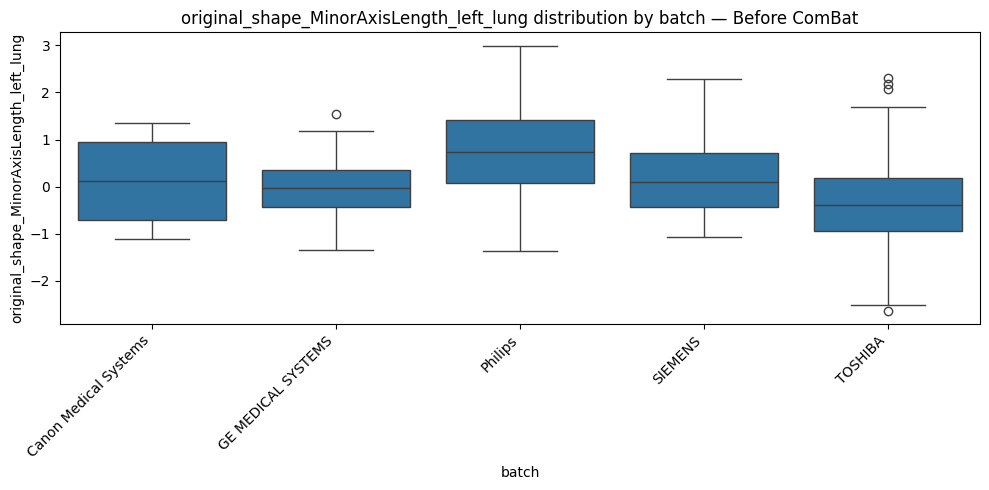

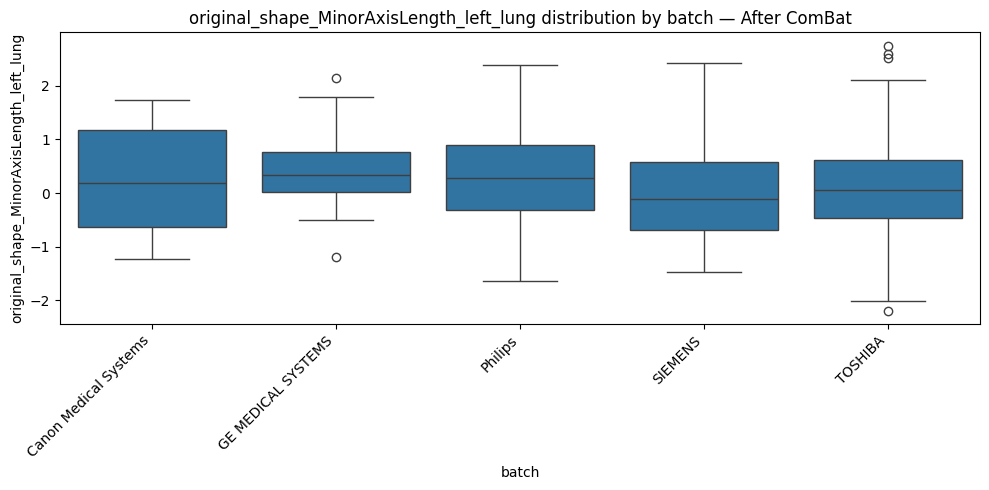

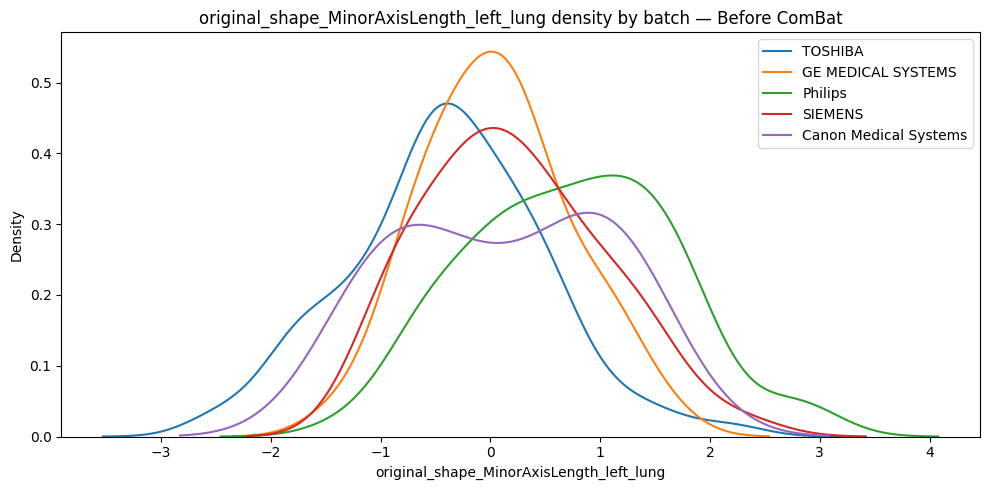

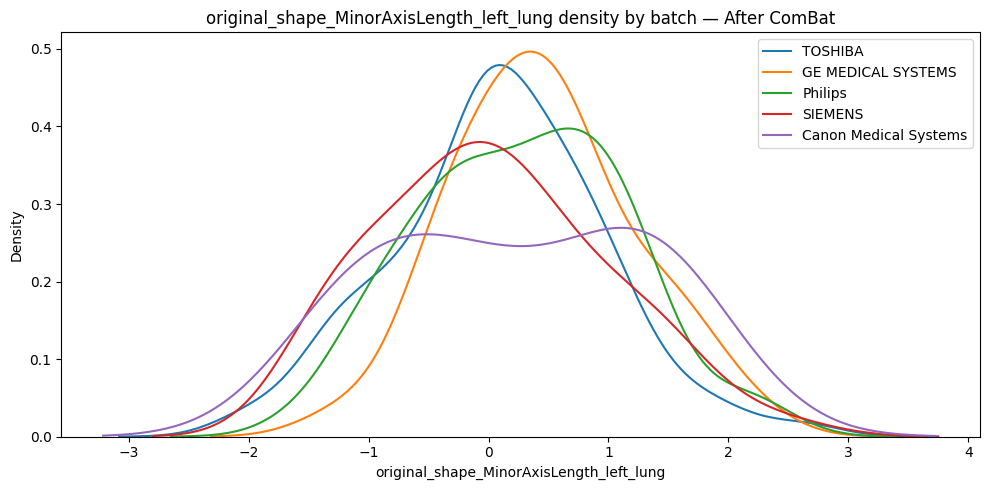

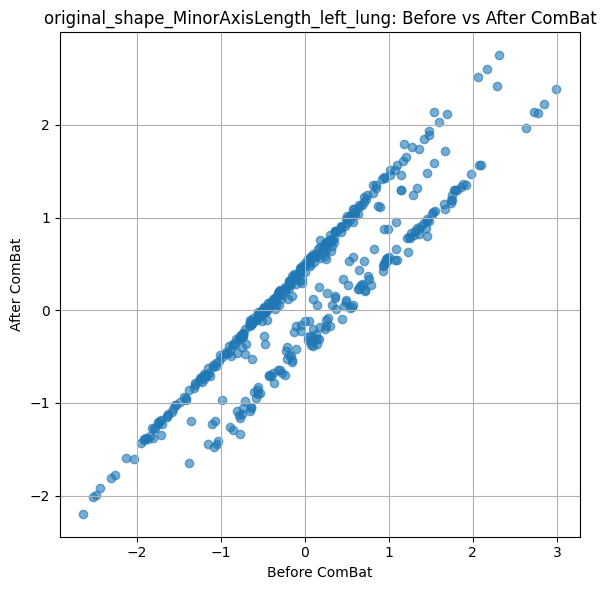

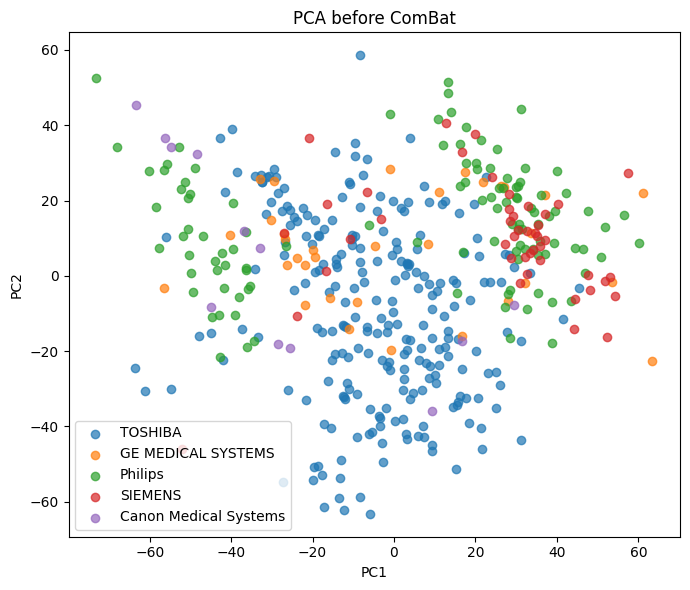

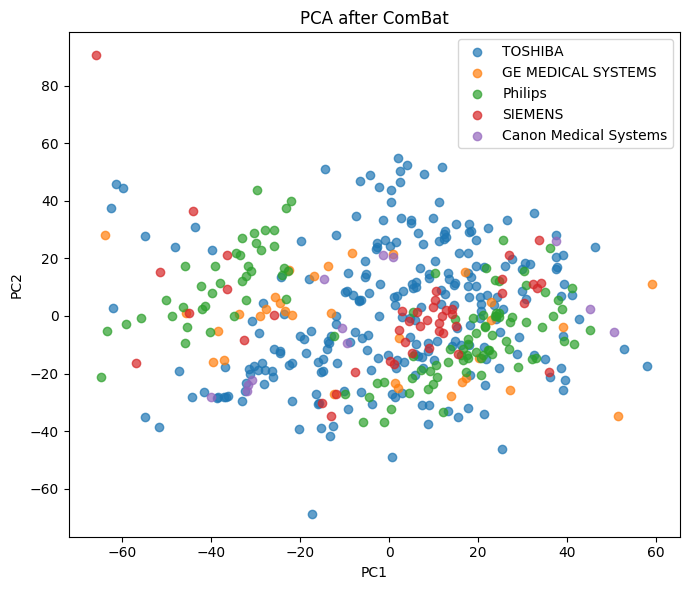

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.decomposition import PCA

# Choose a feature to visualize
feature = "original_shape_MinorAxisLength_left_lung"

# -------------------------------
# 1. Boxplots (Before vs After)
# -------------------------------
plt.figure(figsize=(10,5))
sns.boxplot(x=covars_train["batch"], y=X_train_scaled[feature])
plt.xticks(rotation=45, ha="right")
plt.title(f"{feature} distribution by batch — Before ComBat")
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,5))
sns.boxplot(x=covars_train["batch"], y=X_train_harmonized[feature])
plt.xticks(rotation=45, ha="right")
plt.title(f"{feature} distribution by batch — After ComBat")
plt.tight_layout()
plt.show()

# -------------------------------
# 2. Density plots (Before vs After)
# -------------------------------
plt.figure(figsize=(10,5))
for batch in covars_train["batch"].unique():
    sns.kdeplot(X_train_scaled.loc[covars_train["batch"]==batch, feature], label=batch)
plt.title(f"{feature} density by batch — Before ComBat")
plt.xlabel(feature)
plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(10,5))
for batch in covars_train["batch"].unique():
    sns.kdeplot(X_train_harmonized.loc[covars_train["batch"]==batch, feature], label=batch)
plt.title(f"{feature} density by batch — After ComBat")
plt.xlabel(feature)
plt.legend()
plt.tight_layout()
plt.show()

# -------------------------------
# 3. Scatter plot (Before vs After)
# -------------------------------
plt.figure(figsize=(6,6))
plt.scatter(X_train_scaled[feature], X_train_harmonized[feature], alpha=0.6)
plt.xlabel("Before ComBat")
plt.ylabel("After ComBat")
plt.title(f"{feature}: Before vs After ComBat")
plt.grid(True)
plt.tight_layout()
plt.show()

# -------------------------------
# 4. PCA plots (Before vs After)
# -------------------------------
def plot_pca(X, covars, title):
    pca = PCA(n_components=2)
    pcs = pca.fit_transform(X)
    plt.figure(figsize=(7,6))
    for batch in covars_train["batch"].unique():
        mask = covars_train["batch"] == batch
        plt.scatter(pcs[mask,0], pcs[mask,1], label=batch, alpha=0.7)
    plt.title(title)
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend()
    plt.tight_layout()
    plt.show()

plot_pca(X_train_scaled, covars, "PCA before ComBat")
plot_pca(X_train_harmonized, covars, "PCA after ComBat")


original_shape_MinorAxisLength_left_lung


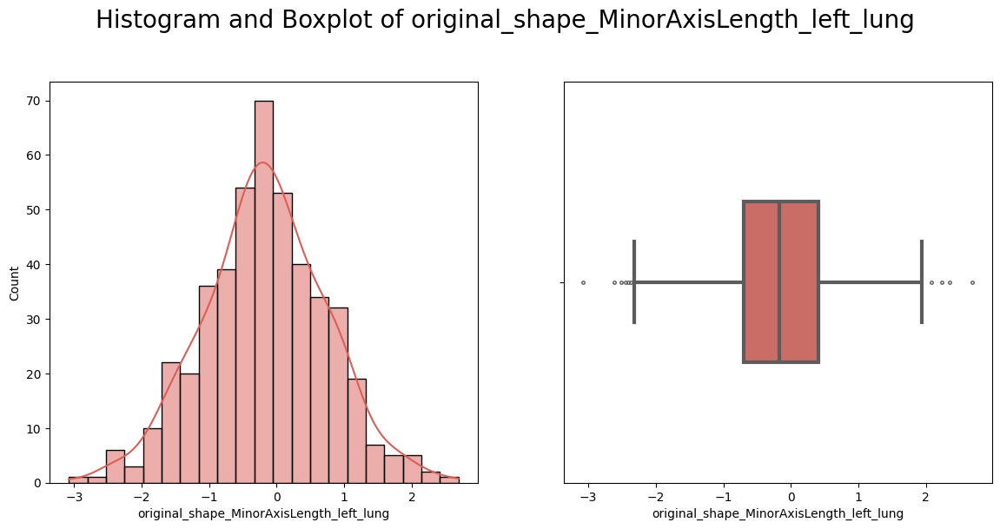

wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung


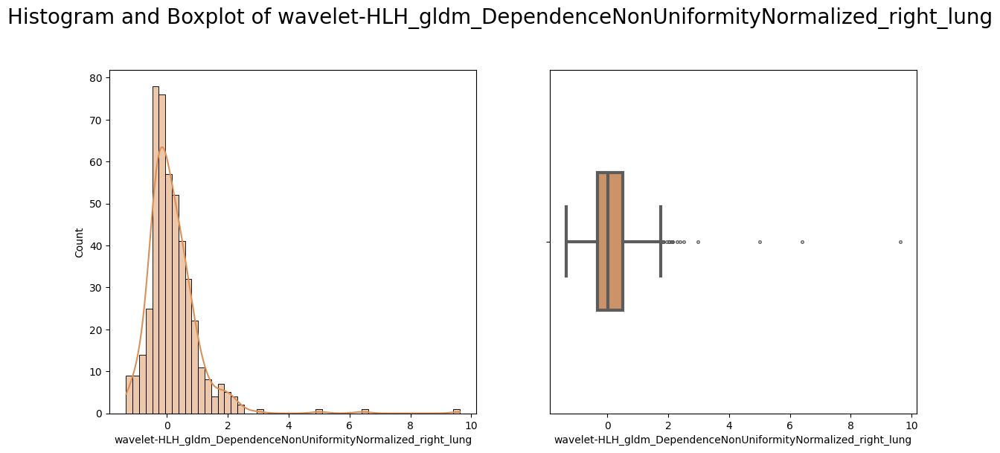

log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung


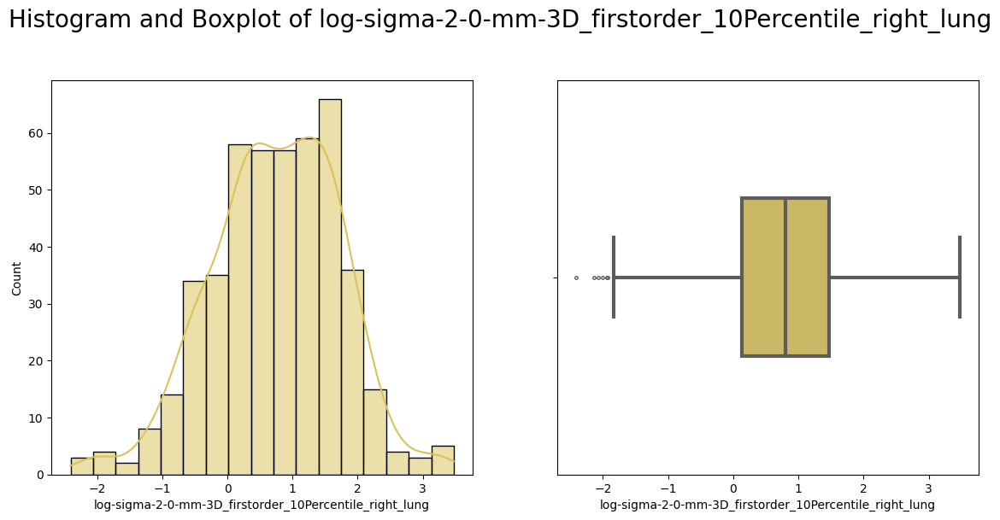

original_shape_MinorAxisLength_right_lung


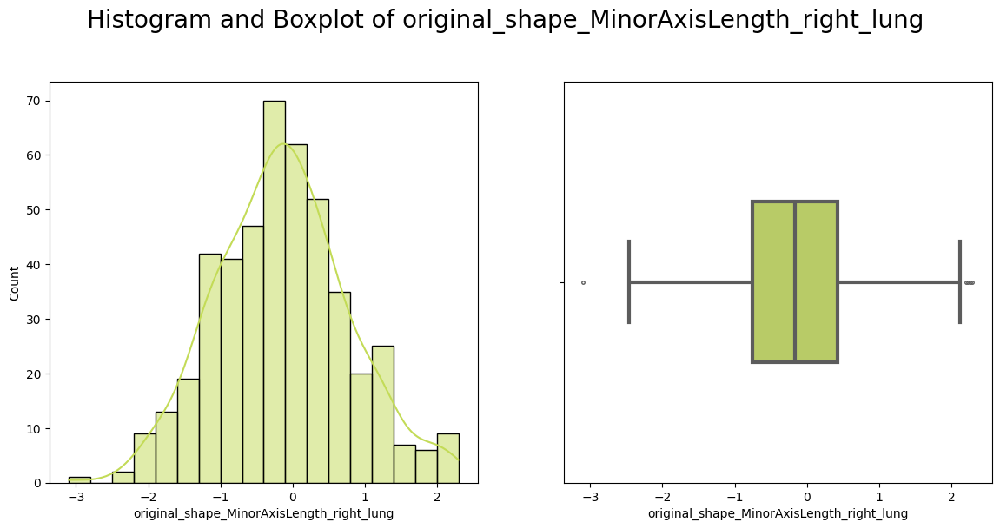

wavelet-HHL_glcm_Idmn_right_lung


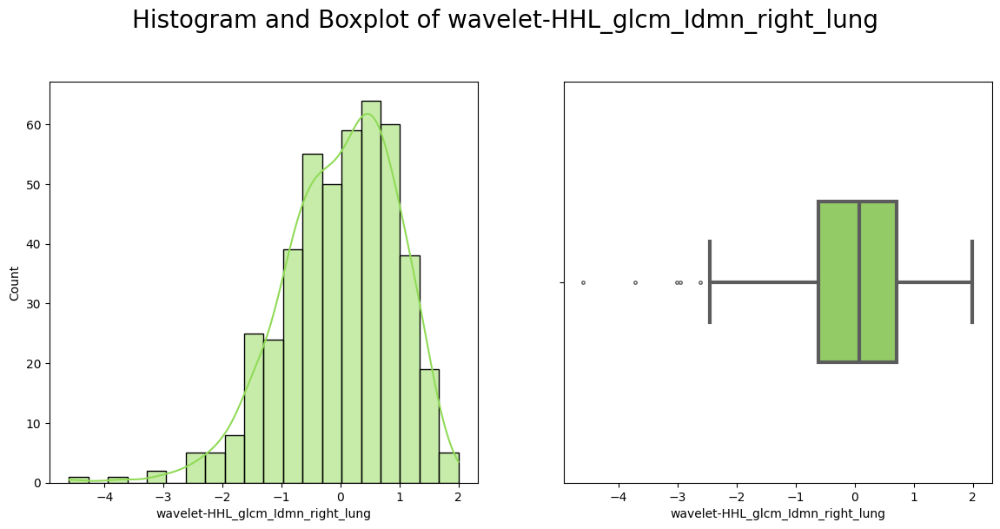

original_shape_SurfaceArea_right_lung


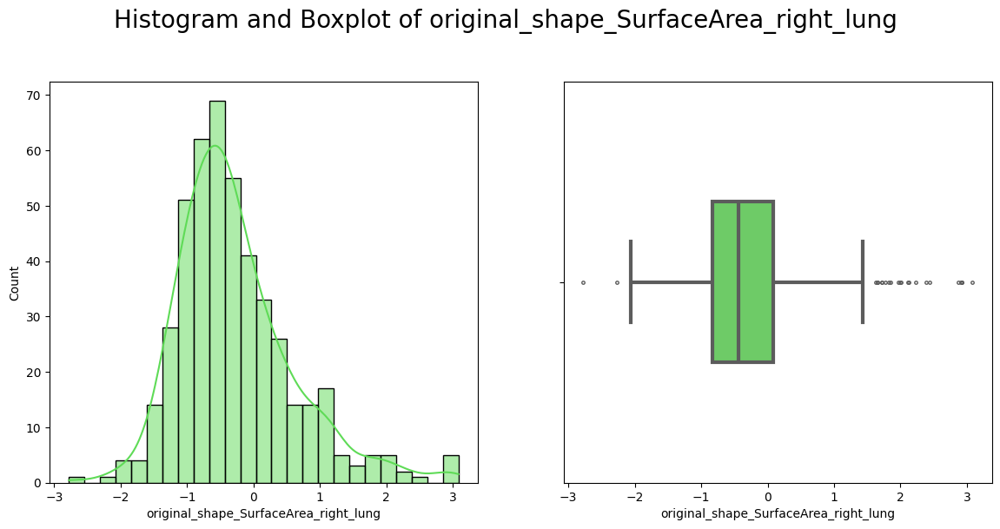

original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung


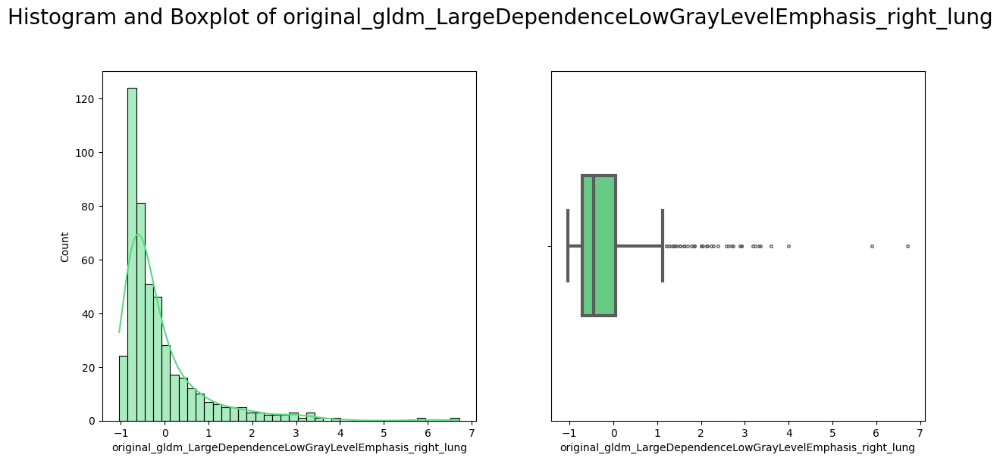

log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung


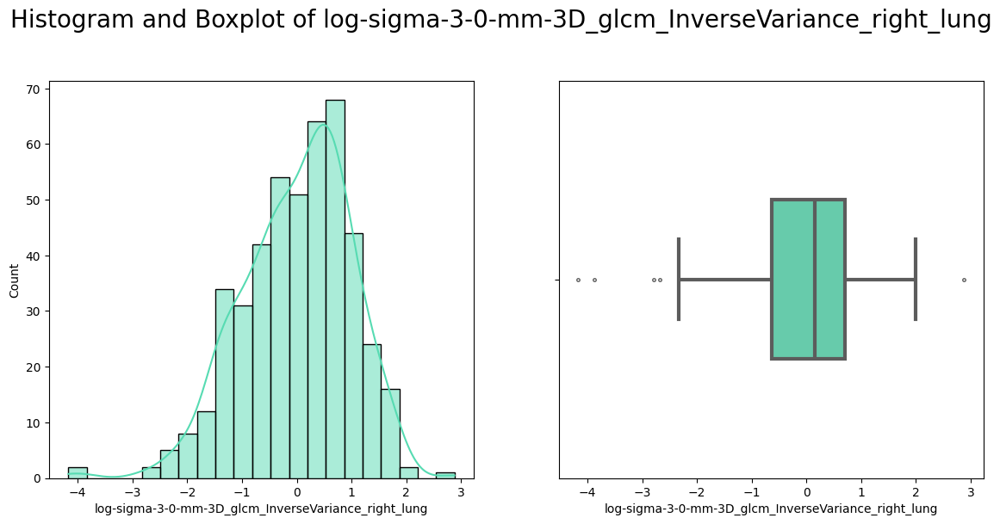

log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung


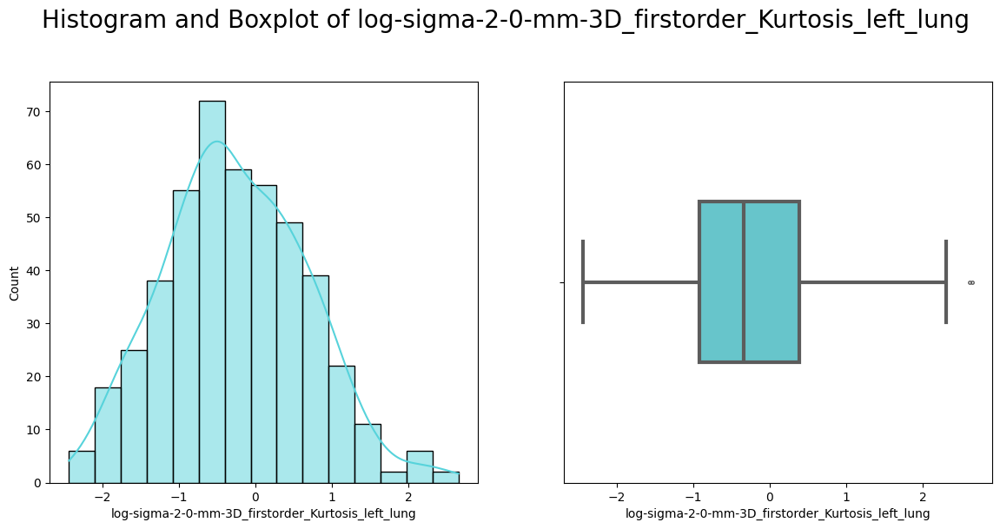

log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung


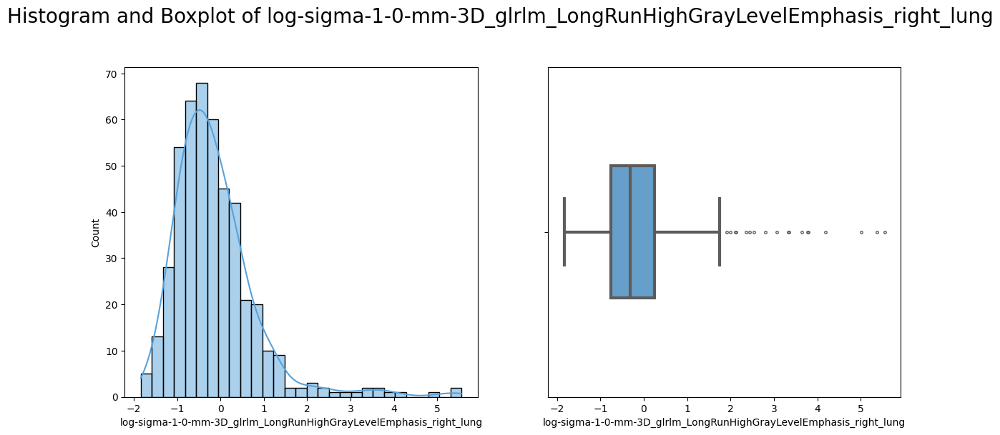

log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung


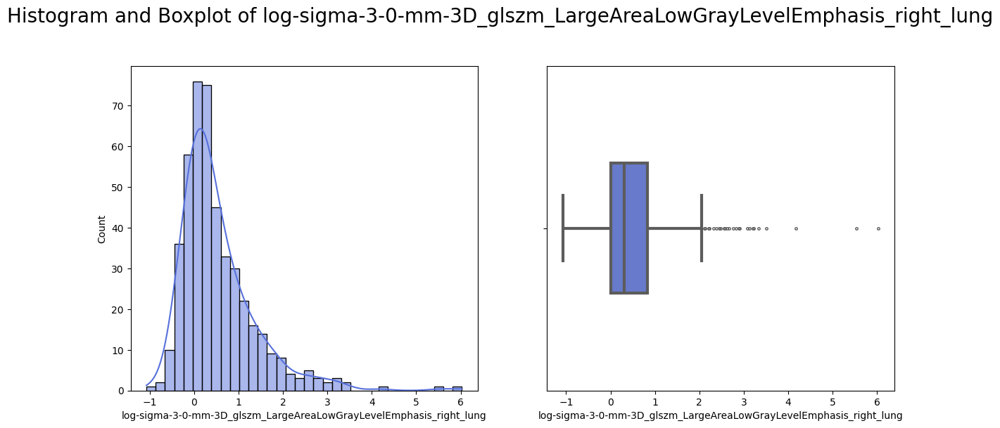

log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung


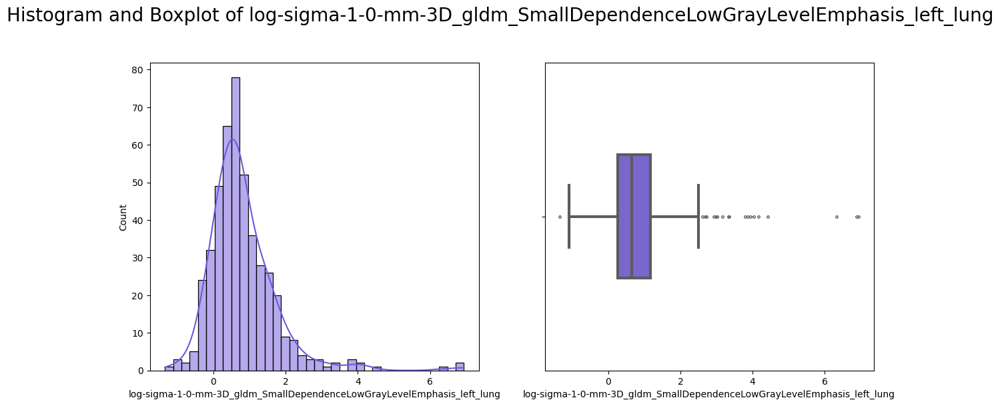

log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung


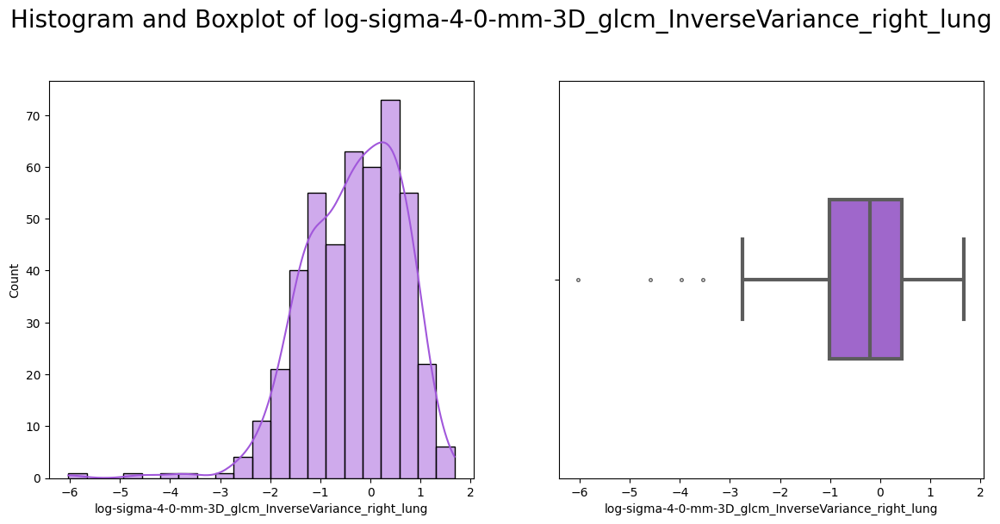

wavelet-LHL_glcm_Idmn_left_lung


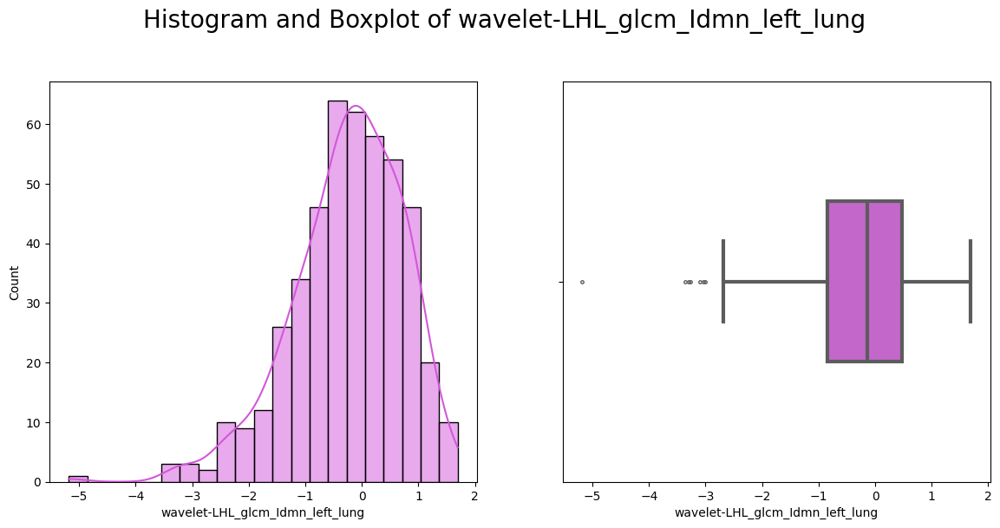

log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung


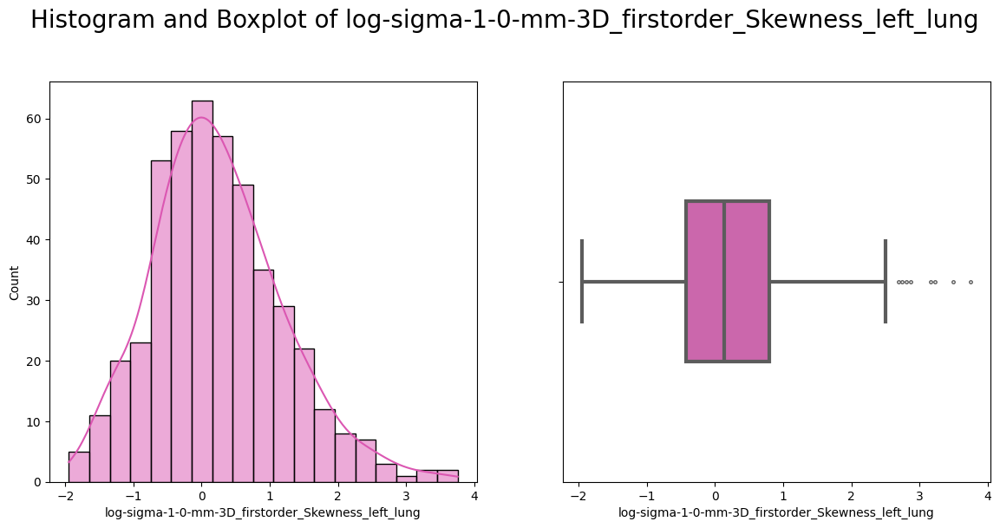

wavelet-HLL_firstorder_Kurtosis_left_lung


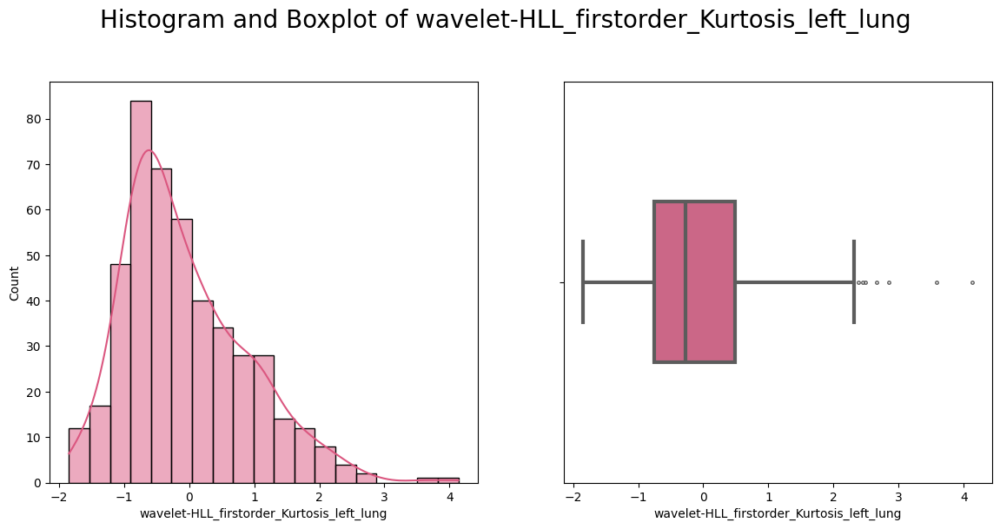

In [ ]:
radiomics_features = ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung']
Selected_Radiomics_Features = X_train_harmonized[radiomics_features]
Selected_Radiomics_Features.skew() # -0.5 to 0.5 then not skew
for idx, col in enumerate([i for i in Selected_Radiomics_Features.columns if i != 'sex1']):
    print(col)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))
    sns.histplot(Selected_Radiomics_Features, x = Selected_Radiomics_Features[col], kde = True,
                 color = sns.color_palette("hls", len([i for i in Selected_Radiomics_Features.columns if i != 'sex1']))[idx], ax = ax1)
    sns.boxplot(x = Selected_Radiomics_Features[col], width = 0.4, linewidth = 3, fliersize = 2.5,
                color = sns.color_palette("hls", len([i for i in Selected_Radiomics_Features.columns if i != 'sex1']))[idx], ax = ax2)
    fig.suptitle(f"Histogram and Boxplot of {col}", size = 20, y = 1.02)
    plt.show()

['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung', 'Baseline FVC Volume L', 'Age', 'FEV1 Volume L']
Numeric features: ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_Depende

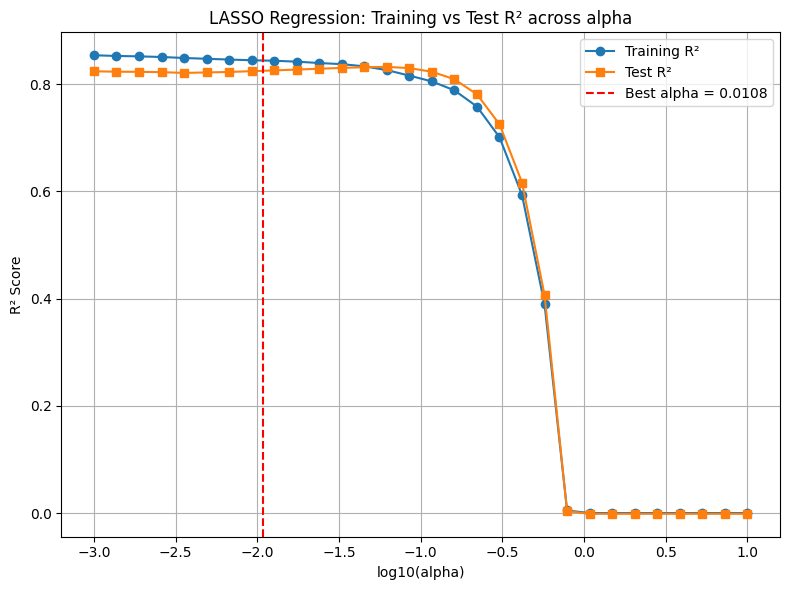

- MLL (adaptive σ): -2.9199

Test set performance:
- MAE:  0.27 L
- MSE:  0.14 L²
- RMSE: 0.38 L
- R²:   0.825

Training set performance:
- MAE:  0.24 L
- MSE:  0.12 L²
- RMSE: 0.34 L
- R²:   0.844

Model coefficients (sorted by |coef|):
                                              Feature  Coefficient
16                              Baseline FVC Volume L     0.657226
35                                         Sex_Female    -0.086854
0            original_shape_MinorAxisLength_left_lung     0.081956
17                                                Age    -0.079994
2   log-sigma-2-0-mm-3D_firstorder_10Percentile_ri...     0.047287
11  log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGra...    -0.025446
4                    wavelet-HHL_glcm_Idmn_right_lung     0.021814
25                              Primary Diagnosis_IPF    -0.012278
10  log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLeve...     0.010881
9   log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevel...     0.009568
3           original_shap

/tmp/ipykernel_1615777/1886070794.py:244: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


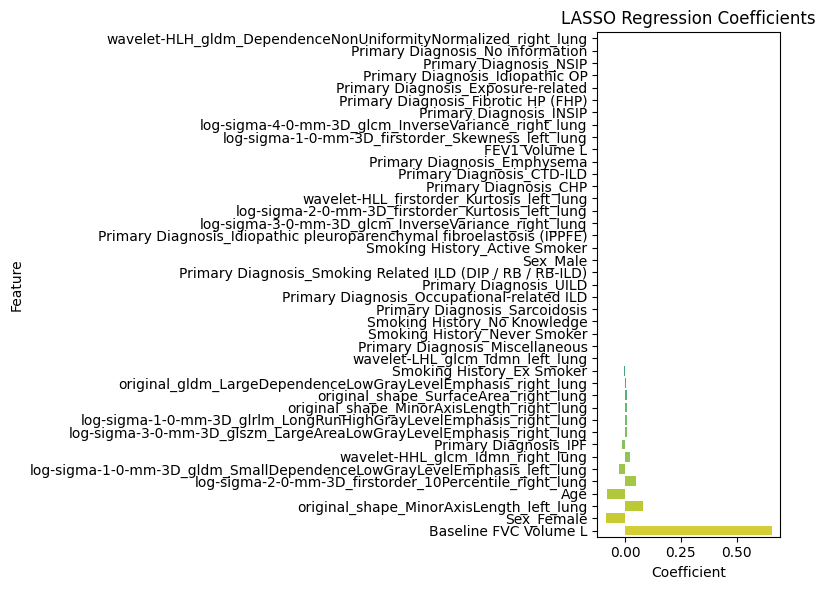

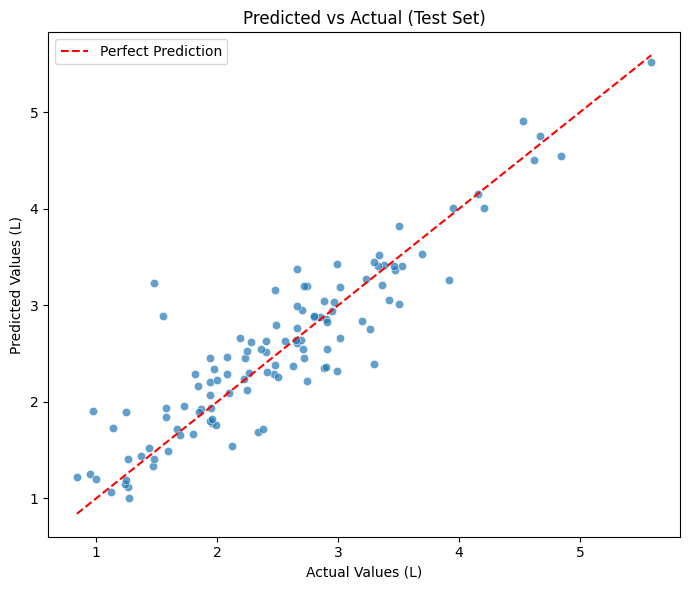

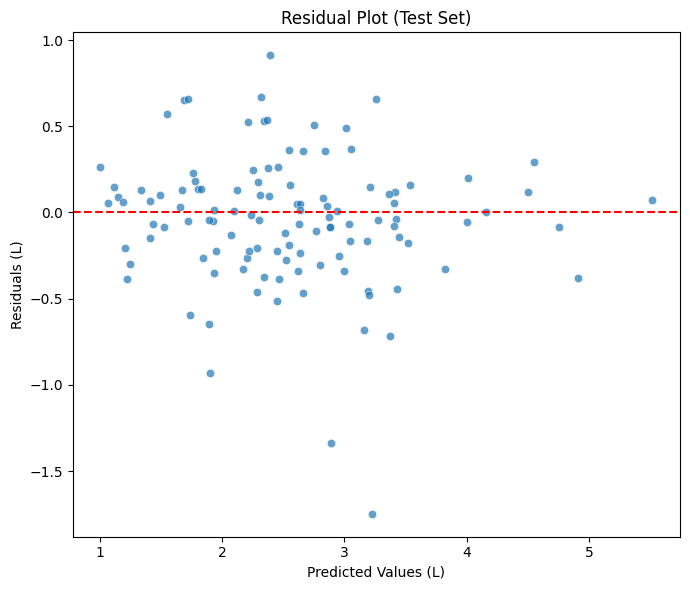


Top 5 patients with largest errors:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
155          3.59        1.48       3.227490   1.747490                0.0   
167          2.93        1.55       2.889619   1.339619                0.0   
79           1.90        0.97       1.903682   0.933682                0.0   
329          2.61        3.30       2.388060   0.911940                0.0   
469          3.50        2.66       3.377098   0.717098                0.0   

     Followup_FVC_Week  
155               53.0  
167               52.0  
79                54.0  
329               56.0  
469               52.0  


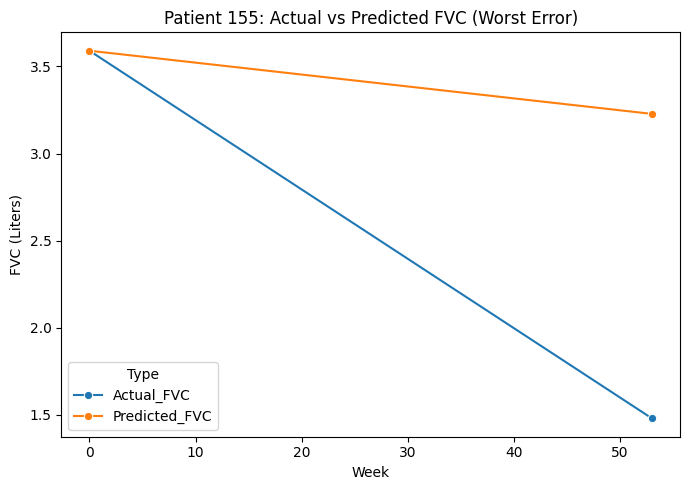

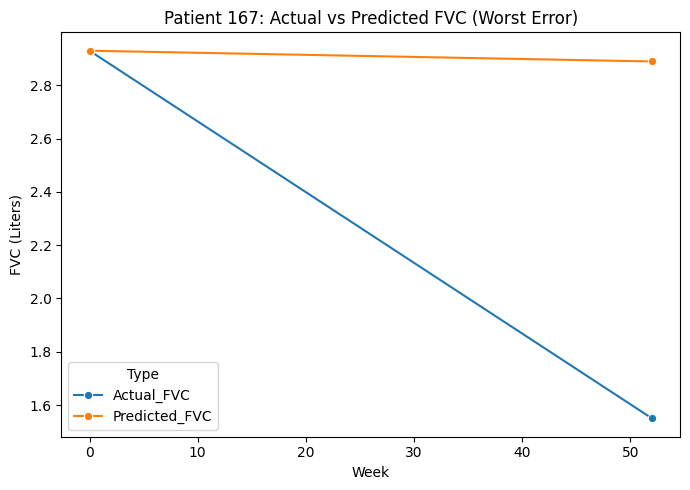

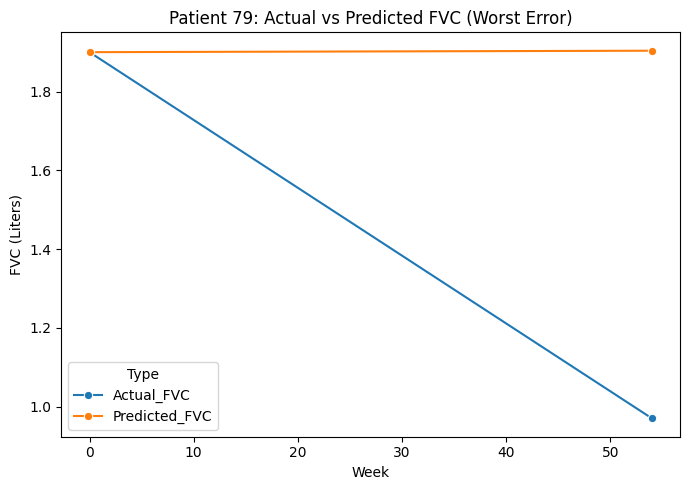

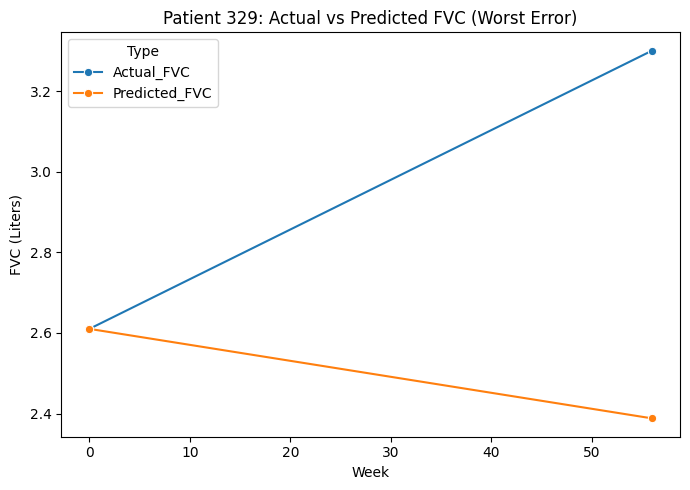

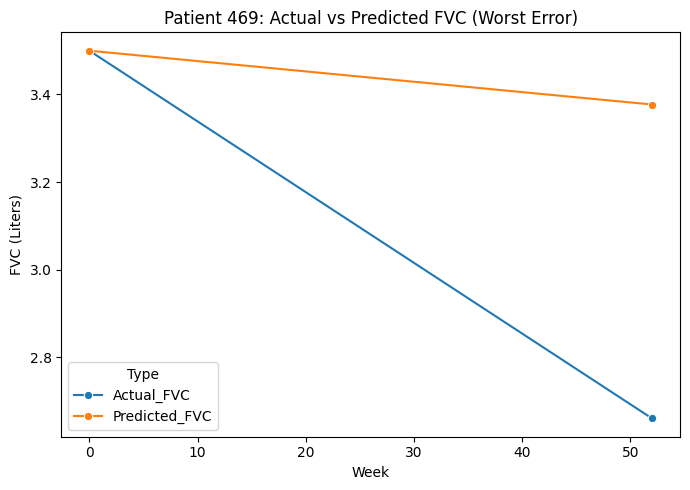


Top 5 patients with increasing FVC and lowest error:
     Baseline_FVC  Target_FVC  Predicted_FVC  Abs_Error  Baseline_FVC_Week  \
84           1.58        1.69       1.655327   0.034673                0.0   
148          2.79        2.90       2.861526   0.038474                0.0   
533          2.65        2.66       2.612420   0.047580                0.0   
556          1.43        1.48       1.410472   0.069528                0.0   
382          1.05        1.24       1.149533   0.090467                0.0   

     Followup_FVC_Week  
84                52.0  
148               51.0  
533               52.0  
556               55.0  
382               55.0  


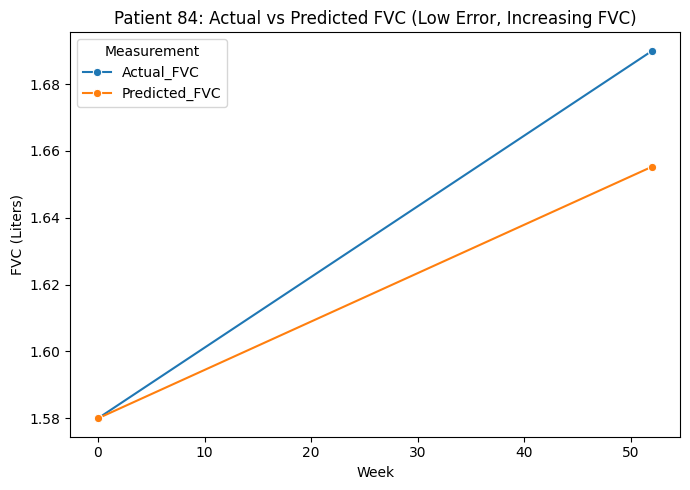

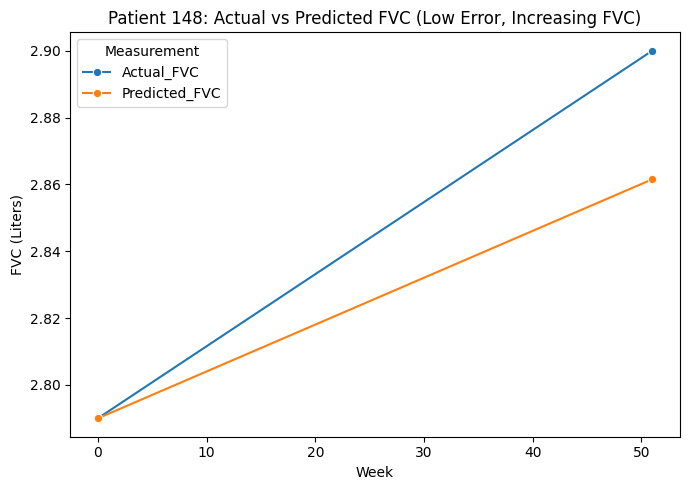

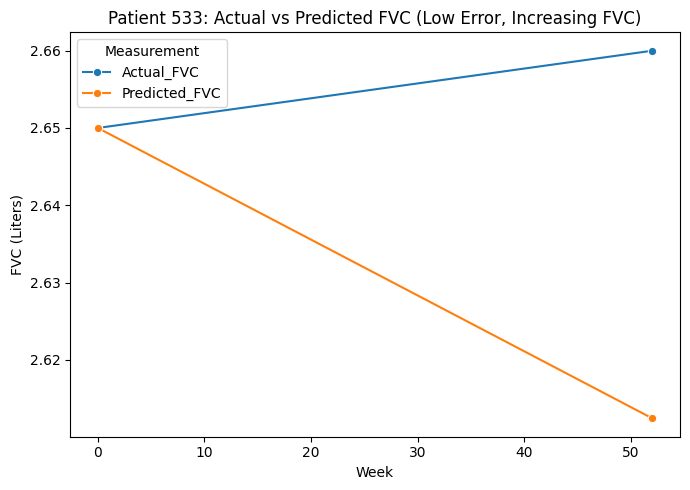

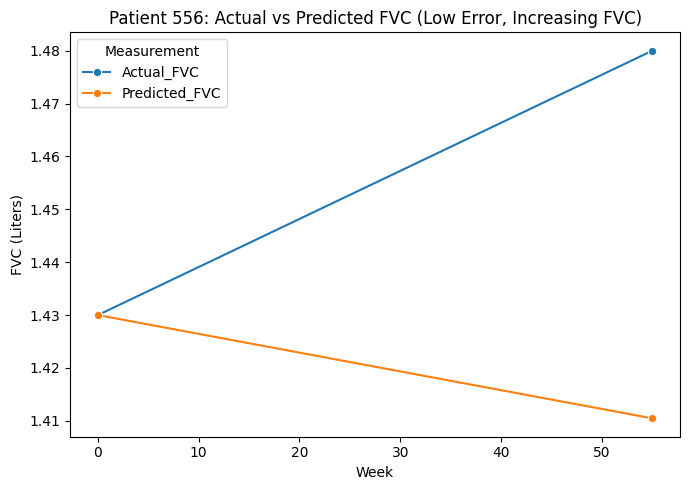

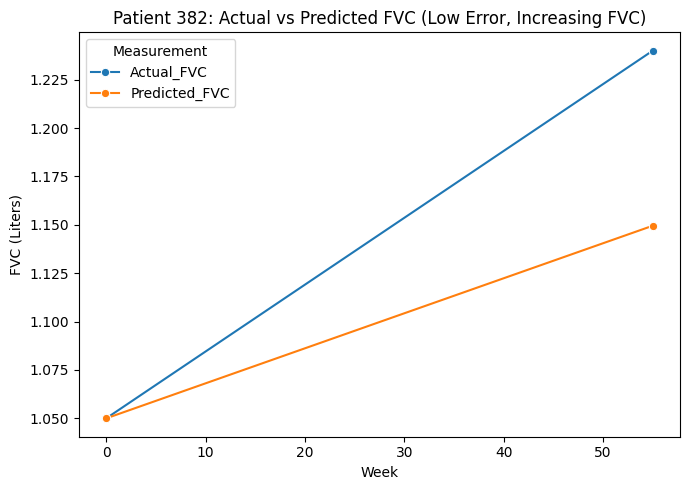

/home/pansurya/.venv/lib64/python3.9/site-packages/shap/explainers/_linear.py:99: FutureWarning: The feature_perturbation option is now deprecated in favor of using the appropriate masker (maskers.Independent, maskers.Partition or maskers.Impute).
  warnings.warn(wmsg, FutureWarning)


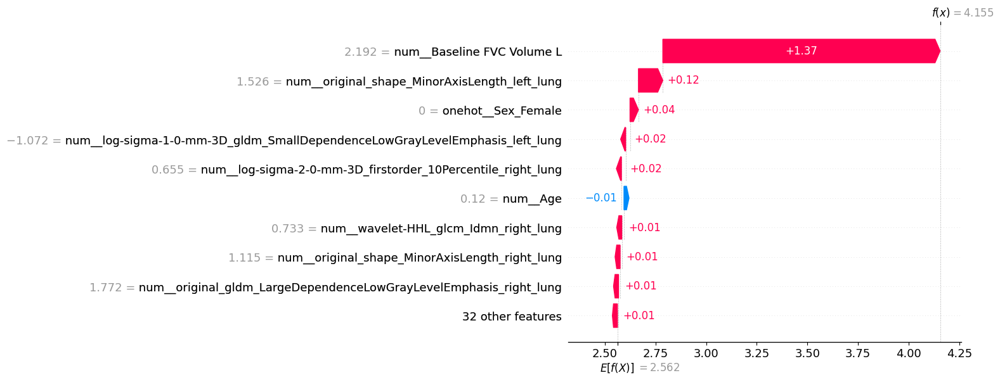

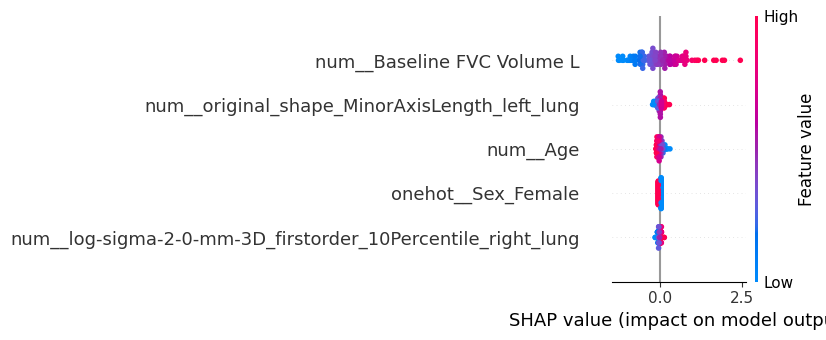

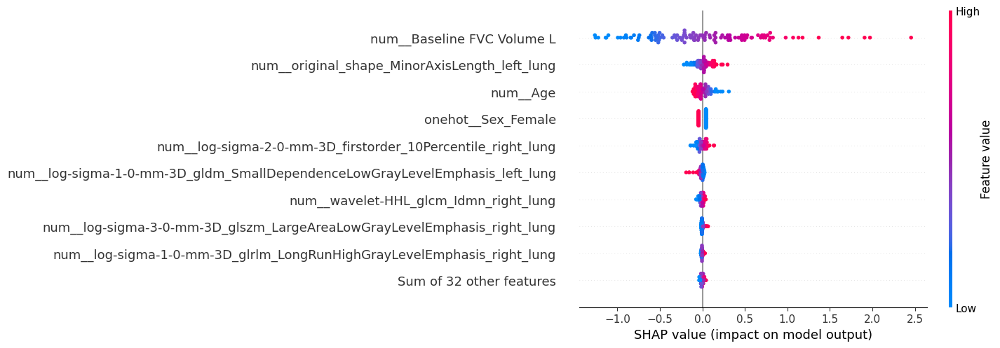

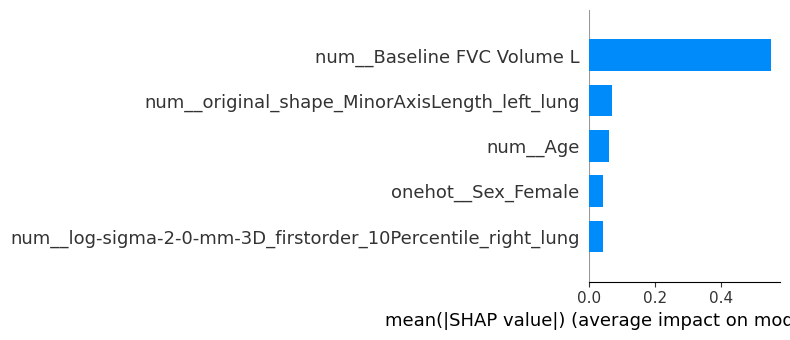

In [ ]:
selected_features = ['original_shape_MinorAxisLength_left_lung', 'wavelet-HLH_gldm_DependenceNonUniformityNormalized_right_lung', 'log-sigma-2-0-mm-3D_firstorder_10Percentile_right_lung', 'original_shape_MinorAxisLength_right_lung', 'wavelet-HHL_glcm_Idmn_right_lung', 'original_shape_SurfaceArea_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glcm_InverseVariance_right_lung', 'log-sigma-2-0-mm-3D_firstorder_Kurtosis_left_lung', 'log-sigma-1-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-3-0-mm-3D_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'log-sigma-1-0-mm-3D_gldm_SmallDependenceLowGrayLevelEmphasis_left_lung', 'log-sigma-4-0-mm-3D_glcm_InverseVariance_right_lung', 'wavelet-LHL_glcm_Idmn_left_lung', 'log-sigma-1-0-mm-3D_firstorder_Skewness_left_lung', 'wavelet-HLL_firstorder_Kurtosis_left_lung']
Clinical_Contineous_data_ext = selected_features + Clinical_Contineous_data
print(Clinical_Contineous_data_ext)
X_train, X_test, y_train, y_test = joblib.load("/home/pansurya/OSIC_thesis/radiomics_files/data_splits_clinical_without_harmonization.pkl")
X_train_clini_log = X_train.copy()
X_test_clini_log  = X_test.copy()

# Transform Age
for col in ['Age']:
    X_train_clini_log[col] = np.log(X_train_clini_log[col])
    X_test_clini_log[col] = np.log(X_test_clini_log[col])

# Median imputation (only needed if missing values exist)
imp_median = SimpleImputer(strategy='median')
imp_median.fit(X_train_clini_log)

X_train_median_filled = pd.DataFrame(
    imp_median.transform(X_train_clini_log),
    columns=X_train_clini_log.columns,
    index=X_train_clini_log.index
)

X_test_median_filled = pd.DataFrame(
    imp_median.transform(X_test_clini_log),
    columns=X_test_clini_log.columns,
    index=X_test_clini_log.index
)


# Run experiments
results1 = train_and_evaluate_lasso(X_train_median_filled, X_test_median_filled, y_train, y_test, selected_features, Clinical_Contineous_data_ext, Clinical_Categorical_data, model_name="/home/pansurya/OSIC_thesis/LASSO_model/Correlation_based_Using_mrmr_without_harmonization.pkl")
# print("Running LOOCV experiment...")
# results1 = train_and_evaluate_with_LOOCV(X_train, X_test, y_train, y_test, selected_features, model_name="/home/pansurya/OSIC_thesis/Linear_model/PAM_ANOVA_VIF_LOOCV.pkl")


original_shape_MinorAxisLength_left_lung


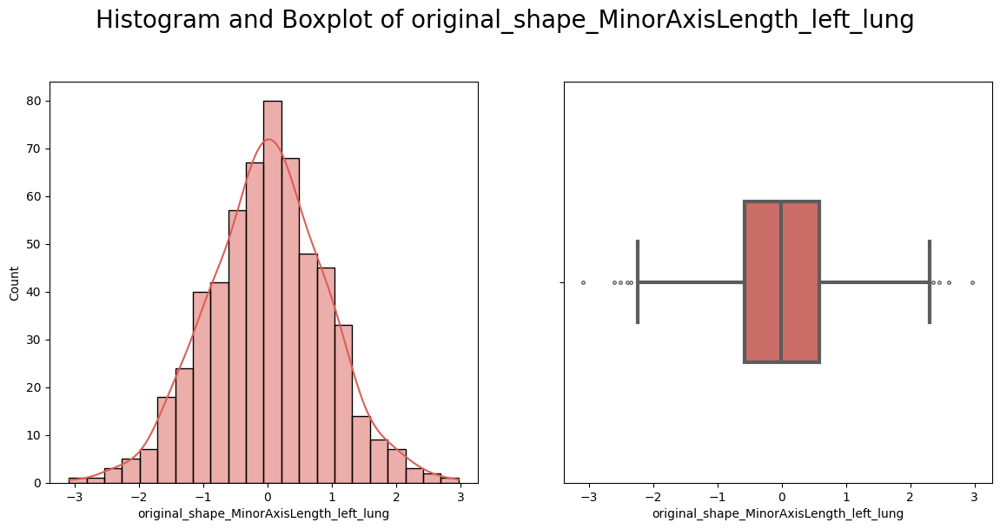

original_firstorder_MeanAbsoluteDeviation_right_lung


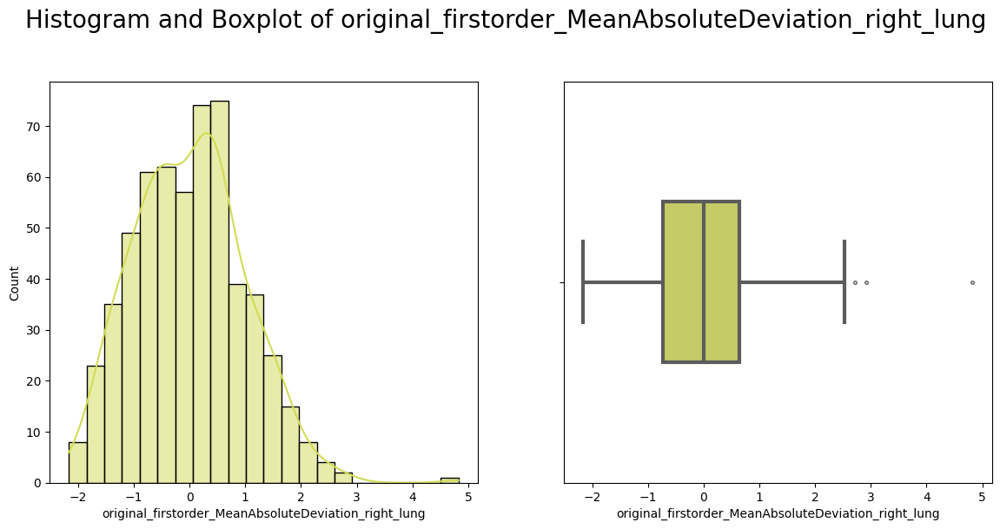

log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung


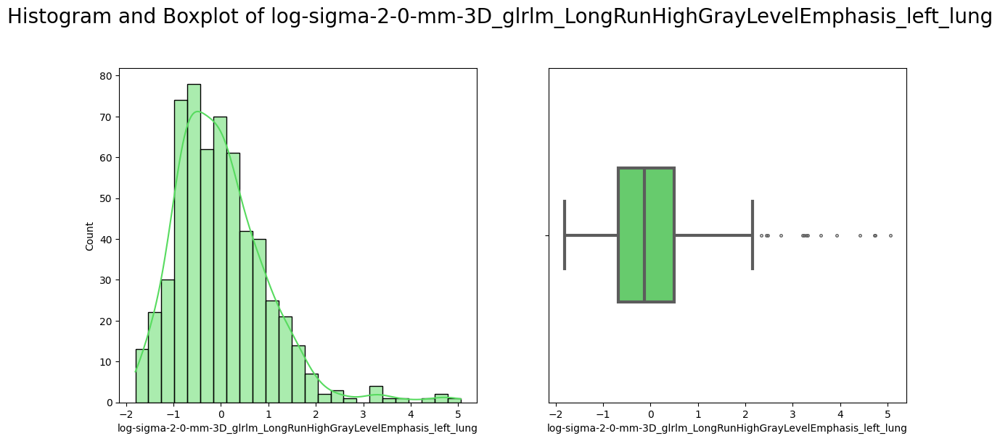

log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung


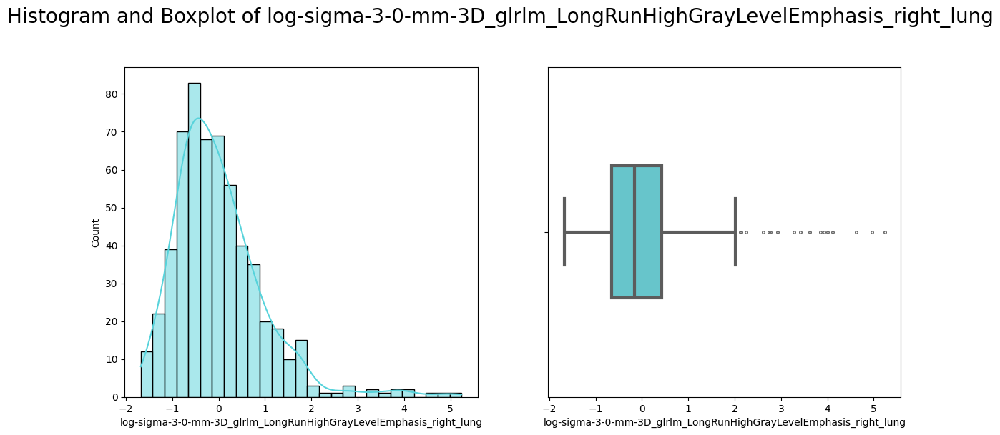

log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung


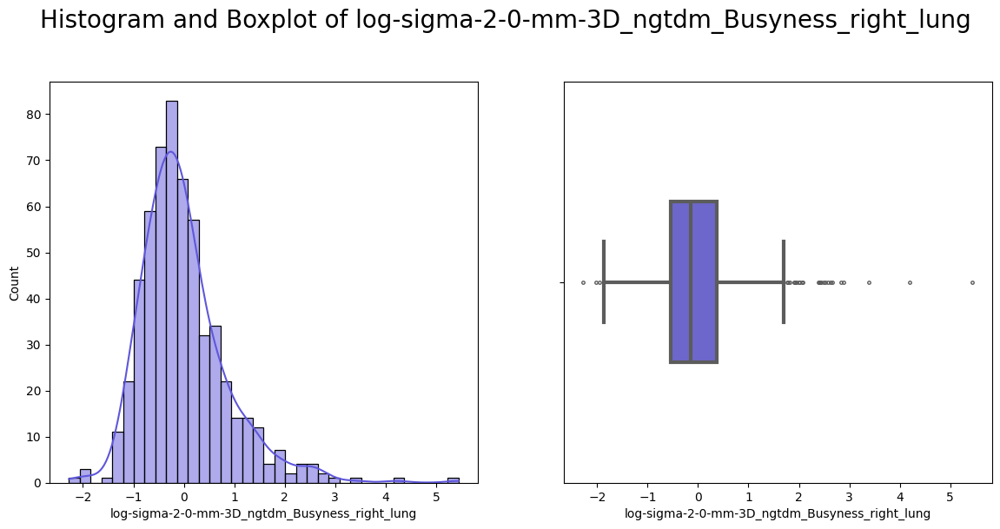

original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung


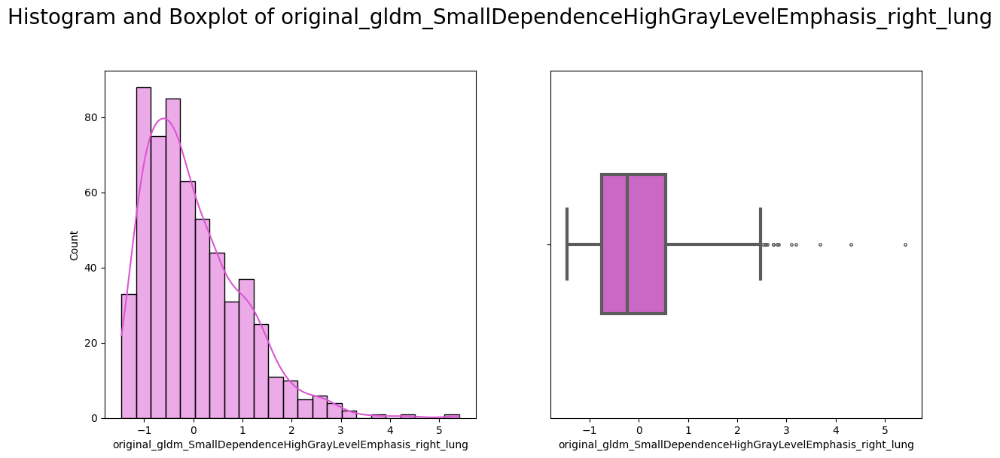

In [ ]:
radiomics_features = ['original_shape_MinorAxisLength_left_lung', 'original_firstorder_MeanAbsoluteDeviation_right_lung', 'log-sigma-2-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_left_lung', 'log-sigma-3-0-mm-3D_glrlm_LongRunHighGrayLevelEmphasis_right_lung', 'log-sigma-2-0-mm-3D_ngtdm_Busyness_right_lung', 'original_gldm_SmallDependenceHighGrayLevelEmphasis_right_lung']
Selected_Radiomics_Features = X_harmonized[radiomics_features]
Selected_Radiomics_Features.skew() # -0.5 to 0.5 then not skew
for idx, col in enumerate([i for i in Selected_Radiomics_Features.columns if i != 'sex1']):
    print(col)
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize = (14, 6))
    sns.histplot(Selected_Radiomics_Features, x = Selected_Radiomics_Features[col], kde = True,
                 color = sns.color_palette("hls", len([i for i in Selected_Radiomics_Features.columns if i != 'sex1']))[idx], ax = ax1)
    sns.boxplot(x = Selected_Radiomics_Features[col], width = 0.4, linewidth = 3, fliersize = 2.5,
                color = sns.color_palette("hls", len([i for i in Selected_Radiomics_Features.columns if i != 'sex1']))[idx], ax = ax2)
    fig.suptitle(f"Histogram and Boxplot of {col}", size = 20, y = 1.02)
    plt.show()

In [ ]:
# Fraction of missing values per column
dicom_col_missing_fraction = DICOM_metadata_csv.isna().mean()
print(dict(dicom_col_missing_fraction*100))
# Columns with >80% missing
dicom_cols_with_many_nans = dicom_col_missing_fraction[dicom_col_missing_fraction > 0].index.tolist()
print(dicom_cols_with_many_nans)
len(dicom_cols_with_many_nans)

{'Path': np.float64(0.0), 'Patient Name': np.float64(0.0), 'Patient ID': np.float64(0.0), 'Study UID': np.float64(0.0), 'SeriesInstanceUID': np.float64(0.0), 'Acquisition Date': np.float64(0.0), 'Acquisition Time': np.float64(10.871694417238002), 'Manufacturer': np.float64(0.0), 'Model': np.float64(51.38752856676461), 'Series Description': np.float64(6.3989552726085535), 'Scan Options': np.float64(15.017956252040483), 'kVp': np.float64(0.0), 'Algorithm': np.float64(0.0), 'Pitch': np.float64(7.998694090760693), 'Calc Pitch': np.float64(62.42246163891609), 'Dose Modulation': np.float64(0.0), 'Thickness (mm)': np.float64(0.0326477309826967), 'Interval (mm)': np.float64(0.0), 'Calc Interval (mm)': np.float64(97.35553379040157), 'X-ray Tube Current': np.float64(5.3542278811622595), 'Exposure': np.float64(0.0), 'Exposure Time': np.float64(6.725432582435522), 'DFOV': np.float64(7.345739471106757), 'CTDivol': np.float64(24.7143323539014), 'Data Collection Diameter': np.float64(4.96245510936989

17

In [ ]:
import joblib

# Load the exact same split
X_train, X_test, y_train, y_test = joblib.load("data_splits.pkl")

selected_features = ['original_shape_MinorAxisLength_right_lung', 'original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung', 'original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung', 'wavelet-LLH_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'wavelet-HHL_ngtdm_Contrast_right_lung', 'wavelet-HLH_firstorder_Skewness_left_lung', 'wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung', 'log-sigma-5-0-mm-3D_glcm_ClusterShade_right_lung', 'original_shape_MinorAxisLength_left_lung', 'wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung', 'log-sigma-5-0-mm-3D_firstorder_Maximum_left_lung', 'Baseline FVC Volume L', 'Sex_Female', 'Sex_Male']

# Subset the splits
X_train = X_train[selected_features]
print("Train shape:", X_train.shape)
X_test  = X_test[selected_features]
print("Train shape:", X_test.shape)

Train shape: (454, 15)
Train shape: (114, 15)


In [ ]:
X_train

,original_shape_MinorAxisLength_right_lung,original_glszm_LargeAreaLowGrayLevelEmphasis_right_lung,original_gldm_LargeDependenceLowGrayLevelEmphasis_right_lung,wavelet-LLH_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung,wavelet-LHH_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung,wavelet-HHL_ngtdm_Contrast_right_lung,wavelet-HLH_firstorder_Skewness_left_lung,wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_right_lung,log-sigma-5-0-mm-3D_glcm_ClusterShade_right_lung,original_shape_MinorAxisLength_left_lung,wavelet-HHL_gldm_LargeDependenceHighGrayLevelEmphasis_left_lung,log-sigma-5-0-mm-3D_firstorder_Maximum_left_lung,Baseline FVC Volume L,Sex_Female,Sex_Male
248,181.627868,3888.267908,0.268429,18780.442086,8187.595412,0.010206,0.157083,7086.989125,9.400098,171.245772,8204.744928,414.816956,1.88,1,0
88,162.476525,25454.281989,2.419681,125915.242463,30190.116945,0.003927,0.198537,5525.563539,-24.922958,158.969450,3683.580834,572.647156,2.37,0,1
334,157.596573,95133.020737,3.084828,93756.250727,41390.045974,0.006815,0.446353,19735.473391,269.413191,149.825881,22244.873112,533.023560,2.59,0,1
362,198.159856,57.132625,0.379418,53335.466391,13239.298348,0.025940,0.173508,10815.043720,-103.558061,170.495241,11427.143413,443.837646,3.57,0,1
33,143.598627,7996.539900,4.643912,82540.225268,24387.516903,0.010290,0.347239,24069.621851,83.525984,138.286575,14969.045806,573.426636,3.61,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
71,190.095910,11862.859898,1.123933,55964.608417,25406.756465,0.014414,0.231632,12095.797937,86.324524,191.762231,12053.610336,511.564575,4.67,0,1
106,158.205426,6251.627517,1.039848,2236.853460,1296.193960,0.024030,0.217358,21345.824596,-89.147856,152.400339,22064.285419,493.455292,2.35,0,1
270,150.440113,19934.217775,1.468432,81308.552360,20316.702344,0.009215,0.110850,14924.178903,117.594738,149.830160,22742.956807,557.462646,1.14,1,0
435,147.151382,648.677225,0.988796,47036.260128,14726.507123,0.060714,0.152060,16517.609793,118.595802,165.129313,14599.441437,485.973450,1.66,0,1
